## Import packages

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import shapely
import numpy as np
import networkx as nx
import folium
import math
import datetime
import fsspec
import pickle
import pyproj
import copy
from shapely.geometry import Polygon, MultiLineString, LineString, Point
from shapely.ops import cascaded_union, nearest_points, split, linemerge,unary_union
from collections import Counter
from osgeo import gdal, ogr
from os import listdir
from os.path import isfile, join
#import salem

In [2]:
path = r'C://Users//floorbakker//OpenTNSim//notebooks//Rio_de_la_Plata//geospatial_data//'
    
# srcDS = gdal.OpenEx(path+'Berths Puerto de Buenos Aires Dock Sur.kml')
# ds = gdal.VectorTranslate(path + 'berths_puerto_buenos_aires_sur.geojson', srcDS, format='GeoJSON')
berths = gpd.read_file(path + 'berths_puerto_buenos_aires_sur.geojson')
polygonized_berths = []
for berth in berths.geometry[0].geoms:
    polygonized_berths.append(shapely.ops.transform(lambda x, y, z=None: (x, y),Polygon(berth)))
berths_puerto_buenos_aires_sur = gpd.GeoDataFrame(polygonized_berths)

In [3]:
# srcDS = gdal.OpenEx(path+'Berths Puerto de Buenos Aires Norte.kml')
# ds = gdal.VectorTranslate(path + 'berths_puerto_buenos_aires_norte.json', srcDS, format='GeoJSON')
berths = gpd.read_file(path + 'berths_puerto_buenos_aires_norte.json')
polygonized_berths = []
for berth in berths.geometry[0].geoms:
    polygonized_berths.append(shapely.ops.transform(lambda x, y, z=None: (x, y),Polygon(berth)))
berths_puerto_buenos_aires_norte = gpd.GeoDataFrame(polygonized_berths)

In [4]:
# srcDS = gdal.OpenEx(path+'Berths Puerto de La Plata.kml')
# ds = gdal.VectorTranslate(path + 'berths_puerto_la_plata.json', srcDS, format='GeoJSON')
berths = gpd.read_file(path + 'berths_puerto_la_plata.json')
polygonized_berths = []
for berth in berths.geometry[0].geoms:
    polygonized_berths.append(shapely.ops.transform(lambda x, y, z=None: (x, y),Polygon(berth)))
berths_puerto_la_plata = gpd.GeoDataFrame(polygonized_berths)

In [5]:
rivers_1 = gpd.read_file(path+"water_area//export (88).geojson")
rivers_2 = gpd.read_file(path+"water_area//export (89).geojson")
rivers_3 = gpd.read_file(path+"water_area//export (90).geojson")
rivers_4 = gpd.read_file(path+"water_area//export (91).geojson")
rivers_5 = gpd.read_file(path+"water_area//export (92).geojson")
rivers_6 = gpd.read_file(path+"water_area//export (93).geojson")
rivers_7 = gpd.read_file(path+"water_area//export (94).geojson")
rivers_8 = gpd.read_file(path+"water_area//export (95).geojson")
rivers_9 = gpd.read_file(path+"water_area//export (96).geojson")
rivers_10 = gpd.read_file(path+"water_area//export (97).geojson")

In [6]:
df_list = [rivers_1,rivers_2,rivers_3,rivers_4,rivers_5,rivers_6,rivers_7,rivers_8,rivers_9,rivers_10]

polygon_list = []
for _,df in enumerate(df_list):
    Polygons = cascaded_union(list(df['geometry'])) 
    if Polygons.geom_type == 'MultiPolygon':
        for poly in Polygons.geoms:
            polygon_list.append(poly)
        continue

    if Polygons.geom_type == 'Polygon':
        polygon_list.append(Polygons)
    
gdf = gpd.GeoDataFrame(polygon_list,columns=['geometry'])

C:\Users\floorbakker\AppData\Local\Temp\ipykernel_5276\2400796619.py:5: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  Polygons = cascaded_union(list(df['geometry']))


## Import data

### AIS data

In [7]:
# data=pd.read_table(r'C:\Users\floorbakker\Documents\Rio de la Plata\Data\02_AIS data_processed\211101.log', delimiter = ';', nrows=10000, names= np.linspace(0,11,12), header=None, encoding = 'ISO-8859-1')

In [8]:
# def data_splitter(data):    
#     columns_A = ['MMSI','Nav_Status','ROT','SOG','Lat','Lon','COG','Heading','Precision','Datetime','Channel']
#     columns_B = ['MMSI','Date','Time','Lat','Lon','Flag','NextDatetime','Channel']
#     columns_C = ['MMSI','IMO','Callsign','Name','Vesseltype','ETA','Dim','Datetime','Channel']
#     columns_D = ['MMSI','Name','Callsign','LR','Lat','Lon','Flag','AtoNDim','Precision','OnOffPosConfirm','Datetime','Channel']
#     data_A = pd.DataFrame(columns = columns_A)
#     data_B = pd.DataFrame(columns = columns_B)
#     data_C = pd.DataFrame(columns = columns_C)
#     data_D = pd.DataFrame(columns = columns_D)
#     data_incomplete = pd.DataFrame(columns = columns_D)
#     for index,row in data.iterrows():
#         filtered_row = [x for x in row if type(x) == str or np.isnan(x) == False]
#         if len(filtered_row) == 11:
#             data_A = pd.concat([data_A,pd.DataFrame({columns_A[item[0]]: item[1] for item in enumerate(filtered_row)},index=[index])])
#         elif len(filtered_row) == 8:
#             data_B = pd.concat([data_B,pd.DataFrame({columns_B[item[0]]: item[1] for item in enumerate(filtered_row)},index=[index])])
#         elif len(filtered_row) == 9:
#             data_C = pd.concat([data_C,pd.DataFrame({columns_C[item[0]]: item[1] for item in enumerate(filtered_row)},index=[index])])
#         elif len(filtered_row) == 12:
#             data_D = pd.concat([data_D,pd.DataFrame({columns_D[item[0]]: item[1] for item in enumerate(filtered_row)},index=[index])])
#         else:
#             data_incomplete = pd.concat([data_incomplete,pd.DataFrame({columns_D[item[0]]: item[1] for item in enumerate(row)},index=[index])])
#     return data_A, data_B, data_C, data_D, data_incomplete

In [9]:
# def message_filter(data):
#     columns_A = ['MMSI','Nav_Status','ROT','SOG','Lat','Lon','COG','Heading','Precision','Datetime','Channel']
#     data_A = pd.DataFrame(columns = columns_A)
#     for index,row in data.iterrows():
#         if '[1]' in row['Channel']:
#             data_A = pd.concat([data_A,pd.DataFrame({columns_A[item[0]]: item[1] for item in enumerate(row)},index=[index])])
#     return data_A

In [10]:
# def convert_coordinate_strings_to_floats(data):
#     data['Lat'] = [-float(value.replace('S','')) for value in data['Lat']]
#     data['Lon'] = [-float(value.replace('W','')) for value in data['Lon']]
#     return data

In [11]:
# data_A,_,_,_,_ = data_splitter(data)

In [12]:
# data_A_filtered = message_filter(data_A)

In [13]:
# converted_data_A_filtered = convert_coordinate_strings_to_floats(data_A_filtered)

### Geographic data

In [14]:
mypath = r'C:\Users\floorbakker\Documents\Rio de la Plata\Data\Geo\Earth'
additional_waterways = [f for f in listdir(mypath) if isfile(join(mypath, f)) and f.split('.')[1] == 'kmz']

In [15]:
added_waterways = {}
for i,additional_waterway in enumerate(additional_waterways):
    srcDS = gdal.OpenEx(mypath+'\\'+additional_waterway)
    gdal.VectorTranslate(mypath+'\\additional_waterway_'+str(i)+'.geojson', srcDS, format='GeoJSON')
    added_waterways[i] = gpd.read_file(mypath+'\\additional_waterway_'+str(i)+'.geojson')

C:\Users\floorbakker\Anaconda3\envs\opentnsim\lib\site-packages\osgeo\gdal.py:287: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


In [16]:
def _to_2d(x, y, z):
    return tuple(filter(None, [x, y]))

dataframe = pd.DataFrame()
for waterway in added_waterways:
    added_waterways[waterway]['geometry'] = shapely.ops.transform(_to_2d, added_waterways[waterway].iloc[0]['geometry'])
    dataframe = pd.concat([dataframe,added_waterways[waterway]])
    
#added_waterway = gpd.GeoDataFrame(dataframe)

In [17]:
additional_terminals = pd.read_csv(mypath+'\\Terminals.txt', sep=",", header=None, names=['Name','Lat','Long'])
additional_terminals = additional_terminals.reindex(columns=['Long','Lat','Name'])

In [18]:
terminal_locations = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//puntos_de_puertos_y_muelles_BB005.csv',delimiter=';',index_col=0, header=0, encoding = 'ISO-8859-1')

In [19]:
redundant_terminals = ['Puerto La Plata',
                       'Puerto Dock Sud', 
                       'Puerto Buenos Aires', 
                       'Terminal 1, 2 y 3 - Terminales Rio de la Plata (Puerto de Buenos Aires)',
                       'Terminal 4 - APM (Puerto de Buenos Aires)',
                       'Terminal 5 - BACTSSA (Puerto de Buenos Aires)',
                       'Puerto San Nicolas']

In [20]:
terminal_locations = pd.concat([terminal_locations,additional_terminals])
terminal_locations = terminal_locations[~terminal_locations['Name'].isin(redundant_terminals)].reset_index()
terminal_locations.drop(columns='index')

,Long,Lat,Name
0,-60.757643,-32.618380,Puerto ACA Timbues
1,-60.755737,-32.624713,Puerto AGD Timbues
2,-59.177763,-33.759697,Puerto Ibicuy
3,-58.883708,-33.902298,Puerto del Guazu S.A.
4,-60.704843,-31.656797,Puerto Santa Fe
...,...,...,...
95,-56.224583,-34.913649,Puerto Montevideo
96,-58.429198,-33.883616,Rio Uruguay
97,-55.167492,-35.054173,Zona De Alijo Alpha
98,-59.294114,-33.607936,Puerto Mazaruca


In [21]:
terminal_locations

,index,Long,Lat,Name
0,1,-60.757643,-32.618380,Puerto ACA Timbues
1,2,-60.755737,-32.624713,Puerto AGD Timbues
2,3,-59.177763,-33.759697,Puerto Ibicuy
3,4,-58.883708,-33.902298,Puerto del Guazu S.A.
4,5,-60.704843,-31.656797,Puerto Santa Fe
...,...,...,...,...
95,26,-56.224583,-34.913649,Puerto Montevideo
96,27,-58.429198,-33.883616,Rio Uruguay
97,28,-55.167492,-35.054173,Zona De Alijo Alpha
98,29,-59.294114,-33.607936,Puerto Mazaruca


In [22]:
rivers_1 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (1).geojson")
rivers_2 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (2).geojson")
rivers_3 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (3).geojson")
rivers_4 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (4).geojson")
rivers_5 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (5).geojson")
rivers_6 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (6).geojson")
rivers_7 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (7).geojson")
rivers_8 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (8).geojson")
rivers_9 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (9).geojson")
rivers_10 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (10).geojson")
rivers_11 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (11).geojson")
rivers_12 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (12).geojson")
rivers_13 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (13).geojson")
rivers_14 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (14).geojson")
rivers_15 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (15).geojson")
rivers_16 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (16).geojson")
rivers_17 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (17).geojson")
rivers_18 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (18).geojson")
rivers_19 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (19).geojson")
rivers_20 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (20).geojson")
rivers_21 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (21).geojson")
rivers_22 = gpd.read_file(r"C://Users//floorbakker//Documents//Rio de la Plata//Data//Geo//Landboundaries//export (72).geojson")

In [23]:
#rivers_1
df_list = [rivers_1,rivers_2,rivers_3,rivers_4,rivers_5,rivers_6,rivers_7,rivers_8,rivers_9,rivers_10,rivers_11,rivers_12,rivers_13,rivers_14,rivers_15,rivers_16,rivers_17,rivers_18,rivers_19,rivers_20,rivers_21,rivers_22]

polygon_list = []
for _,df in enumerate(df_list):
    Polygons = cascaded_union(list(df['geometry'])) 
    if Polygons.geom_type == 'MultiPolygon':
        for poly in Polygons.geoms:
            polygon_list.append(poly)
        continue

    if Polygons.geom_type == 'Polygon':
        polygon_list.append(Polygons)
    
gdf = gpd.GeoDataFrame(polygon_list,columns=['geometry'])

C:\Users\floorbakker\AppData\Local\Temp\ipykernel_5276\3069627406.py:6: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  Polygons = cascaded_union(list(df['geometry']))


In [24]:
gdf = gdf.drop(1)

In [25]:
fairway_1 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (1).geojson")
fairway_2 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (2).geojson")
fairway_3 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (3).geojson")
fairway_4 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (4).geojson")
fairway_5 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (5).geojson")
fairway_6 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (6).geojson")
fairway_7 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (7).geojson")
fairway_8 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (8).geojson")
fairway_9 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (9).geojson")
fairway_10 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (10).geojson")
fairway_11 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (11).geojson")
fairway_12 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (12).geojson")
fairway_13 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (13).geojson")
fairway_14 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (14).geojson")
fairway_15 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (15).geojson")
fairway_16 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (16).geojson")
fairway_17 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (17).geojson")
fairway_18 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (18).geojson")
fairway_19 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (19).geojson")
fairway_20 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (20).geojson")
fairway_21 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (21).geojson")
fairway_22 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (22).geojson")
fairway_23 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (23).geojson")
fairway_24 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Fairway\\export (24).geojson")

#Manually adjust fairway_17
points = []
for x,y in fairway_17['geometry'][0].coords:
    if x < -60.125 or x > -60.05:
        continue
    points.append(Point(x,y))
line = LineString(points)
fairway_17['geometry'] = line

fairways = gpd.GeoDataFrame(pd.concat([fairway_1,fairway_2,fairway_3,fairway_4,fairway_5,fairway_6,fairway_7,fairway_8,fairway_9,fairway_10,fairway_11,fairway_12,fairway_13,fairway_14,fairway_15,fairway_16,fairway_17,fairway_18,fairway_19,fairway_20,fairway_21,fairway_22,fairway_23,fairway_24,dataframe], ignore_index=True))

In [26]:
anchorage_1 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Anchorage\\export (1).geojson")
anchorage_2 = gpd.read_file("C:\\Users\\floorbakker\\Documents\\Rio de la Plata\\Data\\Geo\\Anchorage\\export (2).geojson")
anchorage_areas = gpd.GeoDataFrame(pd.concat([anchorage_1,anchorage_2], ignore_index=True))
anchorage_areas['geometry'] = [Polygon(geom) for geom in anchorage_areas['geometry']] 

## Visualization of geographic data

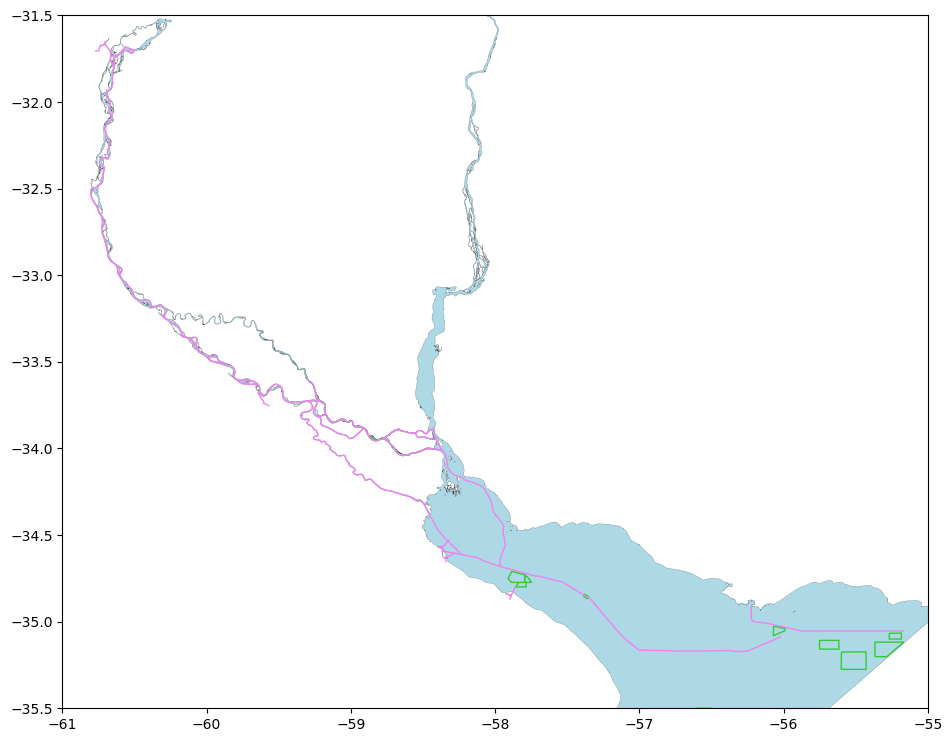

In [27]:
fig,ax = plt.subplots(figsize=[16,9])
water_color = 'lightblue'
boundary_color = 'k'
fairway_color = 'violet'
anchorage_color = 'limegreen'
gdf.plot(ax=ax,facecolor=water_color,edgecolor=boundary_color,linewidth=0.1)
fairways.plot(ax=ax,edgecolor=fairway_color,linewidth=1)
anchorage_areas.plot(ax=ax,facecolor=water_color,edgecolor=anchorage_color,linewidth=1)
plt.xlim([-61,-55])
plt.ylim([-35.5,-31.5])
plt.show()

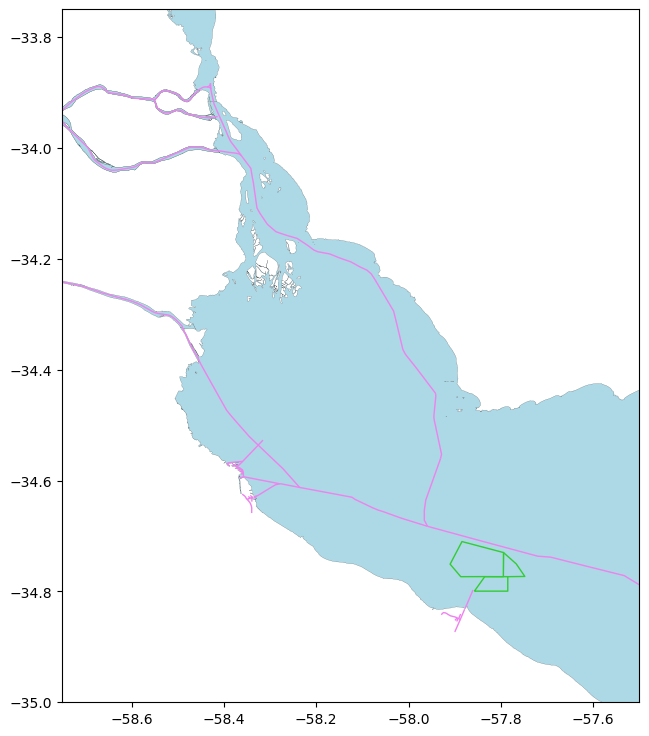

In [28]:
fig,ax = plt.subplots(figsize=[16,9])
water_color = 'lightblue'
boundary_color = 'k'
fairway_color = 'violet'
anchorage_color = 'limegreen'
gdf.plot(ax=ax,facecolor=water_color,edgecolor=boundary_color,linewidth=0.1)
fairways.plot(ax=ax,edgecolor=fairway_color,linewidth=1)
anchorage_areas.plot(ax=ax,facecolor=water_color,edgecolor=anchorage_color,linewidth=1)
plt.xlim([-58.75,-57.5])
plt.ylim([-35,-33.75])
plt.show()

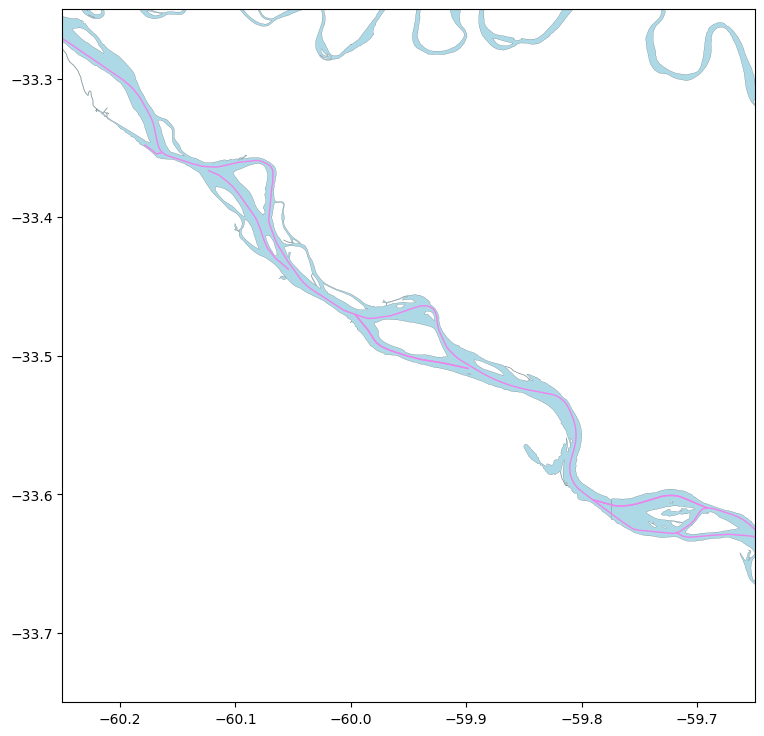

In [29]:
fig,ax = plt.subplots(figsize=[16,9])
water_color = 'lightblue'
boundary_color = 'k'
fairway_color = 'violet'
anchorage_color = 'limegreen'
gdf.plot(ax=ax,facecolor=water_color,edgecolor=boundary_color,linewidth=0.1)
fairways.plot(ax=ax,edgecolor=fairway_color,linewidth=1)
anchorage_areas.plot(ax=ax,facecolor=water_color,edgecolor=anchorage_color,linewidth=1)
plt.xlim([-60.25,-59.65])
plt.ylim([-33.75,-33.25])
plt.show()

## Network

### Raw network

In [30]:
FG = nx.MultiGraph()

previous_number_of_nodes = 0
for geometry in fairways['geometry']:
    for geom in enumerate(geometry.xy[0]):
        lat = geometry.xy[1][geom[0]]
        lon = geom[1]
        FG.add_node(str((lat,lon)), position = (lat,lon), geometry = Point(lon,lat))
    
    number_of_nodes = len(FG.nodes)
    for node_index,node_name in enumerate(list(FG.nodes)[previous_number_of_nodes:number_of_nodes]):
        if node_index == 0: 
            continue
        else:  
            node_index = node_index + previous_number_of_nodes
            FG.add_edge(list(FG.nodes)[node_index-1], node_name, geometry = LineString([FG.nodes[list(FG.nodes)[node_index-1]]['geometry'],FG.nodes[node_name]['geometry']]))
    previous_number_of_nodes = number_of_nodes

In [31]:
terminal_locations

,index,Long,Lat,Name
0,1,-60.757643,-32.618380,Puerto ACA Timbues
1,2,-60.755737,-32.624713,Puerto AGD Timbues
2,3,-59.177763,-33.759697,Puerto Ibicuy
3,4,-58.883708,-33.902298,Puerto del Guazu S.A.
4,5,-60.704843,-31.656797,Puerto Santa Fe
...,...,...,...,...
95,26,-56.224583,-34.913649,Puerto Montevideo
96,27,-58.429198,-33.883616,Rio Uruguay
97,28,-55.167492,-35.054173,Zona De Alijo Alpha
98,29,-59.294114,-33.607936,Puerto Mazaruca


In [32]:
m = folium.Map(location=[-34.5,-58], zoom_start = 8,tiles="cartodbpositron")

for node in FG.nodes(data = True):
    points_x = list(node[1]["geometry"].coords.xy[0])
    points_y = list(node[1]["geometry"].coords.xy[1])
    
    point = []
    for i, _ in enumerate(points_x):
        point.append((points_y[i], points_x[i]))
    else:
        folium.Circle(point[0], radius=12,fill=True,fill_opacity=1,tooltip = node[0],popup =node[0]).add_to(m)

for edge in FG.edges(data = True):
    points_x = list(edge[2]["geometry"].coords.xy[0])
    points_y = list(edge[2]["geometry"].coords.xy[1])
    
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))
    
    else:
        popup = folium.Popup(width=500, height=300)
        folium.PolyLine(line, weight = 3, tooltip = [edge[0],edge[1]], popup = [edge[0],edge[1]]).add_to(m)
        
for terminal,_ in enumerate(terminal_locations['Long']):
    points_x = terminal_locations['Lat'][terminal]
    points_y = terminal_locations['Long'][terminal]
    name = terminal_locations['Name'][terminal]

    point = (points_x, points_y)
    folium.Circle(point, radius=12, color='red',fill=True,fill_opacity=1,tooltip = name,popup = name).add_to(m)

m

### Simplified network

In [33]:
def find_closest_edge(G, point):
    """find the closest edge on the graph from a given point"""
    
    distance = np.full((len(G.edges)), fill_value=np.nan)
    for ii, e in enumerate(G.edges):
        distance[ii] = point.distance(G.edges[e]['geometry'])
    name_edge = list(G.edges)[np.argmin(distance)]
    distance_edge = np.min(distance)
    
    return name_edge, distance_edge

def find_closest_node(G, point):
    """find the closest node on the graph from a given point"""
    
    distance = np.full((len(G.nodes)), fill_value=np.nan)
    for ii, n in enumerate(G.nodes):
        distance[ii] = point.distance(G.nodes[n]['geometry'])
    name_node = list(G.nodes)[np.argmin(distance)]
    distance_node = np.min(distance)
    
    return name_node, distance_node

In [34]:
geod = pyproj.Geod(ellps="WGS84")
edges = []
for terminal in terminal_locations.index:
    point = Point(terminal_locations['Long'][terminal],terminal_locations['Lat'][terminal])
    edge,_ = find_closest_edge(FG,point)
    edges.append(edge)

In [35]:
terminal_locations_network = []
for index,edge in enumerate(edges):
    terminal_location = Point(terminal_locations['Long'].iloc[index],terminal_locations['Lat'].iloc[index])
    
    angle,_,_ = geod.inv(FG.edges[edge]['geometry'].xy[0][0], 
                         FG.edges[edge]['geometry'].xy[1][0], 
                         FG.edges[edge]['geometry'].xy[0][1], 
                         FG.edges[edge]['geometry'].xy[1][1])

    _,_,distance = geod.inv(FG.edges[edge]['geometry'].xy[0][0], 
                            FG.edges[edge]['geometry'].xy[1][0], 
                            terminal_location.x,
                            terminal_location.y)
    
    lon,lat,_ = geod.fwd(terminal_locations['Long'].iloc[index],
                         terminal_locations['Lat'].iloc[index],
                         angle-90, 2*distance)
    
    point = FG.edges[edge]['geometry'].intersection(LineString([Point(lon,lat),Point(terminal_locations['Long'].iloc[index],terminal_locations['Lat'].iloc[index])]))
    
    if 'x' not in dir(point):
        lon,lat,_ = geod.fwd(terminal_locations['Long'].iloc[index],
                             terminal_locations['Lat'].iloc[index],
                             angle+90, 2*distance)
    
        point = FG.edges[edge]['geometry'].intersection(LineString([Point(lon,lat),Point(terminal_locations['Long'].iloc[index],terminal_locations['Lat'].iloc[index])]))

    if 'x' not in dir(point):    
        node,_ = find_closest_node(FG,terminal_location)
        
        point = FG.nodes[node]['geometry']
    
    terminal_locations_network.append(point)

C:\Users\floorbakker\Anaconda3\envs\opentnsim\lib\site-packages\shapely\set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


In [36]:
terminal_locations_network.append(Point((-59.620142,-33.6918346)))
terminal_locations_network.append(Point((-59.6245837,-33.6876925)))
terminal_locations_network.append(Point((-59.6419859,-33.6335946)))
terminal_locations_network.append(Point((-59.7220445,-33.6281097)))
terminal_locations_network.append(Point((-59.8841143,-33.5134721)))
terminal_locations_network.append(Point((-59.9900508,-33.4719026)))
terminal_locations_network.append(Point((-60.0409484,-33.4471805)))
terminal_locations_network.append(Point((-60.1370444,-33.3615007)))
terminal_locations_network.append(Point((-60.5973244,-33.012838)))
terminal_locations_network.append(Point((-60.6336093,-32.9383323)))
terminal_locations_network.append(Point((-58.4062815,-33.9494121)))
terminal_locations_network.append(Point((-58.5580945,-33.9121489)))

In [37]:
new_geom = []
geom_list = list(fairways['geometry'])
for terminal in range(len(terminal_locations_network)):
    if terminal < len(edges):
        edge = edges[terminal]
        for geom_index,geom in enumerate(geom_list):
            if FG.edges[edge]['geometry'].within(geom):
                node1 = FG.nodes[edge[0]]['geometry']
                for i,(x,y) in enumerate(geom.coords):
                    if Point(x,y).distance(node1) < 1e-8:
                        index1 = i
                
                node2 = FG.nodes[edge[1]]['geometry']
                for i,(x,y) in enumerate(geom.coords):
                    if Point(x,y).distance(node2) < 1e-8:
                        index2 = i
                
                if node1.distance(terminal_locations_network[terminal]) < 1e-8 or node2.distance(terminal_locations_network[terminal]) < 1e-8:
                    lines = split(geom,terminal_locations_network[terminal]).geoms
                    for l in range(len(lines)):
                        line = lines[l]
                        if l == 0:
                            geom_list[geom_index] = line
                        else:
                            geom_list.insert(geom_index+l,line)

                else:
                    index = np.min([index1,index2])
                    x_list_1 = list(geom.coords.xy[0][0:(index+1)])
                    x_list_1.append(terminal_locations_network[terminal].x)
                    y_list_1 = list(geom.coords.xy[1][0:(index+1)])
                    y_list_1.append(terminal_locations_network[terminal].y)
                    points_1 = []
                    for i,_ in enumerate(x_list_1):
                        points_1.append(Point(x_list_1[i],y_list_1[i]))
                    x_list_2 = list(geom.coords.xy[0][(index+1):])
                    x_list_2.insert(0,terminal_locations_network[terminal].x)
                    y_list_2 = list(geom.coords.xy[1][(index+1):])
                    y_list_2.insert(0,terminal_locations_network[terminal].y)
                    points_2 = []
                    for i,_ in enumerate(x_list_2):
                        points_2.append(Point(x_list_2[i],y_list_2[i]))
                        
                    if len(points_1) > 1:  
                        line_1 = LineString(points_1)
                        geom_list[geom_index] = line_1
                    if len(points_2) > 1:
                        line_2 = LineString(points_2)
                        if len(points_1) > 1:
                            geom_list.insert(geom_index+1,line_2)
                        else:
                            geom_list[geom_index] = line_2
                break
    else:
        for geom_index,geom in enumerate(geom_list):
            boolean = False
            for g in geom.coords:
                if Point(g).distance(terminal_locations_network[terminal]) < 1e-8:
                    boolean = True
                    lines = split(geom,terminal_locations_network[terminal]).geoms
                    for l in range(len(lines)):
                        line = lines[l]
                        if l == 0:
                            geom_list[geom_index] = line
                        else:
                            geom_list.insert(geom_index+l,line)
                    break
            if boolean:
                break

In [38]:
FG = nx.MultiGraph()
previous_number_of_nodes = 0
for geometry in geom_list:
    lat_start = geometry.xy[1][0]
    lon_start = geometry.xy[0][0]
    lat_end = geometry.xy[1][-1]
    lon_end = geometry.xy[0][-1]
    start_node = Point(lon_start,lat_start) 
    end_node = Point(lon_end,lat_end)
    name_s = []
    name_e = []
    for terminal,terminal_location in enumerate(terminal_locations_network):
        if start_node.distance(terminal_location) < 1e-8:
            if str((lon_start,lat_start)) in list(FG.nodes):
                if 'terminal' in FG.nodes[str((lon_start,lat_start))]:
                    name_s = FG.nodes[str((lon_start,lat_start))]['terminal']
            elif terminal < len(terminal_locations['Name'])-1:
                name_s.append(terminal_locations['Name'].iloc[terminal])
        elif end_node.distance(terminal_location) < 1e-8:
            if str((lon_end,lat_end)) in list(FG.nodes):
                if 'terminal' in FG.nodes[str((lon_end,lat_end))]:
                    name_e = FG.nodes[str((lon_end,lat_end))]['terminal']
            elif terminal < len(terminal_locations['Name'])-1:
                name_e.append(terminal_locations['Name'].iloc[terminal])
    
    if name_s != []:
        FG.add_node(str((lon_start,lat_start)), terminal = name_s, position = (lon_start,lat_start), geometry = start_node)
    else:
        FG.add_node(str((lon_start,lat_start)), position = (lon_start,lat_start), geometry = start_node)
    if name_e != []:
        FG.add_node(str((lon_end,lat_end)),  terminal = name_e, position = (lon_end,lat_end), geometry = end_node)
    else:
        FG.add_node(str((lon_end,lat_end)), position = (lon_end,lat_end), geometry = end_node)
    FG.add_edge(str((geometry.coords.xy[0][0], geometry.coords.xy[1][0])),str((geometry.coords.xy[0][-1], geometry.coords.xy[1][-1])),geometry = geometry)

In [39]:
def split_edge(FG,edge,break_up_nodes):
    line = FG.edges[edge]['geometry']
    FG.remove_edge(edge[0],edge[1]) 
    for node in break_up_nodes:
        node_coords = node.replace('(','').replace(')','').replace(' ','').split(',')
        coords = [float(node_coords[0]),float(node_coords[1])]
        points = [Point(coords[0],coords[1])]
        if node not in list(FG.nodes):
            FG.add_node(node,geometry=points[0])
        # First coords of line
        coords = list(line.coords)

        # Keep list coords where to cut (cuts = 1)
        cuts = [0] * len(coords)
        cuts[0] = 1
        cuts[-1] = 1

        # Add the coords from the points
        coords += [list(p.coords)[0] for p in points]    
        cuts += [1] * len(points)        

        # Calculate the distance along the line for each point    
        dists = [line.project(Point(p)) for p in coords]    

        # sort the coords/cuts based on the distances    
        # see http://stackoverflow.com/questions/6618515/sorting-list-based-on-values-from-another-list    
        coords = [p for (d, p) in sorted(zip(dists, coords))]    
        cuts = [p for (d, p) in sorted(zip(dists, cuts))]          

        # generate the Lines    
        #lines = [LineString([coords[i], coords[i+1]]) for i in range(len(coords)-1)]    
        lines = []        

        for i in range(len(coords)-1):    
            if cuts[i] == 1:    
                # find next element in cuts == 1 starting from index i + 1   
                j = cuts.index(1, i + 1)    
                lines.append(LineString(coords[i:j+1]))   

        for line in lines:
            FG.add_edge(str((line.coords.xy[0][0], line.coords.xy[1][0])),str((line.coords.xy[0][-1], line.coords.xy[1][-1])),geometry =line)
        line = line
        
    return

In [40]:
def coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling,tolerance=1000):
    geom = {}
    geom[0] = FG.edges[primary_edge]['geometry']
    geom[1] = FG.edges[secondary_edge]['geometry']
    lons = list(geom[1].coords.xy[0])
    lats = list(geom[1].coords.xy[1])
    
    distances = {}
    distances[0] = []
    distances[1] = []

    for point in geom[0].coords:
        distances[0].append(geom[1].distance(Point(point)))

    for point in geom[1].coords:
        distances[1].append(geom[0].distance(Point(point)))

    intersection = geom[0].intersection(geom[1])
    if '__len__' in dir(intersection):
        intersection = intersection[0]

    if intersection.is_empty:
        if direction == 'backward':
            geod = pyproj.Geod(ellps="WGS84")
            angle,_,_ = geod.inv(lons[1],lats[1],
                                 lons[0],lats[0])
            lon,lat,_ = geod.fwd(lons[0],lats[0],
                                 angle, tolerance)
            lons.insert(0,lon)
            lats.insert(0,lat)
        else:
            geod = pyproj.Geod(ellps="WGS84")
            angle,_,_ = geod.inv(lons[-2],lats[-2],
                                 lons[-1],lats[-1])
            lon,lat,_ = geod.fwd(lons[-1],lats[-1],
                                 angle, tolerance)
            lons.append(lon)
            lats.append(lat)

        points = []
        for i,_ in enumerate(lons):
            points.append(Point(lons[i],lats[i]))
        line = LineString(points)
        intersection = geom[0].intersection(line)
        
        if '__len__' in dir(intersection):
            intersection = intersection[0]
               
        if intersection.is_empty:
            index = np.argmin([np.min(distances[0]),np.min(distances[1])])
            geometry_x,geometry_y = list(geom[1].coords.xy[0]),list(geom[1].coords.xy[1])
            if index:
                node_index_0 = np.argmin(distances[index-1])
                node_index_1 = np.argmin(distances[index])
                if direction == 'backward':
                    FG.remove_node(str((geom[1].coords.xy[0][0],geom[1].coords.xy[1][0])))
                    remove_node_indexes = list(reversed(np.arange(0,node_index_1+1)))
                else:
                    FG.remove_node(str((geom[1].coords.xy[0][-1],geom[1].coords.xy[1][-1])))
                    remove_node_indexes = list(reversed(np.arange(node_index_1,len(distances[index]))))    

            else:
                node_index_0 = np.argmin(distances[index])
                node_index_1 = np.argmin(distances[index+1])
                if coupling == 'north':
                    if geom[0].coords.xy[1][node_index_0] > geom[1].coords.xy[1][node_index_1]:
                        extra = 0
                    else:    
                        extra = 1
                elif coupling == 'south':
                    if geom[0].coords.xy[1][node_index_0] < geom[1].coords.xy[1][node_index_1]:
                        extra = 0
                    else:    
                        extra = 1
                elif coupling == 'west':
                    if geom[0].coords.xy[0][node_index_0] < geom[0].coords.xy[0][node_index_1]:
                        extra = 0
                    else:    
                        extra = 1
                else:
                    if geom[0].coords.xy[0][node_index_0] > geom[0].coords.xy[0][node_index_1]:
                        extra = 0
                    else:    
                        extra = 1

                if direction == 'backward':
                    FG.remove_node(str((geom[1].coords.xy[0][0],geom[1].coords.xy[1][0])))
                    remove_node_indexes = list(reversed(np.arange(0,node_index_1+1+extra)))
                else:
                    FG.remove_node(str((geom[1].coords.xy[0][-1],geom[1].coords.xy[1][-1])))
                    remove_node_indexes = list(reversed(np.arange(node_index_1-extra,len(distances[index]))))

            split_edge(FG,primary_edge,[str((geom[0].coords.xy[0][node_index_0],geom[0].coords.xy[1][node_index_0]))])

            for node in remove_node_indexes:
                geometry_x.remove(geometry_x[node])
                geometry_y.remove(geometry_y[node])

            points = [] 
            for i,_ in enumerate(geometry_x):
                points.append(Point(geometry_x[i],geometry_y[i]))

            if direction == 'backward':
                points.insert(0,Point(geom[0].coords.xy[0][node_index_0],geom[0].coords.xy[1][node_index_0]))
            else:
                points.insert(-1,Point(geom[0].coords.xy[0][node_index_0],geom[0].coords.xy[1][node_index_0]))
            
            line = LineString(points)

            FG.add_node(str((geom[0].coords.xy[0][node_index_0],geom[0].coords.xy[1][node_index_0])),geometry=points[0])
            FG.add_edge(u_for_edge=str((line.coords.xy[0][-1],line.coords.xy[1][-1])),
                        v_for_edge=str((line.coords.xy[0][0],line.coords.xy[1][0])),
                        geometry=line)
        
        else:
            points.remove(Point(lon,lat))
            split_edge(FG,primary_edge,[str((intersection.x,intersection.y))])
            if direction == 'backward':
                FG.remove_node(str((geom[1].coords.xy[0][0],geom[1].coords.xy[1][0])))
                points.insert(0,intersection)
            else:
                FG.remove_node(str((geom[1].coords.xy[0][-1],geom[1].coords.xy[1][-1])))
                points.append(intersection)
                
            line = LineString(points)
            FG.add_edge(u_for_edge=str((line.coords.xy[0][-1],line.coords.xy[1][-1])),
                        v_for_edge=str((line.coords.xy[0][0],line.coords.xy[1][0])),
                        geometry=line)

    else:
        points = []
        for i,_ in enumerate(lons):
            points.append(Point(lons[i],lats[i]))
        
        split_edge(FG,primary_edge,[str((intersection.x,intersection.y))])
        node_index_0 = np.argmin(distances[0])
        node_index_1 = np.argmin(distances[1])
        
        if direction == 'backward':
            remove_node_indexes = list(reversed(np.arange(0,node_index_1+1)))
            #FG.remove_node(str((geom[1].coords.xy[0][0],geom[1].coords.xy[1][0])))

        else:
            remove_node_indexes = list(reversed(np.arange(node_index_1,len(distances[1]))))
            if len(distances[0])-1 != remove_node_indexes[0]:
                FG.remove_node(str((geom[1].coords.xy[0][-1],geom[1].coords.xy[1][-1])))
                  
        for node in remove_node_indexes:
            points.remove(points[node])
        
        if direction == 'backward':
            points.insert(0,intersection)
        else:
            points.append(intersection)
        
        line = LineString(points)
        FG.add_edge(u_for_edge=str((line.coords.xy[0][-1],line.coords.xy[1][-1])),
                    v_for_edge=str((line.coords.xy[0][0],line.coords.xy[1][0])),
                    geometry=line)
    return

In [41]:
primary_edge = ('(-60.6643152, -31.7397922)', '(-60.7006002, -31.6699833)',0)
secondary_edge = ('(-60.70522087874294, -31.6627887795167)', '(-60.7005825757498, -31.66983535431254)',0)
direction = 'forward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)
FG.remove_edge('(-60.7006002, -31.6699833)', '(-60.69993798469966, -31.670756092755102)',0)
FG.remove_node('(-60.7006002, -31.6699833)')

In [42]:
primary_edge = ('(-60.70291537114412, -31.65905359897178)', '(-60.70766798668974, -31.66539331038406)',0)
secondary_edge = ('(-60.70522087874294, -31.6627887795167)', '(-60.69993798469966, -31.670756092755102)',0)
direction = 'backward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [43]:
FG.remove_edge('(-60.70766798668974, -31.66539331038406)', '(-60.70522654168466, -31.662777074433574)',0)
FG.add_edge('(-60.70522654168466, -31.662777074433574)','(-60.7071126, -31.6644679)',
            geometry=LineString([Point(-60.70522654168466, -31.662777074433574),Point(-60.7071126, -31.6644679)]))
FG.remove_node('(-60.70766798668974, -31.66539331038406)')

In [44]:
primary_edge = ('(-60.70205815046739, -31.6486827753262)', '(-60.70225732738995, -31.65767125935121)',0)
secondary_edge = ('(-60.70179233104847, -31.65666482195801)', '(-60.69918610332471, -31.64834113506107)',0)
direction = 'backward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [45]:
FG.remove_edge('(-60.70291537114412, -31.65905359897178)', '(-60.70522654168466, -31.662777074433574)',0)

In [46]:
FG.add_edge('(-60.70291537114412, -31.65905359897178)','(-60.70522654168466, -31.662777074433574)',
            geometry=LineString([Point(-60.70291537114412, -31.65905359897178),Point(-60.70522654168466, -31.662777074433574)]))

0

In [47]:
primary_edge = ('(-60.6450677, -31.8099862)', '(-60.78180910405688, -32.57486847547635)',0)
secondary_edge = ('(-60.64654899206515, -32.05831489700167)', '(-60.65830607630995, -32.0836341890449)',0)
direction = 'forward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [48]:
primary_edge = ('(-60.72647265259937, -32.66463692879743)', '(-60.722377524596006, -32.72652203903463)',0)
secondary_edge = ('(-60.72154321983415, -32.72313895575139)', '(-60.72318535699885, -32.71968283660612)',0)
direction = 'backward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [49]:
primary_edge = ('(-60.72647265259937, -32.66463692879743)', '(-60.72164198890227, -32.72297720719392)',0)
secondary_edge = ('(-60.72342822788266, -32.67150845107473)', '(-60.72346283583745, -32.6712210576116)',0)
direction = 'forward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [50]:
FG.add_edge('(-60.6179212, -32.9471448)','(-60.6336093, -32.9383323)',geometry=LineString([Point(-60.6179212, -32.9471448),
                                                                                           Point(-60.6336093, -32.9383323)]))
FG.add_edge('(-60.5980496, -33.0093347)','(-60.5973244, -33.012838)',geometry=LineString([Point(-60.5980496, -33.0093347),
                                                                                           Point(-60.5973244, -33.012838)]))

0

In [51]:
FG.remove_edge('(-59.9963071, -33.4701666)', '(-59.8979223, -33.5092076)',0)

In [52]:
FG.remove_edge('(-59.7903228, -33.6039326)', '(-59.690866, -33.6098855)',1)

In [53]:
primary_edge = ('(-60.02550144822601, -33.45666036857841)', '(-59.9900508, -33.4719026)',0)
secondary_edge = ('(-59.9963071, -33.4701666)', '(-59.99374561575643, -33.472745460361)',0)
direction = 'backward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [54]:
primary_edge = ('(-59.9900508, -33.4719026)', '(-59.8841143, -33.5134721)',0)
secondary_edge = ('(-59.99374561575643, -33.472745460361)', '(-59.8979223, -33.5092076)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [55]:
FG.add_edge('(-60.1370444, -33.3615007)','(-60.1236307, -33.366245)',geometry=LineString([Point(-60.1370444, -33.3615007),
                                                                                          Point(-60.1236307, -33.366245)]))

0

In [56]:
FG.add_edge('(-60.0537157, -33.4378698)','(-60.0409484, -33.4471805)',geometry=LineString([Point(-60.0537157, -33.4378698),
                                                                                           Point(-60.0409484, -33.4471805)]))

0

In [57]:
primary_edge = ('(-60.49890717114846, -33.127551151259695)', '(-60.15137917016653, -33.357646561132285)',0)
secondary_edge = ('(-60.17002595436204, -33.35331674282483)', '(-60.16388644093914, -33.3538017040649)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [58]:
primary_edge = ('(-59.690866, -33.6098855)', '(-59.7220445, -33.6281097)',0)
secondary_edge = ('(-59.7186327, -33.6271985)', '(-59.6470704, -33.6312057)',0)
direction = 'backward'
coupling = 'west'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [59]:
FG.add_edge('(-59.6470704, -33.6312057)','(-59.6419859, -33.6335946)',
            geometry=LineString([Point(-59.6470704, -33.6312057),Point(-59.6419859, -33.6335946)]))

0

In [60]:
primary_edge = ('(-60.49890717114846, -33.127551151259695)', '(-60.16239764431809, -33.35390143291656)',0)
secondary_edge = ('(-60.294903163725564, -33.24433761742234)', '(-60.28187923644163, -33.25229170361388)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [61]:
FG.remove_edge('(-60.294903163725564, -33.24433761742234)', '(-60.288733994911695, -33.24804620836455)',0)
FG.add_edge('(-60.288733994911695, -33.24804620836455)','(-60.294903163725564, -33.24433761742234)',
            geometry=LineString([Point(-60.288733994911695, -33.24804620836455),Point(-60.294903163725564, -33.24433761742234)]))

0

In [62]:
primary_edge = ('(-59.6419859, -33.6335946)', '(-59.6245837, -33.6876925)',0)
secondary_edge = ('(-59.639132, -33.6846393)', '(-59.6169004, -33.687633)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [63]:
FG.remove_edge('(-59.6255611, -33.693891)', '(-59.613589, -33.6892065)',0)
FG.add_edge('(-59.6255611, -33.693891)','(-59.620142, -33.6918346)',
            geometry=LineString([Point(-59.6255611, -33.693891),Point(-59.620142, -33.6918346)]))
FG.remove_node('(-59.613589, -33.6892065)')

In [64]:
primary_edge = ('(-58.4224177, -33.9166898)', '(-58.4062815, -33.9494121)',0)
secondary_edge = ('(-58.5541116, -33.9126408)', '(-58.4134166, -33.9433933)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [65]:
FG.add_edge('(-56.0186008, -35.0863433)',
            '(-55.87404571328579, -35.05416638560304)',
            geometry=LineString([Point(-56.0186008, -35.0863433),Point(-55.87404571328579, -35.05416638560304)]))

0

In [66]:
primary_edge = ('(-58.38761725314413, -34.57374656302914)', '(-58.31545803894861, -34.52723827776837)',0)
secondary_edge = ('(-58.35916928873014, -34.56542423632138)', '(-58.36858643835951, -34.57655817415871)',0)
direction = 'backward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [67]:
primary_edge = ('(-58.37921801131656, -34.57095539204548)', '(-58.35435916769568, -34.59359695184916)',0)
secondary_edge = ('(-58.38186539224032, -34.57369710688596)', '(-58.37545862606969, -34.57319815636783)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [68]:
primary_edge = ('(-58.35435916769568, -34.59359695184916)', '(-58.375446257482054, -34.57319719288355)',0)
secondary_edge = ('(-58.36858643835951, -34.57655817415871)', '(-58.35911889096702, -34.56529364496076)',0)
direction = 'forward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [69]:
primary_edge = ('(-58.35435916769568, -34.59359695184916)', '(-58.368563340589276, -34.576584984681865)',0)
secondary_edge = ('(-58.37411790548204, -34.57801119789672)', '(-58.36533362724745, -34.5773640504163)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [70]:
primary_edge = ('(-58.35435916769568, -34.59359695184916)', '(-58.36537809460364, -34.577367326375544)',0)
secondary_edge = ('(-58.36886972132213, -34.58111803313562)', '(-58.36055302304761, -34.58042543677285)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [71]:
primary_edge = ('(-58.35435916769568, -34.59359695184916)', '(-58.360551060650515, -34.580425273326625)',0)
secondary_edge = ('(-58.36492480073311, -34.58383307198893)', '(-58.35872934041281, -34.58330646327789)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [72]:
primary_edge = ('(-58.35435916769568, -34.59359695184916)', '(-58.358708657583925, -34.58330470484219)',0)
secondary_edge = ('(-58.3631090811663, -34.58681796028625)', '(-58.35809503832747, -34.58643010380894)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [73]:
primary_edge = ('(-58.35435916769568, -34.59359695184916)', '(-58.358092793354324, -34.58642993009573)',0)
secondary_edge = ('(-58.35755684279928, -34.5931667277317)', '(-58.36658218794314, -34.59544026395176)',0)
direction = 'backward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [74]:
primary_edge = ('(-58.4904724, -34.3211491)', '(-58.2359076, -34.6124954)',0)
secondary_edge = ('(-58.31545803894861, -34.52723827776837)', '(-58.35911889096702, -34.56529364496076)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [75]:
FG.remove_edge('(-58.2789946, -34.605908)', '(-58.3545684, -34.5937089)',0)
FG.remove_edge('(-58.35435916769568, -34.59359695184916)', '(-58.35753260740127, -34.59316062236212)',0)
FG.remove_node('(-58.3545684, -34.5937089)')
FG.remove_node('(-58.35435916769568, -34.59359695184916)')
FG.add_edge('(-58.35753260740127, -34.59316062236212)','(-58.2789946, -34.605908)',geometry=LineString([Point(-58.35753260740127, -34.59316062236212),
                                                                                                        Point(-58.2789946, -34.605908)]))

0

In [76]:
primary_edge = ('(-58.33566488733462, -34.62972528107926)', '(-58.33988529129682, -34.65863036491265)',0)
secondary_edge = ('(-58.3604683518356, -34.6245163228301)', '(-58.34947313517546, -34.63406896943043)',0)
direction = 'forward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [77]:
primary_edge = ('(-58.33566488733462, -34.62972528107926)', '(-58.349461816440204, -34.63407835889257)',0)
secondary_edge = ('(-58.34703571194363, -34.62869290165327)', '(-58.34326220427681, -34.63175987283943)',0)
direction = 'forward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [78]:
primary_edge = ('(-58.33566488733462, -34.62972528107926)', '(-58.34323480400587, -34.63178214063737)',0)
secondary_edge = ('(-58.34281924453914, -34.62683680522041)', '(-58.33827670448809, -34.63043489441775)',0)
direction = 'forward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [79]:
primary_edge = ('(-58.33958449379193, -34.63813089503151)', '(-58.33828213271298, -34.63043513340946)',0)
secondary_edge = ('(-58.3423700955595, -34.63311906033184)', '(-58.33880290164374, -34.63219628349446)',0)
direction = 'forward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [80]:
FG.remove_edge('(-58.33828213271298, -34.63043513340946)', '(-58.33879838247115, -34.6321951142909)',0)
FG.remove_node('(-58.33828213271298, -34.63043513340946)')
FG.add_edge('(-58.33827665143084, -34.63043493643983)',
            '(-58.33879838247115, -34.6321951142909)',
            geometry=LineString([Point(-58.33827665143084, -34.63043493643983),
                                 Point(-58.33879838247115, -34.6321951142909)]))

0

In [81]:
primary_edge = ('(-58.2789946, -34.605908)', '(-58.3346988, -34.6293429)',0)
secondary_edge = ('(-58.33301117937253, -34.63243489372906)', '(-58.32956126895014, -34.62798253544099)',0)
direction = 'forward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [82]:
FG.remove_edge('(-58.3346988, -34.6293429)', '(-58.329552081786396, -34.62797067756034)',0)
FG.remove_edge('(-58.33566488733462, -34.62972528107926)', '(-58.33827665143084, -34.63043493643983)',0)
FG.remove_node('(-58.33566488733462, -34.62972528107926)')
FG.remove_node('(-58.3346988, -34.6293429)')
FG.add_edge('(-58.329552081786396, -34.62797067756034)',
            '(-58.33827665143084, -34.63043493643983)',
            geometry=LineString([Point(-58.329552081786396, -34.62797067756034),
                                 Point(-58.33827665143084, -34.63043493643983)]))

0

In [83]:
primary_edge = ('(-57.92459873476352, -34.83821435370183)', '(-57.87850144698997, -34.83215968536678)',0)
secondary_edge = ('(-57.89949956305306, -34.85226567830243)', '(-57.89486444589522, -34.84772681887838)',0)
direction = 'forward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [84]:
primary_edge = ('(-57.87850144698997, -34.83215968536678)', '(-57.894858934615904, -34.847721421542346)',0)
secondary_edge = ('(-57.89561855077667, -34.85422272347345)', '(-57.89274809583049, -34.84863167591093)',0)
direction = 'forward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [85]:
primary_edge = ('(-57.87850144698997, -34.83215968536678)', '(-57.89274564531083, -34.84862690231096)',0)
secondary_edge = ('(-57.88713142346214, -34.84070933170373)', '(-57.891431250731, -34.84919438262116)',0)
direction = 'forward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [86]:
# primary_edge = ('(-57.87850144698997, -34.83215968536678)', '(-57.89143816139162, -34.849208018363214)',0)
# secondary_edge = ('(-57.88800741712783, -34.85076787645853)', '(-57.89978969091101, -34.87310062735608)',0)
# direction = 'backward'
# coupling = 'north'
# coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [87]:
FG.add_edge('(-57.87850144698997, -34.83215968536678)',
            '(-57.8777103, -34.8308272)',
            geometry=LineString([Point(-57.87850144698997, -34.83215968536678),Point(-57.8777103, -34.8308272)]))

0

In [88]:
primary_edge = ('(-57.2100163, -34.9970271)', '(-57.9589106, -34.6825933)',0)
secondary_edge = ('(-57.8777103, -34.8308272)', '(-57.8603555, -34.797453)',0)
direction = 'forward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling,tolerance=10000)

In [89]:
primary_edge = ('(-60.70225732738995, -31.65767125935121)', '(-60.69405739784357, -31.6507105226017)',0)
secondary_edge = ('(-60.70291537114412, -31.65905359897178)', '(-60.70522654168466, -31.662777074433574)',0)
direction = 'backward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [90]:
primary_edge = ('(-58.5580945, -33.9121489)', '(-58.436966, -33.8901003)',0)
secondary_edge = ('(-58.5541116, -33.9126408)', '(-58.40984086321713, -33.94281942075313)',0)
direction = 'backward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [91]:
secondary_edge = ('(-56.2245834, -34.9136487)', '(-55.8740619, -35.0541697)',0)
primary_edge = ('(-56.0186008, -35.0863433)', '(-55.87404571328579, -35.05416638560304)',0)
direction = 'forward'
coupling = 'north'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [92]:
secondary_edge = ('(-58.2359076, -34.6124954)', '(-58.32568038038998, -34.53614820368904)',0)
primary_edge = ('(-57.9589106, -34.6825933)', '(-58.2789946, -34.605908)',0)
direction = 'forward'
coupling = 'south'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [93]:
secondary_edge = ('(-58.7803531, -33.943894)', '(-58.3623362, -34.0138763)',0)
primary_edge = ('(-58.4062815, -33.9494121)', '(-57.9413796, -34.4442204)',0)
direction = 'backward'
coupling = 'east'
coupling_geometries_and_create_edges(FG,primary_edge,secondary_edge,direction,coupling)

In [94]:
m = folium.Map(location=[-34.5,-58], zoom_start = 8,tiles="cartodbpositron")

for node in FG.nodes(data = True):
    points_x = list(node[1]["geometry"].coords.xy[0])
    points_y = list(node[1]["geometry"].coords.xy[1])

    point = []
    for i, _ in enumerate(points_x):
        point.append((points_y[i], points_x[i]))
    else:
        if 'terminal' in node[1]:
            terminal = node[1]['terminal']
            folium.Circle(point[0], radius=24,fill=True,fill_opacity=1,tooltip = terminal,popup =terminal).add_to(m)
        else:
            folium.Circle(point[0], radius=24,fill=True,fill_opacity=1,tooltip = node[0],popup =node[0]).add_to(m)

for edge in FG.edges(data = True):
    points_x = list(edge[2]["geometry"].coords.xy[0])
    points_y = list(edge[2]["geometry"].coords.xy[1])
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))

    else:
        popup = folium.Popup(width=500, height=300)
        folium.PolyLine(line, weight = 3, tooltip = [edge[0],edge[1]], popup = [edge[0],edge[1]]).add_to(m)
        
for terminal,_ in enumerate(terminal_locations['Long']):
    points_x = terminal_locations['Lat'][terminal]
    points_y = terminal_locations['Long'][terminal]
    name = terminal_locations['Name'][terminal]

    point = (points_x, points_y)
    folium.Circle(point, radius=12, color='red',fill=True,fill_opacity=1,tooltip = name,popup = name).add_to(m)

m

In [95]:
terminals = []
for node in list(FG.nodes):
    if 'terminal' in FG.nodes[node]:
        for terminal in FG.nodes[node]['terminal']:
            terminals.append(terminal)
terminals = list(set(terminals))

In [96]:
lacking_terminal_names = []
for terminal in terminal_locations['Name']:
    if terminal not in terminals:
        lacking_terminal_names.append(terminal)

lacking_terminal_names

['Puerto Pampa Energia S.A. (Puerto General San Martin)',
 'Puerto Bunge Argentina S.A. (Ex-La Plata Cereal S.A.)',
 'Rio Parana']

In [97]:
def merge_edges(FG,edge_1,edge_2):
    multi_line = MultiLineString([FG.edges[edge_1]['geometry'], FG.edges[edge_2]['geometry']])
    new_geometry = linemerge(multi_line)
    new_nodes = list(set(edge_1[:2])|set(edge_2[:2]))
    new_nodes.remove(list(set(edge_1[:2])&set(edge_2[:2]))[0])
    FG.add_edge(new_nodes[0],new_nodes[1],geometry=new_geometry)
    FG.remove_edge(edge_1[0],edge_1[1],edge_1[2])
    FG.remove_edge(edge_2[0],edge_2[1],edge_2[2])
    return

In [98]:
for edge in FG.edges:
    print(edge)
    break

('(-59.3015814, -33.7260708)', '(-59.18429853911084, -33.95871338974353)', 0)


In [99]:
for iteration in range(2):    
    remove_nodes = []
    remove_edges = []
    combine_edges = []
    for node in FG.nodes:
        edges = []
        for edge in FG.edges:
            if node in edge:
                edges.append(edge)

        if len(edges) > 2:
            continue

        elif 'terminal' in FG.nodes[node]:
            continue

        elif len(edges) < 2:
            remove_edges.append([edges[0][0],edges[0][1],edges[0][2]])

        else:
            combine_edges.append([edges[0],edges[1]])

    for node_1,node_2,key in remove_edges:
        if node_1 in list(FG.nodes) and node_2 in list(FG.nodes) and (node_1,node_2,key) in list(FG.edges):
            if node_2 != '(-57.89978969091101, -34.87310062735608)':
                FG.remove_edge(node_1,node_2,key)

    for edge_1,edge_2 in combine_edges:
        if edge_1 in list(FG.edges) and edge_2 in list(FG.edges):
            merge_edges(FG,edge_1,edge_2)

    for node in FG.nodes:
        edges = []
        for edge in FG.edges:
            if node in edge:
                edges.append(edge)
        if len(edges) == 0:
            remove_nodes.append(node)

    for node in remove_nodes:
        if node != '(-57.89978969091101, -34.87310062735608)':
            FG.remove_node(node)

In [100]:
remove_edges

[['(-57.88800741712783, -34.85076787645853)',
  '(-57.89978969091101, -34.87310062735608)',
  0]]

In [101]:
def add_node_to_network(FG,terminal_name):    
    terminal = terminal_locations[terminal_locations['Name']==terminal_name]
    index = terminal.index[0]
    point = Point(terminal['Long'][index],terminal['Lat'][index])
    edge_FG = find_closest_edge(FG,point)[0]
    geom = FG.edges[edge_FG]['geometry']
    G = nx.Graph()
    for i,g in enumerate(geom.coords):
        G.add_node(g,geometry=Point(g))
        if i != 0:
            G.add_edge(geom.coords[i-1],geom.coords[i],geometry=LineString([Point(geom.coords[i-1]),Point(geom.coords[i])]))
    edge = find_closest_edge(G,point)[0]
    angle,_,_ = geod.inv(G.edges[edge]['geometry'].xy[0][0], 
                         G.edges[edge]['geometry'].xy[1][0], 
                         G.edges[edge]['geometry'].xy[0][1], 
                         G.edges[edge]['geometry'].xy[1][1])

    distance = 1000
    lon,lat,_ = geod.fwd(terminal_locations['Long'].iloc[index],
                                 terminal_locations['Lat'].iloc[index],
                                 angle+90, 2*distance)

    intersection = LineString([Point(edge[0]),Point(edge[1])]).intersection(LineString([point,Point(lon,lat)]))
    split_edge(FG,edge_FG,[str((intersection.coords.xy[0][0],intersection.coords.xy[1][0]))])
    return

In [102]:
for terminal_name in lacking_terminal_names:
    add_node_to_network(FG,terminal_name)

In [103]:
import re
def convert_coordinate(coord):
    deg, minutes, seconds, direction =  re.split('[°\'"]', coord)
    return (float(deg) + float(minutes)/60 + float(seconds)/(60*60)) * (-1 if direction in ['W', 'S'] else 1)

MBL_points = [Point(convert_coordinate('''34°05'23.0"S'''),convert_coordinate('''59°00'54.0"W''')),
              Point(convert_coordinate('''33°56'12.0"S'''),convert_coordinate('''59°15'28.0"W''')),
              Point(convert_coordinate('''33°43'21.0"S'''),convert_coordinate('''59°17'27.0"W''')),
              Point(convert_coordinate('''34°19'21.40"S'''),convert_coordinate('''58°29'23.78"W'''))]

In [104]:
m = folium.Map(location=[-34.5,-58], zoom_start = 8,tiles="cartodbpositron")

for node in FG.nodes(data = True):
    points_x = list(node[1]["geometry"].coords.xy[0])
    points_y = list(node[1]["geometry"].coords.xy[1])
    
    point = []
    for i, _ in enumerate(points_x):
        point.append((points_y[i], points_x[i]))
    else:
        if 'terminal' in node[1]:
            terminal = node[1]['terminal']
            folium.Circle(point[0], radius=24,fill=True,fill_opacity=1,tooltip = terminal,popup =node[0]).add_to(m)
        else:
            folium.Circle(point[0], radius=24,fill=True,fill_opacity=1,tooltip = node[0],popup =node[0]).add_to(m)
            
for edge in FG.edges(data = True):
    points_x = list(edge[2]["geometry"].coords.xy[0])
    points_y = list(edge[2]["geometry"].coords.xy[1])
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))

    else:
        popup = folium.Popup(width=500, height=300)
        folium.PolyLine(line, weight = 3, tooltip = [edge[0],edge[1]], popup = [edge[0],edge[1]]).add_to(m)
    
for terminal,_ in enumerate(terminal_locations['Long']):
    points_x = terminal_locations['Lat'][terminal]
    points_y = terminal_locations['Long'][terminal]
    name = terminal_locations['Name'][terminal]

    point = (points_x, points_y)
    folium.Circle(point, radius=12, color='black',fill=True,fill_opacity=1,tooltip = name,popup = name).add_to(m)

for MBL_point in MBL_points:
    points_x = MBL_point.x
    points_y = MBL_point.y
    point = (points_x, points_y)
    folium.Circle(point, radius=12, color='red',fill=True,fill_opacity=1).add_to(m)

m

## Visualization of AIS data:

In [105]:
FG.remove_edge('(-58.35911889096702, -34.56529364496076)', '(-58.32568038038998, -34.53614820368904)')
FG.remove_edge('(-58.38761725314413, -34.57374656302914)', '(-58.35911889096702, -34.56529364496076)')
FG.remove_edge('(-58.35911889096702, -34.56529364496076)', '(-58.368563340589276, -34.576584984681865)')
FG.remove_edge('(-59.2941141, -33.6079358)', '(-59.18165674554532, -33.75888865703226)')
FG.remove_edge('(-60.78180910405688, -32.57486847547635)', '(-60.65819389471684, -32.08322644344955)')
FG.remove_edge('(-60.64384696763793, -32.05461074216055)', '(-60.64654899206515, -32.05831489700167)')
FG.remove_edge('(-60.64654899206515, -32.05831489700167)', '(-60.65819389471684, -32.08322644344955)')
FG.remove_edge('(-60.6450677, -31.8099862)', '(-60.65819389471684, -32.08322644344955)')
FG.remove_edge('(-60.6450677, -31.8099862)', '(-60.6050921, -31.7240788)')
FG.remove_edge('(-60.6450677, -31.8099862)', '(-60.6643152, -31.7397922)')
FG.remove_edge('(-60.6643152, -31.7397922)', '(-60.6050921, -31.7240788)')
FG.remove_edge('(-60.6050921, -31.7240788)', '(-60.6022811, -31.7220711)')
FG.remove_edge('(-60.6022811, -31.7220711)', '(-60.57456911895969, -31.70724670776286)')
FG.remove_edge('(-60.51887154785603, -31.71784472451748)', '(-60.57456911895969, -31.70724670776286)')
FG.remove_edge('(-60.6022811, -31.7220711)', '(-60.4915173, -31.7008342)')
FG.remove_edge('(-60.6643152, -31.7397922)', '(-60.70522654168466, -31.662777074433574)')
FG.remove_edge('(-60.7726872, -31.7099783)', '(-60.70522654168466, -31.662777074433574)')
FG.remove_edge('(-60.70522654168466, -31.662777074433574)', '(-60.70284076626638, -31.658933393579574)')
FG.remove_edge('(-60.70225732738995, -31.65767125935121)', '(-60.70284076626638, -31.658933393579574)')
FG.remove_edge('(-60.70225732738995, -31.65767125935121)', '(-60.701792194942435, -31.65666438726689)')
FG.remove_edge('(-60.69918610332471, -31.64834113506107)', '(-60.701792194942435, -31.65666438726689)')
FG.remove_edge('(-60.70205815046739, -31.6486827753262)', '(-60.701792194942435, -31.65666438726689)')
FG.remove_edge('(-60.69405739784357, -31.6507105226017)', '(-60.70284076626638, -31.658933393579574)')
FG.remove_edge('(-60.51887154785603, -31.71784472451748)', '(-60.4915173, -31.7008342)')

In [106]:
nodes = []
for node1,node2,_ in FG.edges:
    if node1 not in nodes:
        nodes.append(node1)
    if node2 not in nodes:
        nodes.append(node2)

In [107]:
for node in list(FG.nodes):
    if node not in nodes:
        FG.remove_node(node)

In [108]:
merge_edges(FG, ('(-58.375446257482054, -34.57319719288355)', '(-58.368563340589276, -34.576584984681865)',0),
                ('(-58.368563340589276, -34.576584984681865)', '(-58.36537809460364, -34.577367326375544)',0))

In [109]:
FG.remove_node('(-58.368563340589276, -34.576584984681865)')

In [110]:
merge_edges(FG, ('(-58.76030557515361, -34.23946096466363)', '(-58.32568038038998, -34.53614820368904)',0),
                ('(-58.2359076, -34.6124954)', '(-58.32568038038998, -34.53614820368904)',0))

In [111]:
FG.remove_node('(-58.32568038038998, -34.53614820368904)')

In [112]:
terminal_locations = terminal_locations.drop(98)

In [113]:
FG.remove_node('(-59.617542171656986, -33.71580326306084)')

In [114]:
m = folium.Map(location=[-34.5,-58], zoom_start = 8,tiles="cartodbpositron")

for node in FG.nodes(data = True):
    points_x = list(node[1]["geometry"].coords.xy[0])
    points_y = list(node[1]["geometry"].coords.xy[1])
    
    point = []
    for i, _ in enumerate(points_x):
        point.append((points_y[i], points_x[i]))
    else:
        if 'terminal' in node[1]:
            terminal = node[1]['terminal']
            folium.Circle(point[0], radius=24,fill=True,fill_opacity=1,tooltip = terminal,popup =node[0]).add_to(m)
        else:
            folium.Circle(point[0], radius=24,fill=True,fill_opacity=1,tooltip = node[0],popup =node[0]).add_to(m)
            
for edge in FG.edges(data = True):
    points_x = list(edge[2]["geometry"].coords.xy[0])
    points_y = list(edge[2]["geometry"].coords.xy[1])
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))

    else:
        popup = folium.Popup(width=500, height=300)
        folium.PolyLine(line, weight = 3, tooltip = [edge[0],edge[1]], popup = [edge[0],edge[1]]).add_to(m)
    
# for terminal,_ in enumerate(terminal_locations['Long']):
#     points_x = terminal_locations['Lat'][terminal]
#     points_y = terminal_locations['Long'][terminal]
#     name = terminal_locations['Name'][terminal]

#     point = (points_x, points_y)
#     folium.Circle(point, radius=12, color='black',fill=True,fill_opacity=1,tooltip = name,popup = name).add_to(m)

for MBL_point in MBL_points:
    points_x = MBL_point.x
    points_y = MBL_point.y
    point = (points_x, points_y)
    folium.Circle(point, radius=12, color='red',fill=True,fill_opacity=1).add_to(m)

m

### One vessel

In [115]:
df = terminal_locations[terminal_locations['Lat'] < lat]

In [116]:
points = []
for lon,lat in zip(df.Long,df.Lat):
    points.append(shapely.geometry.Point(lon,lat))

In [117]:
terminals = gpd.GeoDataFrame(df,geometry=points)

In [118]:
fairways = gpd.GeoDataFrame(pd.DataFrame.from_dict(dict(FG.edges), orient='index'))

In [119]:
fairways = fairways.set_crs(crs='EPSG:4326')
anchorage_areas = anchorage_areas.set_crs(crs='EPSG:4326')
terminals = terminals.set_crs(crs='EPSG:4326')

In [120]:
# gdf.to_file('water.geojson', driver="GeoJSON") 
# fairways.to_file('fairways.geojson', driver="GeoJSON") 
# anchorage_areas.to_file('anchorages.geojson', driver="GeoJSON")
# terminals.to_file('terminals.geojson', driver="GeoJSON")

In [121]:
df_kilometre_markings = pd.read_csv(path+'Locations and preference channels.csv',delimiter=';',encoding='latin-1').dropna()
for coord in ['Lat','Lon']:  
    df_kilometre_markings[coord] = df_kilometre_markings[coord].str.replace(',','.').astype(float)
df_kilometre_markings['geom'] = [Point(lat,lon) for lon,lat in zip(df_kilometre_markings['Lon'],df_kilometre_markings['Lat'])]
df_kilometre_markings = df_kilometre_markings.drop(['Lat','Lon'],axis=1)

In [122]:
#Further simplifications
# FG.remove_edge('(-59.6419859, -33.6335946)', '(-59.71758568470517, -33.6276940129253)',0)
# FG.remove_edge('(-59.7903228, -33.6039326)', '(-59.690866, -33.6098855)',0)
# FG.remove_edge('(-59.99642533065213, -33.47004755569229)', '(-59.889918568733925, -33.51065003849254)',0)
# FG.remove_edge('(-60.1370444, -33.3615007)', '(-60.0409484, -33.4471805)',0)
# FG.remove_edge('(-60.6336093, -32.9383323)', '(-60.5973244, -33.012838)',0)

In [123]:
from shapely.ops import transform

wgs84 = pyproj.CRS('EPSG:4326')
utm = pyproj.CRS('EPSG:5348')
project = pyproj.Transformer.from_crs(utm,wgs84).transform

df_beaconing_Plata = pd.read_csv(path+'Beaconing_Rio_de_la_Plata.csv',delimiter=';',encoding='latin-1').dropna()
df_beaconing_Plata['geom'] = [Point(N,E) for N,E in zip(df_beaconing_Plata['N'],df_beaconing_Plata['E'])]
df_beaconing_Plata['geom'] = [transform(project,point) for point in df_beaconing_Plata['geom']]
df_beaconing_Plata['Km'] = df_beaconing_Plata['Km'].astype(str)
df_beaconing_Plata['Name'] = df_beaconing_Plata['Canal']+' KM_'+df_beaconing_Plata['Km']
df_beaconing_Plata = df_beaconing_Plata.drop(['N','E','Canal','Km'],axis=1)

wgs84 = pyproj.CRS('EPSG:4326')
utm = pyproj.CRS('EPSG:5347')
project = pyproj.Transformer.from_crs(utm,wgs84).transform

df_beaconing_Parana = pd.read_csv(path+'Beaconing_Rio_Parana.csv',delimiter=';',encoding='latin-1').dropna()
df_beaconing_Parana['geom'] = [Point(N,E) for N,E in zip(df_beaconing_Parana['N'],df_beaconing_Parana['E'])]
df_beaconing_Parana['geom'] = [transform(project,point) for point in df_beaconing_Parana['geom']]
df_beaconing_Parana['Km'] = df_beaconing_Parana['Km'].astype(str)
df_beaconing_Parana['Name'] = df_beaconing_Parana['Canal']+' KM_'+df_beaconing_Parana['Km']
df_beaconing_Parana = df_beaconing_Parana.drop(['N','E','Canal','Km'],axis=1)

In [124]:
df_beaconing = pd.concat([df_beaconing_Plata,df_beaconing_Parana])

In [125]:
m = folium.Map(location=[-34.5,-58], zoom_start = 8,tiles="cartodbpositron")


for terminal in list(terminal_locations['Name']):
    points_x = terminal_locations[terminal_locations['Name']==terminal]['Lat']
    points_y = terminal_locations[terminal_locations['Name']==terminal]['Long']

    point = (points_x, points_y)
    folium.Circle(point, radius=5, color='black',fill=True,fill_opacity=1,tooltip = terminal,popup = terminal).add_to(m)

df_beaconing_subset_green = df_beaconing[df_beaconing['Senal'].isin(['BVL','BzVL','BVC','BzVC'])]
for beacon_name,beacon_point in zip(df_beaconing_subset_green['Name'],df_beaconing_subset_green['geom']):
    folium.Circle((beacon_point.x,beacon_point.y), radius=1, color='green',fill=True,fill_opacity=1,tooltip = beacon_name,popup = beacon_name).add_to(m)

df_beaconing_subset_red = df_beaconing[df_beaconing['Senal'].isin(['BRL','BzRL','BRC','BzRC'])]
for beacon_name,beacon_point in zip(df_beaconing_subset_red['Name'],df_beaconing_subset_red['geom']):
    folium.Circle((beacon_point.x,beacon_point.y), radius=1, color='red',fill=True,fill_opacity=1,tooltip = beacon_name,popup = beacon_name,).add_to(m)

df_beaconing_subset_yellow = df_beaconing[df_beaconing['Senal'].isin([value for value in df_beaconing.value_counts('Senal').keys() if value.find('Am')+1])]
for beacon_name,beacon_point in zip(df_beaconing_subset_yellow['Name'],df_beaconing_subset_yellow['geom']):
    folium.Circle((beacon_point.x,beacon_point.y), radius=1, color='yellow',fill=True,fill_opacity=1,tooltip = beacon_name,popup = beacon_name,).add_to(m)  

df_beaconing_subset_special = df_beaconing[df_beaconing['Senal'].isin(['BRBL','BNRNL','BzNRNL','BNRNC'])]
for beacon_name,beacon_point in zip(df_beaconing_subset_special['Name'],df_beaconing_subset_special['geom']):
    folium.Circle((beacon_point.x,beacon_point.y), radius=1, color='black',fill=True,fill_opacity=1,tooltip = beacon_name,popup = beacon_name,).add_to(m)  
    
for edge in FG.edges(data = True):
    points_x = list(edge[2]["geometry"].coords.xy[0])
    points_y = list(edge[2]["geometry"].coords.xy[1])
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))

    else:
        popup = folium.Popup(width=500, height=300)
        folium.PolyLine(line, weight = 3,color='violet',tooltip = [edge[0],edge[1]], popup = [edge[0],edge[1]]).add_to(m)

for node in FG.nodes(data = True):
    points_x = list(node[1]["geometry"].coords.xy[0])
    points_y = list(node[1]["geometry"].coords.xy[1])
    
    point = []
    for i, _ in enumerate(points_x):
        point.append((points_y[i], points_x[i]))
    else:
        if 'terminal' in node[1]:
            terminal = node[1]['terminal']
            folium.Circle(point[0], radius=5,color='black',fill=False,fill_opacity=1,tooltip = terminal,popup =node[0]).add_to(m)
        else:
            folium.Circle(point[0], radius=5,color='black',fill=False,fill_opacity=1,tooltip = node[0],popup =node[0]).add_to(m)


# for kilometre_marking_name,kilometre_marking_point in zip(df_kilometre_markings['Point'],df_kilometre_markings['geom']):
#     folium.Circle((kilometre_marking_point.x,kilometre_marking_point.y), radius=12, color='yellow',fill=True,fill_opacity=1,tooltip = kilometre_marking_name,popup = kilometre_marking_name).add_to(m)
    
for MBL_point in MBL_points:
    points_x = MBL_point.x
    points_y = MBL_point.y
    point = (points_x, points_y)
    folium.Circle(point, radius=12, color='red',fill=True,fill_opacity=1).add_to(m)

m

C:\Users\floorbakker\Anaconda3\envs\opentnsim\lib\site-packages\folium\utilities.py:69: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  float(coord)
C:\Users\floorbakker\Anaconda3\envs\opentnsim\lib\site-packages\folium\utilities.py:77: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if math.isnan(float(coord)):
C:\Users\floorbakker\Anaconda3\envs\opentnsim\lib\site-packages\folium\utilities.py:79: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return [float(x) for x in coords]


In [126]:
def add_node_to_network(FG,point,sign=1): 
    point = Point(point.y,point.x)
    edge_FG = find_closest_edge(FG,point)[0]
    geom = FG.edges[edge_FG]['geometry']
    G = nx.Graph()
    for i,g in enumerate(geom.coords):
        G.add_node(g,geometry=Point(g))
        if i != 0:
            G.add_edge(geom.coords[i-1],geom.coords[i],geometry=LineString([Point(geom.coords[i-1]),Point(geom.coords[i])]))
    edge = find_closest_edge(G,point)[0]
    angle,_,_ = geod.inv(G.edges[edge]['geometry'].xy[0][0], 
                         G.edges[edge]['geometry'].xy[1][0], 
                         G.edges[edge]['geometry'].xy[0][1], 
                         G.edges[edge]['geometry'].xy[1][1])

    distance = 1000
    lon,lat,_ = geod.fwd(point.x,point.y,angle+sign*90, 2*distance)
    intersection = LineString([Point(edge[0]),Point(edge[1])]).intersection(LineString([point,Point(lon,lat)]))
    split_edge(FG,edge_FG,[str((intersection.coords.xy[0][0],intersection.coords.xy[1][0]))])
    return

In [127]:
df_beaconing_subset_special

,Senal,geom,Name
15,BRBL,POINT (-34.76712851858285 -57.55010377390323),Paso Banco Chico KM_77
16,BRBL,POINT (-34.78503887317102 -57.50225899348382),Intermedio KM_81
17,BRBL,POINT (-34.813057752552176 -57.448328468737024),Intermedio KM_87
18,BRBL,POINT (-34.84268277996453 -57.39207304246576),Intermedio KM_93
23,BRBL,POINT (-34.86761372813275 -57.345054345030114),"Intermedio KM_99,2"
24,BRBL,POINT (-34.906398988284735 -57.30166808823336),Intermedio KM_105
25,BRBL,POINT (-34.950463832229744 -57.25636369230512),"Intermedio KM_112,7"
75,BNRNL,POINT (-35.173433281515884 -56.61070571271599),Punta Indio KM_Brasil N
76,BNRNL,POINT (-35.17454164342145 -56.610612608379455),Punta Indio KM_Brasil S
93,BNRNL,POINT (-35.16748453544507 -56.32866908837458),Punta Indio KM_ ChacoE


In [128]:
km_239_1 = df_beaconing_subset_special[[True if name.find('KM_239')+1 else False for name in df_beaconing_subset_special['Name']]].loc[115]['geom']
km_216 = df_beaconing_subset_green[[True if name.find('KM_216')+1 else False for name in df_beaconing_subset_green['Name']]].loc[101]['geom']
km_210 = df_beaconing_subset_green[[True if name.find('KM_210')+1 else False for name in df_beaconing_subset_green['Name']]].loc[97]['geom']
km_201_6 = df_beaconing_subset_green[[True if name.find('KM_201')+1 else False for name in df_beaconing_subset_green['Name']]].loc[89]['geom']
km_194_4 = df_beaconing_subset_green[[True if name.find('KM_194')+1 else False for name in df_beaconing_subset_green['Name']]].loc[85]['geom']
km_182_7 = df_beaconing_subset_green[[True if name.find('KM_182')+1 else False for name in df_beaconing_subset_green['Name']]].loc[77]['geom']
km_150 = df_beaconing_subset_green[[True if name.find('KM_150')+1 else False for name in df_beaconing_subset_green['Name']]].loc[51]['geom']
km_140_8 = df_beaconing_subset_green[[True if name.find('KM_140')+1 else False for name in df_beaconing_subset_green['Name']]].loc[43]['geom']
km_121 = df_beaconing_subset_green[[True if name.find('KM_121')+1 else False for name in df_beaconing_subset_green['Name']]].loc[29]['geom']
km_118_5 = df_beaconing_subset_green[[True if name.find('KM_118')+1 else False for name in df_beaconing_subset_green['Name']]].loc[27]['geom']
p1 = df_beaconing_subset_yellow[df_beaconing_subset_yellow['Name'] == 'Intermedio KM_C1'].loc[22]['geom']
p2 = df_beaconing_subset_yellow[df_beaconing_subset_yellow['Name'] == 'Intermedio KM_B1'].loc[20]['geom']
km_99_2 = df_beaconing_subset_special[[True if name.find('KM_99')+1 else False for name in df_beaconing_subset_special['Name']]].loc[23]['geom']
km_99 = LineString([p1,p2]).centroid
km_81 = df_beaconing_subset_special[[True if name.find('KM_81')+1 else False for name in df_beaconing_subset_special['Name']]].loc[16]['geom']
km_77 = df_beaconing_subset_special[[True if name.find('KM_77')+1 else False for name in df_beaconing_subset_special['Name']]].loc[15]['geom']
km_59 = df_beaconing_subset_green[[True if name.find('KM_59')+1 else False for name in df_beaconing_subset_green['Name']]].loc[6]['geom']
km_56 = df_beaconing_subset_red[[True if name.find('KM_56')+1 else False for name in df_beaconing_subset_red['Name']]].loc[3]['geom']
km_47_2 = df_beaconing_subset_special[[True if name.find('KM_47,2')+1 else False for name in df_beaconing_subset_special['Name']]].loc[205]['geom']

In [129]:
add_node_to_network(FG,km_239_1)
add_node_to_network(FG,km_216,-1)
add_node_to_network(FG,km_210,-1)
add_node_to_network(FG,km_201_6,-1)
add_node_to_network(FG,km_194_4,-1)
add_node_to_network(FG,km_182_7,-1)
add_node_to_network(FG,km_150,-1)
add_node_to_network(FG,km_140_8,-1)
add_node_to_network(FG,km_118_5,-1)
add_node_to_network(FG,km_99_2,-1)
add_node_to_network(FG,km_99,-1)
add_node_to_network(FG,km_77)
add_node_to_network(FG,km_59,-1)
add_node_to_network(FG,km_121,-1)
add_node_to_network(FG,km_81)
add_node_to_network(FG,km_56,-1)
add_node_to_network(FG,km_47_2,-1)

In [130]:
terminal_locations['geom'] = [Point(lon,lat) for lon,lat in zip(terminal_locations['Lat'],terminal_locations['Long'])]
key_names = pd.concat([df_beaconing[['Name','geom']],terminal_locations[['Name','geom']]])
rename_nodes = {}
for node in FG.nodes:
    name = key_names.iloc[np.argmin([Point(geom.y,geom.x).distance(FG.nodes[node]['geometry']) for geom in key_names['geom']])]['Name'].replace(',','.')
    if name in rename_nodes.values():
        name = name+'_'+str(len(rename_nodes.values())-[node_name.find(name) for node_name in list(rename_nodes.values())].count(-1))
    rename_nodes[node] = name

In [131]:
FG = nx.relabel_nodes(FG,rename_nodes)

In [132]:
rename_nodes_2 = {'Emilio Mitre KM_47.4':'Emilio Mitre KM_47.2',
                 'Punta Indio KM_239.1':'Zona De Alijo',
                 'Punta Indio KM_239.1_1':'Ponton Recalada',
                 'Intermedio KM_B':'KM_99',
                 '(-56.3688426951553, -35.16754271931092)':'KM_201.6',
                 '(-56.45381202437649, -35.16781659680054)':'KM_194.4',
                 '(-56.59438966762272, -35.16932373826559)':'KM_182.7',
                 'Emilio Mitre KM_14':'Huergo KM_8',
                 'Darsena A Nuevo Puerto Buenos Aires_3':'Recalada Nuevo Puerto Buenos Aires',
                 'Darsena de Propaneros Dock Sud Puerto Buenos Aires_1':'Recalada Puerto Buenos Aires Sur',
                 'Darsena A Nuevo Puerto Buenos Aires_1':'Canal de Pasaje Nuevo Puerto Buenos Aires B',
                 'Darsena A Nuevo Puerto Buenos Aires_2':'Canal de Pasaje Nuevo Puerto Buenos Aires A',
                 'Darsena B Nuevo Puerto Buenos Aires_1':'Canal de Pasaje Nuevo Puerto Buenos Aires C',
                 'Darsena C Nuevo Puerto Buenos Aires_1':'Canal de Pasaje Nuevo Puerto Buenos Aires D',
                 'Depemas 51 Nuevo Puerto Buenos Aires_1':'Canal de Pasaje Nuevo Puerto Buenos Aires E',
                 'Shell Dock Sud Puerto Buenos Aires_2':'Canal de Acceso Puerto Buenos Aires E2',
                 'Shell Dock Sud Puerto Buenos Aires_1':'Canal de Acceso Puerto Buenos Aires E1',
                 'Shell Dock Sud Puerto Buenos Aires_3':'Terminal Petrolera Puerto Buenos Aires',
                 'Darsena al Este 1 Dock Sud Puerto Buenos Aires_1':'Canal de Acceso Puerto Buenos Aires Sur',
                 'Sarthour S.A. Puerto La Plata_3':'Cuatro Bocas Puerto La Plata',
                 'Sarthour S.A. Puerto La Plata':'Canal Lateral del Oeste Puerto La Plata',
                 'Astillero Rio Santiago Puerto La Plata':'Darsena de Alistamiento Puerto La Plata',
                 'Sarthour S.A. Puerto La Plata_2':'Rio Santiago Puerto La Plata Intermedio',
                 'Sarthour S.A. Puerto La Plata_1':'Rio Santiago Puerto La Plata Lateral del Oeste',
                 'Astillero Rio Santiago Puerto La Plata_1':'Rio Santiago Puerto La Plata Alistamiento',
                 'Terminal TECPlata S.A. Puerto La Plata':'Gran Dock Puerto La Plata'}

In [133]:
FG = nx.relabel_nodes(FG,rename_nodes_2)

In [134]:
rename_nodes_3 = {'Rada exterior KM_52':'Rada La Plata - Zona Comun'}

In [135]:
FG = nx.relabel_nodes(FG,rename_nodes_3)

In [136]:
Rio_de_la_Plata = Polygon([Point(-58.4,-34.5),Point(-55,-34.5),Point(-55,-35.5),Point(-58.4,-35.5)])

In [137]:
FG.remove_node('Puerto Montevideo')
FG.remove_node('Zona De Alijo Alpha')
FG.remove_node('Zona De Alijo')

In [138]:
FG.add_node('Zona De Alijo',geometry=FG.nodes['Ponton Recalada']['geometry'])

In [139]:
FG.add_edge('Ponton Recalada','Zona De Alijo',geometry=LineString([FG.nodes['Ponton Recalada']['geometry'],FG.nodes['Zona De Alijo']['geometry']]))

0

In [140]:
nodes_Rio_de_la_Plata = []
for node in FG.nodes:
    if Rio_de_la_Plata.contains(FG.nodes[node]['geometry']):
        nodes_Rio_de_la_Plata.append(node)

In [141]:
FG_Rio_de_la_Plata = FG.subgraph(nodes_Rio_de_la_Plata)

In [142]:
origin = 'Ponton Recalada'
route = nx.dijkstra_path(FG_Rio_de_la_Plata,origin,'Huergo KM_8')
distances = [0]
for node1,node2 in zip(route[:-1],route[1:]):
    distances.append(FG_Rio_de_la_Plata.edges[node1,node2,0]['geometry'].length)

In [143]:
cum_dist = list(np.cumsum(distances))
wlevel_t = np.zeros(len(cum_dist))

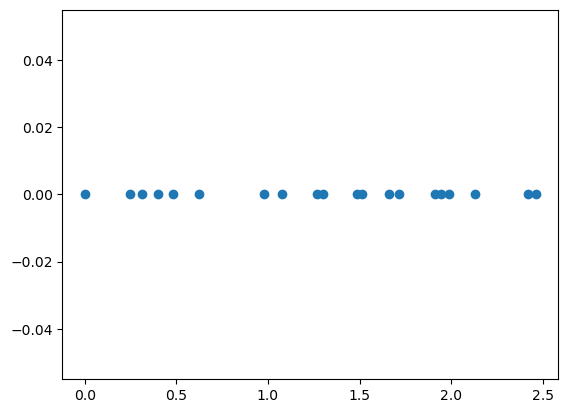

In [144]:
plt.plot(cum_dist,wlevel_t,'o');

In [145]:
Water_level_Ponton_Recalada = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//Punta Indio (Spar 236) 2015-2021.csv',delimiter=';',skiprows=2,encoding = 'unicode_escape',usecols=['Fecha Hora','Altura [m]'])
Water_level_Ponton_Recalada['Fecha Hora'] = [datetime.datetime.strptime(date,'%d-%m-%Y %H:%M') for date in Water_level_Ponton_Recalada['Fecha Hora']]
Water_level_Brasileira = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//Brasileira 2015-2021.csv',delimiter=';',skiprows=2,encoding = 'unicode_escape',usecols=['Fecha','Altura'])
Water_level_Brasileira['Fecha'] = [datetime.datetime.strptime(date,'%d-%m-%Y %H:%M') for date in Water_level_Brasileira['Fecha']]
Water_level_Buenos_Aires = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//Buenos Aires 2015-2021.csv',delimiter=';',skiprows=2,encoding = 'unicode_escape',usecols=['Fecha','Alt [m]'])
Water_level_Buenos_Aires['Fecha'] = [datetime.datetime.strptime(date,'%d-%m-%Y %H:%M') for date in Water_level_Buenos_Aires['Fecha']]
Water_level_La_Plata = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//La Plata 2015-2021.csv',delimiter=';',skiprows=2,encoding = 'unicode_escape',usecols=['Fecha','Alt'])
Water_level_La_Plata['Fecha'] = [datetime.datetime.strptime(date,'%d-%m-%Y %H:%M') for date in Water_level_La_Plata['Fecha']]
Water_level_Oyarvide = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//Oyarvide 2015-2020.csv',delimiter=';',skiprows=2,encoding = 'unicode_escape',usecols=['Fecha','Alt'])
Water_level_Oyarvide['Fecha'] = [datetime.datetime.strptime(date,'%d-%m-%Y %H:%M') for date in Water_level_Oyarvide['Fecha']]

In [146]:
Coords_Ponton_Recalada = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//Punta Indio (Spar 236) 2015-2021.csv',delimiter=';',encoding = 'unicode_escape',header=None,index_col=0)[0:2]
Name_Ponton_Recalada = Coords_Ponton_Recalada.loc['Name'].loc[1]
Coords_Ponton_Recalada = Coords_Ponton_Recalada.loc['Coordinates'].loc[1].replace(' ','').split(',')
Coords_Brasileira = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//Brasileira 2015-2021.csv',delimiter=';',encoding = 'unicode_escape',header=None,index_col=0)[0:2]
Name_Brasileira = Coords_Brasileira.loc['Name'].loc[1]
Coords_Brasileira = Coords_Brasileira.loc['Coords'].loc[1].replace(' ','').split(',')
Coords_Buenos_Aires = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//Buenos Aires 2015-2021.csv',delimiter=';',encoding = 'unicode_escape',header=None,index_col=0)[0:2]
Name_Buenos_Aires = Coords_Buenos_Aires.loc['Name'].loc[1]
Coords_Buenos_Aires = Coords_Buenos_Aires.loc['Coords'].loc[1].replace(' ','').split(',')
Coords_La_Plata = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//La Plata 2015-2021.csv',delimiter=';',encoding = 'unicode_escape',header=None,index_col=0)[0:2]
Name_La_Plata = Coords_La_Plata.loc['Name'].loc[1]
Coords_La_Plata = Coords_La_Plata.loc['Coords'].loc[1].replace(' ','').split(',')
Coords_Oyarvide = pd.read_csv(r'C://Users//floorbakker//Documents//Rio de la Plata//Data//Hydro//Oyarvide 2015-2020.csv',delimiter=';',encoding = 'unicode_escape',header=None,index_col=0)[0:2]
Name_Oyarvide = Coords_Oyarvide.loc['Name'].loc[1]
Coords_Oyarvide = Coords_Oyarvide.loc['Coords'].loc[1].replace(' ','').split(',')

In [147]:
Water_level_Ponton_Recalada = Water_level_Ponton_Recalada.rename({'Fecha Hora':'Date','Altura [m]':'Water level'},axis=1)
Water_level_Brasileira = Water_level_Brasileira.rename({'Fecha':'Date','Altura':'Water level'},axis=1)
Water_level_Buenos_Aires = Water_level_Buenos_Aires.rename({'Fecha':'Date','Alt [m]':'Water level'},axis=1)
Water_level_La_Plata = Water_level_La_Plata.rename({'Fecha':'Date','Alt':'Water level'},axis=1)
Water_level_Oyarvide = Water_level_Oyarvide.rename({'Fecha':'Date','Alt':'Water level'},axis=1)

In [148]:
def select_filtered_water_level_data(df,datetimes,start_date,end_date):
    mask = [True if d-3600>=start_date and d-3600<=end_date else False for d in [date.timestamp() for date in df['Date']]]
    selected_dates = list([day.to_pydatetime() for day in df['Date'][mask]])
    missing_dates = [ele for ele in datetimes if ele not in selected_dates]   
    missing_indexes = []
    for missing_date in missing_dates:
        for index,selected_date in enumerate(selected_dates):
            if missing_date < selected_date:
                missing_indexes.append(index-1)
                break
    
    selected_water_levels = list(df['Water level'][mask])
    for missing_index in reversed(missing_indexes):
        selected_water_levels.insert(missing_index,np.nan)

    for index,w_lev in enumerate(selected_water_levels):
        if math.isnan(w_lev):
            selected_water_levels[index] = last_wlev
        else:
            last_wlev = w_lev

    return selected_water_levels

In [149]:
# start_date = datetime.datetime(2019,1,1,0,0,0)
# end_date = datetime.datetime(2019,12,31,23,50,0)
# timestamps = pd.date_range(start_date,end_date, freq="20min").tolist()
# datetimes = [timestamp.to_pydatetime() for timestamp in timestamps]
# start_date = start_date.timestamp()
# end_date = end_date.timestamp()

In [150]:
# df = Water_level_Oyarvide
# seen = set()
# dupes = [x for x in selected_dates if x in seen or seen.add(x)]  
# remove_indexes = [df[mask].loc[[dat == dupe for dat in selected_dates]].index[1] for dupe in dupes]
# Water_level_Oyarvide = Water_level_Oyarvide[~Water_level_Oyarvide.index.isin(remove_indexes)]
# Water_level_Oyarvide = Water_level_Oyarvide[~Water_level_Oyarvide.index.isin([116652])]

In [151]:
# wlev_PR = select_filtered_water_level_data(Water_level_Ponton_Recalada,datetimes,start_date,end_date)
# wlev_B = select_filtered_water_level_data(Water_level_Brasileira,datetimes,start_date,end_date)
# wlev_BA = select_filtered_water_level_data(Water_level_Buenos_Aires,datetimes,start_date,end_date)
# wlev_LP = select_filtered_water_level_data(Water_level_La_Plata,datetimes,start_date,end_date)
# wlev_O = select_filtered_water_level_data(Water_level_Oyarvide,datetimes,start_date,end_date)

In [152]:
# df = pd.DataFrame()
# df['Ponton Recalada'] = wlev_PR
# df['Brasileira'] = wlev_B
# df['Oyarvide'] = wlev_BA
# df['La Plata'] = wlev_LP
# df['Buenos Aires'] = wlev_O
# df['Time'] = datetimes
# df.set_index('Time')

In [153]:
# water_level_data = xr.DataArray(df[df.columns[:-1]],dims={'TIME','STATION'},coords={'TIME':datetimes,'STATION':df.columns[:-1]})
# water_level_data = xr.Dataset(data_vars= {'Water level':water_level_data})

In [154]:
import re
def degrees_to_decimals(coord):
    deg, minutes, direction =  re.split('[°\'"]', coord)
    return (float(deg) + float(minutes)/60) * (-1 if direction in ['W', 'S'] else 1)

In [155]:
point_Ponton_Recalada = Point(degrees_to_decimals(Coords_Ponton_Recalada[1]),degrees_to_decimals(Coords_Ponton_Recalada[0]))
point_Brasileira = Point(degrees_to_decimals(Coords_Brasileira[1]),degrees_to_decimals(Coords_Brasileira[0]))
point_Buenos_Aires = Point(degrees_to_decimals(Coords_Buenos_Aires[1]),degrees_to_decimals(Coords_Buenos_Aires[0]))
point_La_Plata = Point(degrees_to_decimals(Coords_La_Plata[1]),degrees_to_decimals(Coords_La_Plata[0]))
point_Oyarvide = Point(degrees_to_decimals(Coords_Oyarvide[1]),degrees_to_decimals(Coords_Oyarvide[0]))

In [156]:
# water_level_data.attrs['Location Ponton Recalada'] = (point_Ponton_Recalada.x,point_Ponton_Recalada.y)
# water_level_data.attrs['Location Brasileira'] = (point_Brasileira.x,point_Brasileira.y)
# water_level_data.attrs['Location Oyarvide'] = (point_Oyarvide.x,point_Oyarvide.y)
# water_level_data.attrs['Location La Plata'] = (point_La_Plata.x,point_La_Plata.y)
# water_level_data.attrs['Location Buenos Aires'] = (point_Buenos_Aires.x,point_Buenos_Aires.y)

In [157]:
# water_level_data.to_netcdf('Water_level_measurement_data_Rio_de_la_Plata.nc')

In [158]:
m = folium.Map(location=[-34.5,-58], zoom_start = 8,tiles="cartodbpositron")

folium.Circle((point_Ponton_Recalada.y,point_Ponton_Recalada.x), radius=1, color='blue',fill=True,fill_opacity=1, popup = Name_Ponton_Recalada,tooltip = Name_Ponton_Recalada).add_to(m)  
folium.Circle((point_Brasileira.y,point_Brasileira.x), radius=1, color='blue',fill=True,fill_opacity=1, popup = Name_Brasileira,tooltip = Name_Brasileira).add_to(m)  
folium.Circle((point_Buenos_Aires.y,point_Buenos_Aires.x), radius=1, color='blue',fill=True,fill_opacity=1, popup = Name_Buenos_Aires,tooltip = Name_Buenos_Aires).add_to(m)  
folium.Circle((point_La_Plata.y,point_La_Plata.x), radius=1, color='blue',fill=True,fill_opacity=1, popup = Name_La_Plata,tooltip = Name_La_Plata).add_to(m)  
folium.Circle((point_Oyarvide.y,point_Oyarvide.x), radius=1, color='blue',fill=True,fill_opacity=1, popup = Name_Oyarvide,tooltip = Name_Oyarvide).add_to(m)  

for edge in FG_Rio_de_la_Plata.edges(data = True):
    points_x = list(edge[2]["geometry"].coords.xy[0])
    points_y = list(edge[2]["geometry"].coords.xy[1])
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))

    else:
        popup = folium.Popup(width=500, height=300)
        folium.PolyLine(line, weight = 3,color='violet',tooltip = [edge[0],edge[1]], popup = [edge[0],edge[1]]).add_to(m)

for node in FG_Rio_de_la_Plata.nodes(data = True):
    points_x = list(node[1]["geometry"].coords.xy[0])
    points_y = list(node[1]["geometry"].coords.xy[1])
    
    point = []
    for i, _ in enumerate(points_x):
        point.append((points_y[i], points_x[i]))
        
    folium.Circle(point[0], radius=5,color='black',fill=False,fill_opacity=1,tooltip = node[0],popup =node[0]).add_to(m)

m

In [159]:
FG.remove_node('Shell Dock Sud Puerto Buenos Aires')

In [160]:
rename_nodes_4 = {'Canal de Acceso Puerto Buenos Aires E1': 'Canal Sur KM_0',
                  'Canal de Acceso Puerto Buenos Aires E2': 'Canal Sur KM_0.5',
                  'Recalada Puerto Buenos Aires Sur': 'Canal Sur KM_1.3 - Recalada Puerto Sur de Buenos Aires',
                  'Terminal Petrolera Puerto Buenos Aires': 'Terminal Petrolera Puerto Sur de Buenos Aires',
                  'Darsena de Inflamables Dock Sud Puerto Buenos Aires': 'Darsena de Inflamables Puerto Sur de Buenos Aires',
                  'Darsena Sur Dock Sud Puerto Buenos Aires': 'Darsena Sur Puerto Sur de Buenos Aires',
                  'Puerto Dock Sud Puerto Buenos Aires': 'Dock Sud Puerto Sur de Buenos Aires',
                  'Canal de Acceso Puerto Buenos Aires Sur': 'Antepuerto Puerto Sur de Buenos Aires',
                  'Recalada Nuevo Puerto Buenos Aires': 'Antepuerto Puerto Nuevo de Buenos Aires - Huergo KM_0.8',
                  'Canal de Pasaje Nuevo Puerto Buenos Aires A': 'Canal de Pasaje Puerto Nuevo de Buenos Aires A',
                  'Canal de Pasaje Nuevo Puerto Buenos Aires B': 'Canal de Pasaje Puerto Nuevo de Buenos Aires B',
                  'Canal de Pasaje Nuevo Puerto Buenos Aires C': 'Canal de Pasaje Puerto Nuevo de Buenos Aires C',
                  'Canal de Pasaje Nuevo Puerto Buenos Aires D': 'Canal de Pasaje Puerto Nuevo de Buenos Aires D',
                  'Canal de Pasaje Nuevo Puerto Buenos Aires E': 'Canal de Pasaje Puerto Nuevo de Buenos Aires E',}

In [161]:
FG_Rio_de_la_Plata = nx.relabel_nodes(FG_Rio_de_la_Plata,rename_nodes_4)

In [162]:
rename_nodes_5 = {'Darsena A Nuevo Puerto Buenos Aires': 'Darsena A Puerto Nuevo de Buenos Aires',
                  'Darsena B Nuevo Puerto Buenos Aires': 'Darsena B Puerto Nuevo de Buenos Aires',
                  'Darsena C Nuevo Puerto Buenos Aires': 'Darsena C Puerto Nuevo de Buenos Aires',
                  'Darsena D Nuevo Puerto Buenos Aires': 'Darsena D Puerto Nuevo de Buenos Aires',
                  'Darsena E Nuevo Puerto Buenos Aires': 'Darsena E Puerto Nuevo de Buenos Aires',
                  'Darsena Norte Nuevo Puerto Buenos Aires': 'Darsena Norte Puerto Nuevo de Buenos Aires'}

In [163]:
FG_Rio_de_la_Plata = nx.relabel_nodes(FG_Rio_de_la_Plata,rename_nodes_5)

In [164]:
rename_nodes_6 = {'Darsena al Este 1 Dock Sud Puerto Buenos Aires': 'Darsena al Este 1 Puerto Sur de Buenos Aires',
                  'Darsena al Este 2 Dock Sud Puerto Buenos Aires': 'Darsena al Este 2 Puerto Sur de Buenos Aires',
                  'APM Darsena D Nuevo Puerto Buenos Aires': 'Darsena D Puerto Nuevo de Buenos Aires',
                  'Darsena de Propaneros Dock Sud Puerto Buenos Aires': 'Darsena de Propaneros Puerto Sur de Buenos Aires',
                  'Depemas 51 Nuevo Puerto Buenos Aires': 'Depemas 51 Puerto Nuevo de Buenos Aires',
                  'BACTSSA Darsena E Nuevo Puerto Buenos Aires':'Darsena E Puerto Nuevo de Buenos Aires'}

In [165]:
FG_Rio_de_la_Plata = nx.relabel_nodes(FG_Rio_de_la_Plata,rename_nodes_6)

In [166]:
pickle.dump(FG_Rio_de_la_Plata, open('Rio_de_la_Plata.pickle', 'wb'))

In [167]:
km99 = gpd.read_file(path+'KM99.geojson')
emiliomitre = gpd.read_file(path+'emiliomitre.geojson') 
martingarcia = gpd.read_file(path+'martingarcia.geojson') 
puerto_la_plata = gpd.read_file(path+'portLP.geojson') 
puerto_BAires = gpd.read_file(path+'portsBA.geojson') 

## Plot network

<AxesSubplot:>

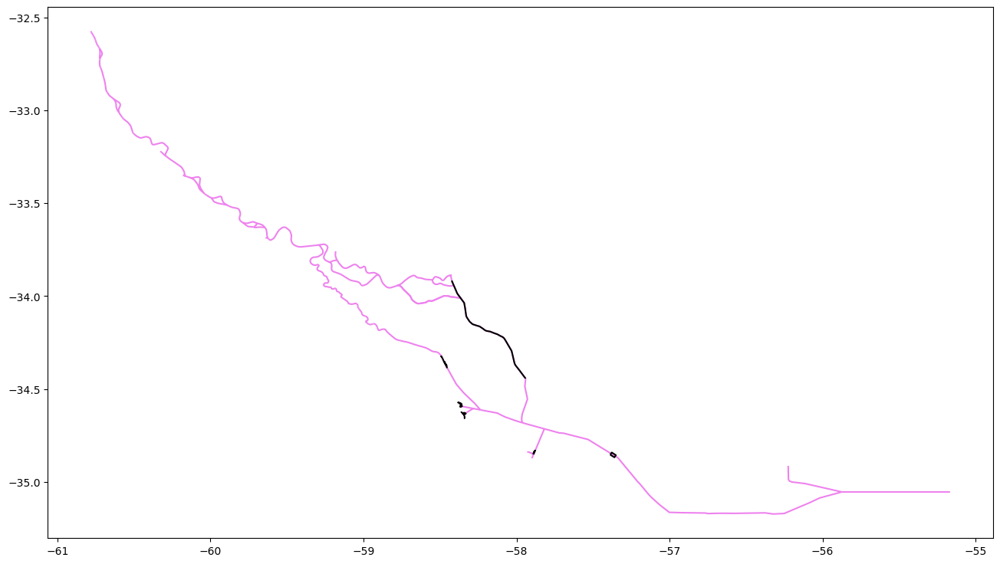

In [168]:
fig,ax = plt.subplots(figsize=[16,9])
fairways.plot(ax=ax,edgecolor='violet',zorder=0)
km99.plot(ax=ax,facecolor='none',edgecolor='k')
emiliomitre.plot(ax=ax,facecolor='none',edgecolor='k')
martingarcia.plot(ax=ax,facecolor='none',edgecolor='k')
puerto_la_plata.plot(ax=ax,facecolor='none',edgecolor='k')
puerto_BAires.plot(ax=ax,facecolor='none',edgecolor='k')

<AxesSubplot:>

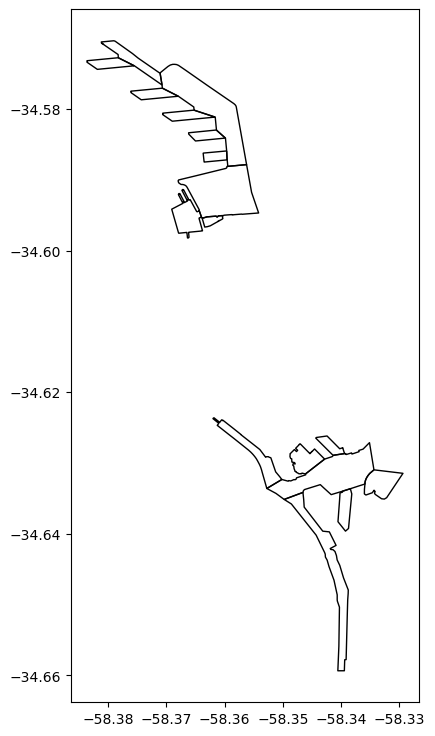

In [169]:
fig,ax = plt.subplots(figsize=[16,9])
puerto_BAires.plot(ax=ax,facecolor='none',edgecolor='k')

In [170]:
import fiona

fiona.supported_drivers['KML'] = 'rw'
fiona.supported_drivers['LIBKML'] = 'rw'
gpd.GeoDataFrame(terminal_locations,geometry=gpd.points_from_xy(terminal_locations.Long, terminal_locations.Lat)).drop('geom',axis=1).to_file('test.kml', driver='KML')

In [171]:
berths_Parana_names = [['Termoelectrica Jose de San Martin S.A.','Timbues','Central','Jetty','Liquid bulk',226,226,12,10.01,],
                       ['Renova S.A.','Timbues','Norte','Jetty','Dry and liquid bulk',275,275,13,10.01,],
                       ['Renova S.A.','Timbues','Sur','Jetty','Dry and liquid bulk',275,275,13,10.01,],
                       ['Louis Dreyfus Co. Argentina S.A.','Timbues','Cereales','Jetty','Dry bulk',270,270,10,10.01,],
                       ['Cofco Argentina S.A.','Timbues','Norte','Jetty','Liquid bulk',204,204,11,10.01,],
                       ['Cofco Argentina S.A.','Timbues','Sur','Jetty','Dry and liquid bulk',275,275,14,10.01,],
                       ['A.C.A','Timbues','','Jetty','Dry bulk',260,260,14,10.01,],
                       ['A.G.D','Timbues','','Jetty','Dry bulk',275,275,14,10.01,],
                       ['Profertil S.A.','General San Martin','Planta','Jetty','Dry bulk',220,220,15,10.01,],
                       ['Minera Alumbrera Limited','General San Martin','','Jetty','Dry and liquid bulk',240,240,13,10.01,],
                       ['Terminal 6 S.A.','General San Martin','Norte','Jetty','Dry bulk',240,240,19,10.01,],
                       ['Terminal 6 S.A.','General San Martin','Sur','Jetty','Dry bulk',240,240,13,10.01,],
                       ['Arauco Argentina S.A.','General San Martin','ARAUCO','Jetty','Liquid bulk',230,230,11,10.01,],
                       ['Cargill S.A.','General San Martin','Quebracho','Jetty','Dry bulk',297,297,14,10.01,],
                       ['Fertilizantes Argentinos S.A.','General San Martin','Terminal','Jetty','Liquid bulk',210,210,9.75,9.6,],
                       ['Pampa Energia S.A.','General San Martin','','Jetty','Liquid bulk',180,180,6.1,10.14,],
                       ['Nidera S.A.','General San Martin','Norte','Jetty','Liquid bulk',255,255,13.2,10.14,],
                       ['Nidera S.A.','General San Martin','Sur','Jetty','Dry and liquid bulk',225,225,13.2,10.14,],
                       ['A.D.M. Agro S.R.L.','General San Martin','El Transito','Jetty','Dry and liquid bulk',230,230,7,10.14,],
                       ['Bunge Argentina S.A.','General San Martin','Pampa','Jetty','Dry bulk',270,270,15,10.14,],
                       ['Bunge Argentina S.A.','General San Martin','Dempa','Jetty','Dry and liquid bulk',230,230,14,10.14,],
                       ['YPF S.A.','San Lorenzo','','Jetty','Liquid bulk',190,190,9.6,8.8,],
                       ['Pan American Energy','San Lorenzo','Axion','Jetty','Liquid bulk',160,160,7,8.8,],
                       ['Oil Combustibles S.A.','San Lorenzo','1','Jetty','Liquid bulk',230,230,15.2,10.14,],
                       ['Oil Combustibles S.A.','San Lorenzo','3','Jetty','Liquid bulk',230,230,13.1,10.14,],
                       ['Asociacion de Cooperativeas Argentinas Coop. Ltda.','San Lorenzo','ACA','Jetty','Dry bulk',275,275,12,10.01],
                       ['Nouryon','San Lorenzo','AKZO NOBEL CHEMICAL ARGENTINA SAU','Jetty','Liquid bulk',200,200,21,10.14,],
                       ['Vicentin S.A.I.C.','San Lorenzo','','Jetty','Dry and liquid bulk',280,280,15,10.14,],
                       ['Molinos Agro S.A.','San Lorenzo','SAN BENITO','Jetty','Dry bulk',275,275,11,10.14,],
                       ['Generacion Rosario S.A.','Rosario','Sorrento','Jetty','Liquid bulk',187,187,11,10.14,],
                       ['Puerto Rosario','Rosario','Norte','Quay','General cargo',230,385,8,10.14,],
                       ['Puerto Rosario','Rosario','Centro','Quay','General cargo',230,665,8,10.14,],
                       ['Puerto Rosario','Rosario','Sur','Quay','General cargo',230,570,10,10.14,],
                       ['Puerto Rosario','Rosario','Unidad VI','Jetty','Dry bulk',230,255,10,10.14,],
                       ['Puerto Rosario','Rosario','Unidad VII','Jetty','Dry bulk',230,230,10,10.14,],
                       ['Cargill S.A.','Villa Gobernador Galvez','VGG','Jetty','Dry and liquid bulk',300,300,13,10.14,],
                       ['Cargill S.A.','Punta Alvear','Punta Alvear','Jetty','Dry bulk',280,280,13,10.14,],
                       ['Louis Dreyfus Co. Argentina S.A.','General Lagos','Cerealero I','Jetty','Dry bulk',275,315,10.36,10.14,],
                       ['Louis Dreyfus Co. Argentina S.A.','General Lagos','Cerealero II','Jetty','Dry bulk',230,252,10.36,10.14,],
                       ['A.D.M. Agro S.R.L.','Arroyo Seco','Arroyo Seco','Jetty','Dry bulk',230,230,6,10.14,],
                       ['Shell Cia. Argentina de Petroleo S.A.','Arroyo Seco','Deposito Arroyo seco - Shell CAPSA','Jetty','Liquid bulk',180,55,15,10.14,],
                       ['Acindar S.A.','Villa Constitucion','Cargas Generales Ing. Acevedo','Quay','General cargo',180,110,24,9.2,],
                       ['Acindar S.A.','Villa Constitucion','Mineral de Hierro','Jetty','Dry bulk',225,160,10.36,10.14,],
                       ['Puerto Villa Constitucion','Villa Constitucion','UNIDAD II','Jetty','Dry bulk',225,165,6.7,9.5,],
                       ['Puerto Villa Constitucion','Villa Constitucion','UNIDAD I','Quay','General Cargo',185,185,6.7,9.2,],
                       ['Puerto San Nicolas de Los Arroyos','San Nicolas de Los Arroyos','FISCAL','Quay','General Cargo',230,537,8.7,10.14,],
                       ['Puerto San Nicolas de Los Arroyos','San Nicolas de Los Arroyos','ELEVADOR','Jetty','General Cargo',270,143,8,10.14,],
                       ['Central Termica San Nicolas','San Nicolas de Los Arroyos','1','Quay','Dry bulk',226,333,10,10.14,],
                       ['Siderar S.A.I.C.','San Nicolas de Los Arroyos','Buitrago Norte','Quay','Dry bulk',230,680,6.8,10.14,],
                       ['Siderar S.A.I.C.','San Nicolas de Los Arroyos','Buitrago Sur','Quay','Dry bulk',230,320,9,10.14,],
                       ['Bunge Argentina S.A.','Ramallo','3 - Fertilizantes','Jetty','Dry bulk',223,250,15,10.41,],
                       ['Bunge Argentina S.A.','Ramallo','1 - Granos y Subproductos','Jetty','Dry bulk',270,300,20,11.48,],
                       ['Xstorage S.A.','Ramallo','Xstorage','Jetty','Dry bulk',240,185,16,12.48,],
                       ['Puerto San Pedro','San Pedro','Cabecera','Quay','General Cargo',170,75,8.54,10.04,],
                       ['Puerto San Pedro','San Pedro','Ultramar','Jetty','Dry bulk',220,220,9.15,10.04,],
                       ['Delta Dock S.A.','Lima','1','Quay','RoRo',230,300,12.5,11,],
                       ['Delta Dock S.A.','Lima','2','Jetty','Dry bulk',225,300,12.5,11,],
                       ['Molca S.A.','Las Palmas','Cerealero','Jetty','Dry Bulk',230,230,11,11,],
                       ['Vitco S.A.','Zarate','1','Jetty','Liquid bulk',230,365,10,11,],
                       ['Terminal Zarate S.A.','Zarate','General cargo','Quay','RoRo',245,480,11,11,],
                       ['Terminal Zarate S.A.','Zarate','Sur','Dolphin','RoRo',245,250,11,11,],
                       ['Terminal Zarate S.A.','Zarate','Norte','Dolphin','RoRo',245,250,11,11,],
                       ['Parque Industrial Aguas Profundas S.A.','Zarate','PIAPSA','Jetty','Liquid bulk',232,132,11,11,],
                       ['Siderca S.A.','Campana','MINERALES Y CARGA DE TUBOS','Quay','Dry bulk',230,185,8.8,10.06,],
                       ['Euroamerica S.A.','Campana','Euroamerica','Quay','General cargo',230,300,10,10.08,],
                       ['Pan American Energy','Campana','C','Jetty','Liquid bulk',230,129,9,10.36,],
                       ['Pan American Energy','Campana','H','Jetty','Liquid bulk',220,70,10.4,10.36,],
                       ['Pan American Energy','Campana','E','Jetty','Liquid bulk',150,50,8.25,10.36,],
                       ['Puerto Campana','Campana','Depsa','Quay','General cargo',170,116,10,8.7,],
                       ['Maderera Rio Parana S.A.','Campana','Maripasa','Quay','General cargo',230,225,10,10.08,],
                       ['Carboclor S.A.','Campana','CARBOCLOR SA','Jetty','Liquid bulk',220,266,9.1,9.76,],
                       ['Puerto Rutilex Hidrocarburos Argentinos S.A.','Campana','Pobater','Jetty','Liquid bulk',230,30,10,9.76,],
                       ['Odfjell Terminals Tagsa S.A.','Campana','Odfjell Terminals Tagsa S.A.','Jetty','Liquid bulk',220,300,11,9.76,],
                       ['Petromining S.A.','Campana','1','Jetty','Liquid bulk',230,345,10.4,9.76,],
                       ['Petromining S.A.','Campana','2','Jetty','Liquid bulk',230,345,10.4,9.76,],
                       ['GNL Escobar Ute Enarsa-YPF S.A.','Belen de Escobar','Terminal','Jetty','Liquid bulk',290,130,12.7,12.7,],
                       ['Del Guazu S.A.','Villa Paranacito','1','Quay','Dry bulk',260,335,12.5,10.5,],
                       ['Puerto Ibicuy','Ibicuy','Continental','Quay','General cargo',225,220,12,10.5]]

In [172]:
# srcDS = gdal.OpenEx(path+'Terminals_Parana.kml')
# ds = gdal.VectorTranslate(path + 'Berths_Parana.geojson', srcDS, format='GeoJSON')
berths = gpd.read_file(path+"Berths_Parana.geojson")
polygonized_berths = []
for berth in berths.geometry[0].geoms:
    polygonized_berths.append(shapely.ops.transform(lambda x, y, z=None: (x, y),Polygon(berth)))
berths_Parana = gpd.GeoDataFrame(berths_Parana_names,columns=['Company','Port','Berth','Berth_type','Cargo_type',
                                                              'Maximum_vessel_length','Berth_length','Berth_MBL',
                                                              'Maximum_vessel_draught'],geometry=polygonized_berths)

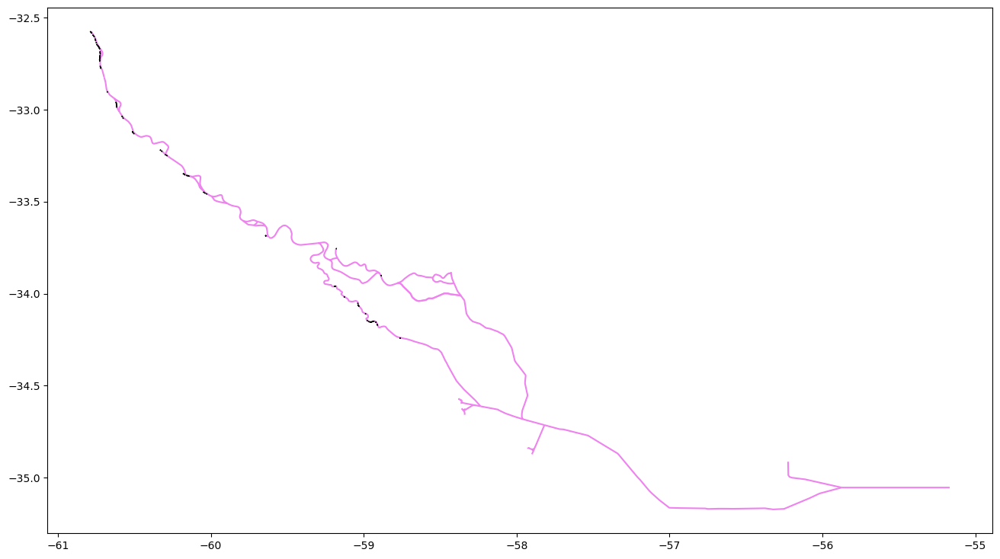

In [173]:
fig,ax = plt.subplots(figsize=[16,9])
fairways.plot(ax=ax,edgecolor='violet',zorder=0)
for geom in berths_Parana.geometry:
    ax.plot(*geom.exterior.coords.xy,color='k',linewidth=1)

In [174]:
berths_Parana

,Company,Port,Berth,Berth_type,Cargo_type,Maximum_vessel_length,Berth_length,Berth_MBL,Maximum_vessel_draught,geometry
0,Termoelectrica Jose de San Martin S.A.,Timbues,Central,Jetty,Liquid bulk,226,226,12.0,10.01,"POLYGON ((-60.78723 -32.57621, -60.78586 -32.5..."
1,Renova S.A.,Timbues,Norte,Jetty,Dry and liquid bulk,275,275,13.0,10.01,"POLYGON ((-60.78352 -32.58040, -60.78185 -32.5..."
2,Renova S.A.,Timbues,Sur,Jetty,Dry and liquid bulk,275,275,13.0,10.01,"POLYGON ((-60.78151 -32.58294, -60.77957 -32.5..."
3,Louis Dreyfus Co. Argentina S.A.,Timbues,Cereales,Jetty,Dry bulk,270,270,10.0,10.01,"POLYGON ((-60.77080 -32.59576, -60.76871 -32.5..."
4,Cofco Argentina S.A.,Timbues,Norte,Jetty,Liquid bulk,204,204,11.0,10.01,"POLYGON ((-60.76515 -32.60147, -60.76479 -32.6..."
...,...,...,...,...,...,...,...,...,...,...
73,Petromining S.A.,Campana,1,Jetty,Liquid bulk,230,345,10.4,9.76,"POLYGON ((-58.91218 -34.16854, -58.91132 -34.1..."
74,Petromining S.A.,Campana,2,Jetty,Liquid bulk,230,345,10.4,9.76,"POLYGON ((-58.91090 -34.17014, -58.91133 -34.1..."
75,GNL Escobar Ute Enarsa-YPF S.A.,Belen de Escobar,Terminal,Jetty,Liquid bulk,290,130,12.7,12.70,"POLYGON ((-58.76310 -34.24159, -58.75956 -34.2..."
76,Del Guazu S.A.,Villa Paranacito,1,Quay,Dry bulk,260,335,12.5,10.50,"POLYGON ((-58.88546 -33.90135, -58.88596 -33.9..."


In [175]:
berths_Plata_names = [['Puerto Nuevo','Buenos Aires','Darsena A Norte','Quay','Contenadores',294,365,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','Darsena A Sur','Quay','Contenadores',335,360,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','Darsena B Norte','Quay','Contenadores',294,410,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','2do Espigon','Quay','General Cargo',366,200,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','Darsena B Sur','Quay','Contenadores',294,450,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','Darsena C Norte','Quay','Contenadores',366,460,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','3er Espigon','Quay','General Cargo',366,190,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','Darsena C Sur','Quay','Contenadores',336,670,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','Darsena D Norte','Quay','Contenadores',366,460,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','4to Espigon','Quay','General Cargo',366,290,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','Darsena D Sur','Quay','General Cargo',177,580,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','Darsena E Norte','Quay','General Cargo',177,460,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','5to Espigon Norte','Quay','General Cargo',177,340,10.05,10.05,],
                      ['Puerto Nuevo','Buenos Aires','5to Espigon Sur','Quay','General Cargo',177,200,10.05,10.05,],
                      ['Dock Sud','Buenos Aires','7','Quay','Liquid Bulk',170,225,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','B17','Jetty','Liquid Bulk',210,210,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','C18','Jetty','Liquid Bulk',210,210,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','D19','Jetty','Liquid Bulk',210,210,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','E21','Jetty','Liquid Bulk',210,210,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','F22','Jetty','Liquid Bulk',210,210,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','1','Quay','Contenadores',334,510,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','2','Quay','Contenadores',334,340,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','3','Quay','Contenadores',334,360,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','9-13','Quay','General Cargo',840,840,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','A24','Jetty','Liquid Bulk',240,240,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','A25','Jetty','Liquid Bulk',240,240,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','B26','Jetty','Liquid Bulk',210,260,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','C27','Jetty','Liquid Bulk',210,260,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','E29','Jetty','Liquid Bulk',210,260,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','F30','Jetty','Liquid Bulk',210,260,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','A31','Jetty','Liquid Bulk',210,260,9.75,9.75,],
                      ['Dock Sud','Buenos Aires','B32','Jetty','Liquid Bulk',210,260,9.75,9.75,],
                      ['Puerto La Plata','La Plata','Cabecera Sitio 4','Quay','RoRo',200,200,10.35,10.35,],
                      ['Puerto La Plata','La Plata','Sitio 9','Quay','General Cargo',240,240,8.5,8.5,],
                      ['Puerto La Plata','La Platas','Sitio 18 y 19','General Cargo',400,400,7.0,7.0,],
                      ['Puerto La Plata','La Plata','TecPlata','Quay','Contenadores',600,600,10.35,10.35,],
                      ['Puerto La Plata','La Plata','Copetro SC','Quay','Dry Bulk',215,400,8.5,8.5,],
                      ['Puerto La Plata','La Plata','YPF SA Sitio 10','Quay','Dry Bulk',210,210,8.5,8.5,],
                      ['Puerto La Plata','La Plata','YPF SA Sitio 12','Quay','Dry Bulk',210,210,8.5,8.5,],
                      ['Puerto La Plata','La Plata','YPF SA Sitio 14','Quay','Dry Bulk',210,210,8.5,8.5,],
                      ['Puerto La Plata','La Plata','YPF SA Sitio 15','Quay','Dry Bulk',210,210,8.5,8.5,],
                      ['Puerto La Plata','La Plata','YPF SA Sitio 17','Quay','Dry Bulk',210,210,8.5,8.5,]]

In [176]:
# srcDS = gdal.OpenEx(path+'Berths Rio de la Plata.kml')
# ds = gdal.VectorTranslate(path + 'berths_rio_de_la_plata.json', srcDS, format='GeoJSON')

In [177]:
berths = gpd.read_file(path+"berths_rio_de_la_plata.json")
polygonized_berths = []
for berth in berths.geometry:
    polygonized_berths.append(shapely.ops.transform(lambda x, y, z=None: (x, y),Polygon(berth)))
berths_Plata = gpd.GeoDataFrame(berths_Plata_names,columns=['Company','Port','Berth','Berth_type','Cargo_type',
                                                              'Maximum_vessel_length','Berth_length','Berth_MBL',
                                                              'Maximum_vessel_draught'],geometry=polygonized_berths)

In [178]:
berths = pd.concat([berths_Plata,berths_Parana])

In [179]:
berths = berths.reset_index(drop=True)

In [180]:
berths.to_file('Berths_Rio_de_la_Plata_final.geojson', driver='GeoJSON')  

In [181]:
anchorage_areas = anchorage_areas[['seamark:name','geometry']]
anchorage_areas = anchorage_areas.rename({'seamark:name':'Name'},axis=1)

In [182]:
anchorage_areas.loc[1,'Name'] = 'Zona de Alijo - KM 452'
anchorage_areas.loc[1,'Port'] = 'San Martin'

anchorage_areas.loc[5,'Name'] = 'Zona de Fondeo y Espera Banco Chico - KM 93 a KM 99'
anchorage_areas.loc[5,'Port'] = 'Rio de la Plata Interior'

anchorage_areas.loc[6,'Name'] = 'Zona de Fondeos y Servicios - Zona Recalada'
anchorage_areas.loc[6,'Port'] = 'Rio de la Plata Exterior'

anchorage_areas.loc[9,'Name'] = 'Zona de Fondeo y Espera Este - Parana Guazu'
anchorage_areas.loc[9,'Port'] = 'Terminal de Guazu'
anchorage_areas.loc[10,'Name'] = 'Zona de Alijo - Parana Guazu'
anchorage_areas.loc[10,'Port'] = 'Terminal de Guazu'

anchorage_areas.loc[11,'Name'] = 'Zona de Fondeo y Espera Oeste - Parana Guazu'
anchorage_areas.loc[11,'Port'] = 'Terminal de Guazu'

anchorage_areas.loc[12,'Name'] = 'Zona de Reserva Operativa - Parana Guazu'
anchorage_areas.loc[12,'Port'] = 'Terminal de Guazu'

In [183]:
anchorage_areas = anchorage_areas.drop(pd.Index([0, 2, 3, 4]))
anchorage_areas = anchorage_areas.reset_index(drop=True)

In [184]:
anchorage_areas.loc[3,'Port'] = 'Rio de la Plata Exterior'
anchorage_areas.loc[4,'Port'] = 'Rio de la Plata Exterior'
anchorage_areas.loc[9,'Port'] = 'Rio de la Plata Exterior'
anchorage_areas.loc[10,'Port'] = 'Rio de la Plata Exterior'
anchorage_areas.loc[11,'Port'] = 'Rio de la Plata Exterior'

In [185]:
anchorage_areas

,Name,geometry,Port
0,Zona de Alijo - KM 452,"POLYGON ((-60.70240 -32.68839, -60.70748 -32.6...",San Martin
1,Zona de Fondeo y Espera Banco Chico - KM 93 a ...,"POLYGON ((-57.38743 -34.85411, -57.37763 -34.8...",Rio de la Plata Interior
2,Zona de Fondeos y Servicios - Zona Recalada,"POLYGON ((-56.06994 -35.02554, -55.99045 -35.0...",Rio de la Plata Exterior
3,"Zona de Alijo ""Delta""","POLYGON ((-55.26751 -35.06718, -55.18383 -35.0...",Rio de la Plata Exterior
4,"Zona de Alijo ""Alfa""","POLYGON ((-55.75107 -35.10815, -55.61723 -35.1...",Rio de la Plata Exterior
5,Zona de Fondeo y Espera Este - Parana Guazu,"POLYGON ((-58.77286 -33.94039, -58.80666 -33.9...",Terminal de Guazu
6,Zona de Alijo - Parana Guazu,"POLYGON ((-58.82413 -33.95084, -58.82378 -33.9...",Terminal de Guazu
7,Zona de Fondeo y Espera Oeste - Parana Guazu,"POLYGON ((-58.86035 -33.93633, -58.85035 -33.9...",Terminal de Guazu
8,Zona de Reserva Operativa - Parana Guazu,"POLYGON ((-58.86035 -33.93633, -58.86329 -33.9...",Terminal de Guazu
9,Zona de Fondeo y Espera Este,"POLYGON ((-55.16819 -35.11822, -55.28526 -35.2...",Rio de la Plata Exterior


In [186]:
Zona_C = Polygon([Point(-56.633091,-36.083669),
                  Point(-56.499666,-36.083669),
                  Point(-56.499666,-35.983754),
                  Point(-56.633091,-35.983754)])

In [187]:
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Alijo "Charlie"','geometry':Zona_C,'Port':'Rio de la Plata Exterior'}

In [188]:
ZO1 = Polygon([Point(-57.794722,-34.730076),
               Point(-57.818238,-34.724876),
               Point(-57.825525,-34.754443),
               Point(-57.827813,-34.759284),
               Point(-57.759372,-34.759286),
               Point(-57.766427,-34.750602)])

ZO2 = Polygon([Point(-57.827813,-34.759284),
               Point(-57.834613,-34.773429),
               Point(-57.748008,-34.773351),
               Point(-57.759372,-34.759286)])

ZW1 = Polygon([Point(-57.883580,-34.710609),
               Point(-57.909686,-34.750637),
               Point(-57.847334,-34.750717),
               Point(-57.832311,-34.721744)])

ZW2 = Polygon([Point(-57.886596,-34.773329),
               Point(-57.909606,-34.750637),
               Point(-57.847334,-34.750717),
               Point(-57.858592,-34.773349)])

Pilot = Polygon([Point(-57.778802,-34.731356),
                 Point(-57.773776,-34.733407),
                 Point(-57.751975,-34.735916),
                 Point(-57.747095,-34.735235)])

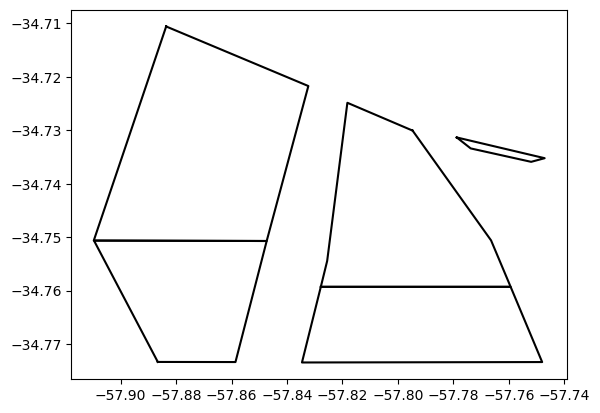

In [189]:
fig,ax = plt.subplots()
ax.plot(*ZW1.exterior.coords.xy,color='k')
ax.plot(*ZW2.exterior.coords.xy,color='k')
ax.plot(*ZO1.exterior.coords.xy,color='k')
ax.plot(*ZO2.exterior.coords.xy,color='k')
ax.plot(*Pilot.exterior.coords.xy,color='k')

In [190]:
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo y Espera de Practicaje Oeste 1',
                                             'geometry':ZW1,
                                             'Port':'Zona Comun - Rada La Plata'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo y Espera de Practicaje Oeste 2',
                                             'geometry':ZW2,
                                             'Port':'Zona Comun - Rada La Plata'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo y Espera de Practicaje Este 1',
                                             'geometry':ZO1,
                                             'Port':'Rio de la Plata Exterior'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo y Espera de Practicaje Este 2',
                                             'geometry':ZO2,
                                             'Port':'Zona Comun - Rada La Plata'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Embarque de Practicos',
                                             'geometry':Pilot,
                                             'Port':'Zona Comun - Rada La Plata'}

In [191]:
KM_45_5_al_KM_57_6_E = Polygon([Point(-58.487074,-34.327788),
                                Point(-58.485258,-34.326942),
                                Point(-58.492177,-34.312371),
                                Point(-58.514266,-34.295939),
                                Point(-58.584456,-34.277945),
                                Point(-58.585396,-34.279918),
                                Point(-58.578642,-34.282563),
                                Point(-58.557867,-34.292416),
                                Point(-58.552678,-34.294681),
                                Point(-58.549152,-34.295782),
                                Point(-58.546449,-34.296674),
                                Point(-58.541391,-34.297651),
                                Point(-58.521493,-34.300194),
                                Point(-58.514199,-34.302270),
                                Point(-58.512491,-34.303108),
                                Point(-58.507499,-34.306020),
                                Point(-58.505271,-34.307919),
                                Point(-58.501313,-34.310751),
                                Point(-58.498929,-34.312759),
                                Point(-58.493658,-34.317374),
                                Point(-58.491817,-34.319482)])

KM_45_5_al_KM_57_6_W = Polygon([Point(-58.489176,-34.328765),
                                Point(-58.493006,-34.321809),
                                Point(-58.494012,-34.320341),
                                Point(-58.497297,-34.316945),
                                Point(-58.503928,-34.311419),
                                Point(-58.508200,-34.308443),
                                Point(-58.511933,-34.306187),
                                Point(-58.515558,-34.304334),
                                Point(-58.522378,-34.302477),
                                Point(-58.543167,-34.299804),
                                Point(-58.547376,-34.298919),
                                Point(-58.555618,-34.296224),
                                Point(-58.572139,-34.288094),
                                Point(-58.586247,-34.281888),
                                Point(-58.587407,-34.284380),
                                Point(-58.541475,-34.306170),
                                Point(-58.539042,-34.305928),
                                Point(-58.489841,-34.329060)])

KM_58_0_al_KM_60_7_E = Polygon([Point(-58.588750,-34.278821),
                                Point(-58.587650,-34.276502),
                                Point(-58.588360,-34.276438),
                                Point(-58.614809,-34.268930),
                                Point(-58.615610,-34.271481),
                                Point(-58.604195,-34.274062)])

KM_58_0_al_KM_60_7_W = Polygon([Point(-58.589649,-34.280883),
                                Point(-58.604988,-34.276012),
                                Point(-58.608490,-34.275253),
                                Point(-58.616273,-34.273640),
                                Point(-58.616714,-34.274961),
                                Point(-58.590642,-34.283101)])

KM_60_7_al_KM_63_0_E = Polygon([Point(-58.615610,-34.271481),
                                Point(-58.614809,-34.268930),
                                Point(-58.640170,-34.264685),
                                Point(-58.640591,-34.265931),
                                Point(-58.633743,-34.267601)])

KM_60_7_al_KM_63_0_W = Polygon([Point(-58.642170,-34.270348),
                                Point(-58.641332,-34.268025),
                                Point(-58.631861,-34.270275),
                                Point(-58.616273,-34.273640),
                                Point(-58.616714,-34.274961)])

KM_63_0_al_KM_68_7_E = Polygon([Point(-58.700154,-34.250018),
                                Point(-58.640606,-34.265915),
                                Point(-58.640158,-34.264644),
                                Point(-58.673715,-34.255662),
                                Point(-58.699390,-34.249063),
                                Point(-58.699940,-34.249381)])

KM_63_0_al_KM_68_7_W = Polygon([Point(-58.641332,-34.268025),
                                Point(-58.642170,-34.270348),
                                Point(-58.651134,-34.268128),
                                Point(-58.690009,-34.256858),
                                Point(-58.701130,-34.252984),
                                Point(-58.701040,-34.252108)])

In [192]:
from shapely.ops import cascaded_union
water_area = gpd.GeoDataFrame(gpd.GeoSeries(cascaded_union(gdf.geometry.to_numpy())),columns=['geometry'])

C:\Users\floorbakker\AppData\Local\Temp\ipykernel_5276\1224533127.py:2: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  water_area = gpd.GeoDataFrame(gpd.GeoSeries(cascaded_union(gdf.geometry.to_numpy())),columns=['geometry'])


In [193]:
KM_46_5_al_KM_68_7 = []
for poly in [KM_45_5_al_KM_57_6_E,KM_58_0_al_KM_60_7_E,KM_60_7_al_KM_63_0_E,KM_63_0_al_KM_68_7_E,KM_45_5_al_KM_57_6_W,KM_58_0_al_KM_60_7_W,KM_60_7_al_KM_63_0_W,KM_63_0_al_KM_68_7_W]:
    KM_46_5_al_KM_68_7.append(poly.intersection(water_area))

In [194]:
anchorage_areas['Detail'] = ''
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Espera del KM 46.5 al KM 57.6 (Izquierda)',
                                             'geometry':KM_46_5_al_KM_68_7[0].geometry.iloc[0],
                                             'Port':'Zona Comun - Rada La Plata',
                                             'Detail':'Esloras entre 35 y 120 m'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Espera del KM 46.5 al KM 57.6 (Derecha)',
                                             'geometry':KM_46_5_al_KM_68_7[4].geometry.iloc[0],
                                             'Port':'Parana de las Palmas',
                                             'Detail':'Esloras entre 35 y 120 m'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo del KM 58 al KM 60.7 (Izquierda)',
                                             'geometry':KM_46_5_al_KM_68_7[1].geometry.iloc[0],
                                             'Port':'Parana de las Palmas',
                                             'Detail':'Esloras entre 60 y 120 m'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo del KM 58 al KM 60.7 (Derecha)',
                                             'geometry':KM_46_5_al_KM_68_7[5].geometry.iloc[0],
                                             'Port':'Parana de las Palmas',
                                             'Detail':'Esloras entre 60 y 120 m'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo del KM 60.7 al KM 63 (Izquierda)',
                                             'geometry':KM_46_5_al_KM_68_7[2].geometry.iloc[0],
                                             'Port':'Parana de las Palmas',
                                             'Detail':'Esloras mayores a 120 m'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo del KM 60.7 al KM 63 (Derecha)',
                                             'geometry':KM_46_5_al_KM_68_7[6].geometry.iloc[0],
                                             'Port':'Parana de las Palmas',
                                             'Detail':'Esloras mayores a 120 m'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Espera del KM 63 al KM 68.7 (Izquierda)',
                                             'geometry':KM_46_5_al_KM_68_7[3].geometry.iloc[0],
                                             'Port':'Parana de las Palmas',
                                             'Detail':'Prioridad Mayor Calado'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Espera del KM 63 al KM 68.7 (Derecha)',
                                             'geometry':KM_46_5_al_KM_68_7[7].geometry.iloc[0],
                                             'Port':'Parana de las Palmas',
                                             'Detail':'Prioridad Mayor Calado'}

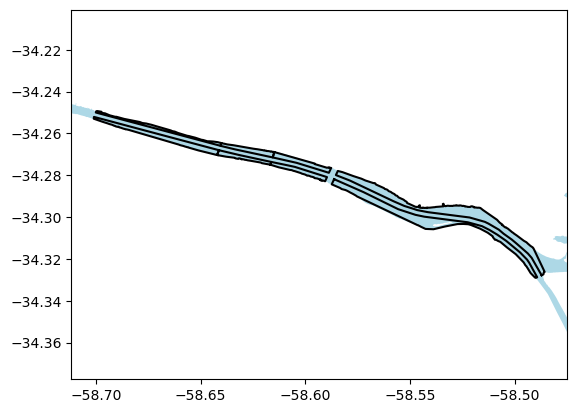

In [195]:
fig,ax = plt.subplots()
ax.plot(*KM_46_5_al_KM_68_7[0].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*KM_46_5_al_KM_68_7[1].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*KM_46_5_al_KM_68_7[2].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*KM_46_5_al_KM_68_7[3].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*KM_46_5_al_KM_68_7[4].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*KM_46_5_al_KM_68_7[5].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*KM_46_5_al_KM_68_7[6].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*KM_46_5_al_KM_68_7[7].geometry.iloc[0].exterior.coords.xy,color='k')

ax.axis('equal')
xlim = ax.get_xlim()
ylim = ax.get_ylim()
gdf.plot(ax=ax,facecolor=water_color,edgecolor='none')
ax.set_xlim(xlim)
ax.set_ylim(ylim);

In [196]:
KM_77_5_al_KM_83_0_E = Polygon([Point(-58.792284,-34.232120),
                                Point(-58.791731,-34.231397),
                                Point(-58.796607,-34.228736),
                                Point(-58.800767,-34.226079),
                                Point(-58.838807,-34.199431),
                                Point(-58.839677,-34.200310),
                                Point(-58.798320,-34.229250)])

KM_77_5_al_KM_83_0_W = Polygon([Point(-58.790307,-34.229580),
                                Point(-58.789743,-34.228878),
                                Point(-58.836738,-34.197398),
                                Point(-58.837119,-34.197724),
                                Point(-58.795300,-34.226870)])

In [197]:
KM_77_5_al_KM_83_0 = []
for poly in [KM_77_5_al_KM_83_0_E,KM_77_5_al_KM_83_0_W]:
    KM_77_5_al_KM_83_0.append(poly.intersection(water_area))

In [198]:
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Espera del KM 77.5 al KM 83 (Izquierda)',
                                             'geometry':KM_77_5_al_KM_83_0[0].geometry.iloc[0],
                                             'Port':'Parana de las Palmas - Puerto de Escobar - Puerto de Campana',
                                             'Detail':'Prioridad Mayor Calado'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Espera del KM 77.5 al KM 83 (Derecha)',
                                             'geometry':KM_77_5_al_KM_83_0[1].geometry.iloc[0],
                                             'Port':'Parana de las Palmas - Puerto de Escobar - Puerto de Campana',
                                             'Detail':'Prioridad Mayor Calado'}

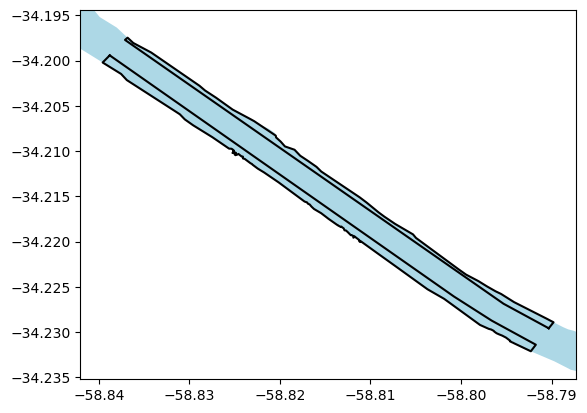

In [199]:
fig,ax = plt.subplots()
ax.plot(*KM_77_5_al_KM_83_0[0].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*KM_77_5_al_KM_83_0[1].geometry.iloc[0].exterior.coords.xy,color='k')

ax.axis('equal')
xlim = ax.get_xlim()
ylim = ax.get_ylim()
gdf.plot(ax=ax,facecolor=water_color,edgecolor='none')
ax.set_xlim(xlim)
ax.set_ylim(ylim);

In [200]:
KM_109__al_KM_111__W = Polygon([Point(-59.013354,-34.083865),
                                Point(-59.018806,-34.077741),
                                Point(-59.026759,-34.069765),
                                Point(-59.026408,-34.069524),
                                Point(-59.016682,-34.078434),
                                Point(-59.012654,-34.083371)])

KM_109__al_KM_111__E = Polygon([Point(-59.015334,-34.085154),
                                Point(-59.020138,-34.079809),
                                Point(-59.028933,-34.070913),
                                Point(-59.030020,-34.071449),
                                Point(-59.016307,-34.085805)])

KM_111__al_KM_112__W = Polygon([Point(-59.026408,-34.069524),
                                Point(-59.026759,-34.069765),
                                Point(-59.030031,-34.066479),
                                Point(-59.032892,-34.062308),
                                Point(-59.032513,-34.062123),
                                Point(-59.026408,-34.069524),
                                Point(-59.026759,-34.069765)])

KM_111__al_KM_112__E = Polygon([Point(-59.030020,-34.071449),
                                Point(-59.028933,-34.070913),
                                Point(-59.032284,-34.067475),
                                Point(-59.035179,-34.063224),
                                Point(-59.036245,-34.063702)])

In [201]:
KM_109__al_KM_112 = []
for poly in [KM_109__al_KM_111__W,KM_109__al_KM_111__E,KM_111__al_KM_112__W,KM_111__al_KM_112__E]:
    KM_109__al_KM_112.append(poly.intersection(water_area))

In [202]:
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Manobrias y Fondeo Exclusivo Zarate KM 109 al KM 111 (Izquierda)',
                                             'geometry':KM_109__al_KM_112[0].geometry.iloc[0],
                                             'Port':'Puerto de Zarate',
                                             'Detail':''}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Manobrias y Fondeo Exclusivo Zarate KM 109 al KM 111 (Derecha)',
                                             'geometry':KM_109__al_KM_112[1].geometry.iloc[0],
                                             'Port':'Puerto de Zarate',
                                             'Detail':''}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo del KM 111 al KM 112 (Izquierda)',
                                             'geometry':KM_109__al_KM_112[2].geometry.iloc[0],
                                             'Port':'Puerto de Zarate',
                                             'Detail':'Esloras entre 60 y 120 m'}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo del KM 111 al KM 112 (Derecha)',
                                             'geometry':KM_109__al_KM_112[3].geometry.iloc[0],
                                             'Port':'Puerto de Zarate',
                                             'Detail':'Esloras entre 60 y 120 m'}

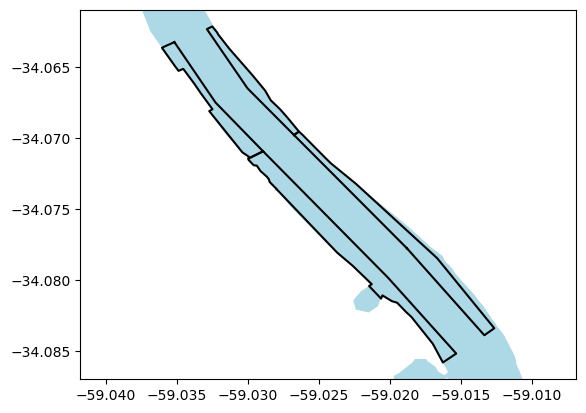

In [203]:
fig,ax = plt.subplots()
ax.plot(*KM_109__al_KM_112[0].iloc[0].geometry.exterior.coords.xy,color='k')
ax.plot(*KM_109__al_KM_112[1].iloc[0].geometry.exterior.coords.xy,color='k')
ax.plot(*KM_109__al_KM_112[2].iloc[0].geometry.exterior.coords.xy,color='k')
ax.plot(*KM_109__al_KM_112[3].iloc[0].geometry.exterior.coords.xy,color='k')

ax.axis('equal')
xlim = ax.get_xlim()
ylim = ax.get_ylim()
gdf.plot(ax=ax,facecolor=water_color,edgecolor='none')
ax.set_xlim(xlim)
ax.set_ylim(ylim);

In [204]:
Zona_de_Fondeo_Principal_Ramallo = Polygon([Point(-59.986792,-33.471225),
                                            Point(-59.985470,-33.467063),
                                            Point(-59.997530,-33.465670),
                                            Point(-59.998528,-33.467982)])

Zona_de_Fondeo_Auxiliar_Ramallo = Polygon([Point(-60.025807,-33.452434),
                                           Point(-60.032104,-33.449325),
                                           Point(-60.033217,-33.450876),
                                           Point(-60.026957,-33.454116)])

Zona_de_Espera_Ramallo = Polygon([Point(-60.037518,-33.444321),
                                  Point(-60.043885,-33.439665),
                                  Point(-60.045203,-33.440276),
                                  Point(-60.039519,-33.446398)])

In [205]:
Zonas_Ramallo = []
for poly in [Zona_de_Fondeo_Principal_Ramallo,Zona_de_Fondeo_Auxiliar_Ramallo,Zona_de_Espera_Ramallo]:
    Zonas_Ramallo.append(poly.intersection(water_area))

In [206]:
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo Principal (Izquierda)',
                                             'geometry':Zonas_Ramallo[0].geometry.iloc[0],
                                             'Port':'Puerto de Ramallo',
                                             'Detail':''}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo Auxiliar (Izquierda)',
                                             'geometry':Zonas_Ramallo[1].geometry.iloc[0],
                                             'Port':'Puerto de Ramallo',
                                             'Detail':''}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Espera (Izquierda)',
                                             'geometry':Zonas_Ramallo[2].geometry.iloc[0],
                                             'Port':'Puerto de Ramallo',
                                             'Detail':''}

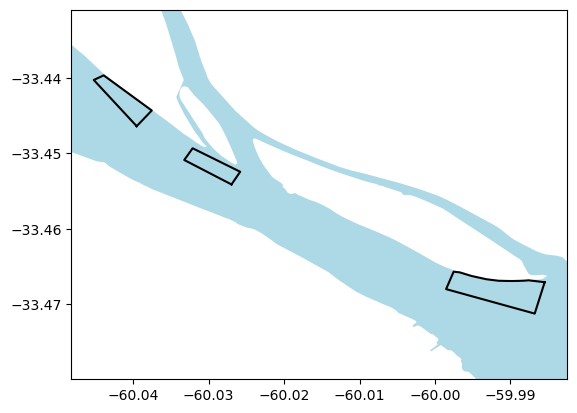

In [207]:
fig,ax = plt.subplots()
ax.plot(*Zonas_Ramallo[0].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*Zonas_Ramallo[1].geometry.iloc[0].exterior.coords.xy,color='k')
ax.plot(*Zonas_Ramallo[2].geometry.iloc[0].exterior.coords.xy,color='k')

ax.axis('equal')
xlim = ax.get_xlim()
ylim = ax.get_ylim()
gdf.plot(ax=ax,facecolor=water_color,edgecolor='none')
ax.set_xlim(xlim)
ax.set_ylim(ylim);

In [208]:
Rada_San_Nicolas_Sur = Polygon([Point(-60.134408,-33.363618),
                                Point(-60.132627,-33.364077),
                                Point(-60.129211,-33.364660),
                                Point(-60.118887,-33.365258),
                                Point(-60.116634,-33.365270),
                                Point(-60.113499,-33.364940),
                                Point(-60.108286,-33.363960),
                                Point(-60.107785,-33.365718),
                                Point(-60.113673,-33.366786),
                                Point(-60.117082,-33.367105),
                                Point(-60.119792,-33.367080),
                                Point(-60.128491,-33.366557),
                                Point(-60.131837,-33.366082),
                                Point(-60.135076,-33.365352)])

Rada_San_Nicolas_Norte = Polygon([Point(-60.166031,-33.345470),
                                  Point(-60.168674,-33.334862),
                                  Point(-60.170739,-33.329605),
                                  Point(-60.172795,-33.325784),
                                  Point(-60.170643,-33.325096),
                                  Point(-60.165434,-33.335310),
                                  Point(-60.162833,-33.344864)])

In [209]:
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Rada Sur (Derecho)',
                                             'geometry':Rada_San_Nicolas_Sur,
                                             'Port':'Puerto de San Nicolas',
                                             'Detail':''}
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Rada Norte (Izquierda)',
                                             'geometry':Rada_San_Nicolas_Norte,
                                             'Port':'Puerto de San Nicolas',
                                             'Detail':''}

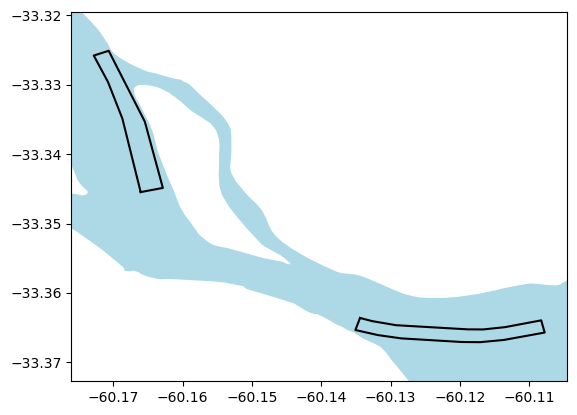

In [210]:
fig,ax = plt.subplots()
ax.plot(*Rada_San_Nicolas_Sur.exterior.coords.xy,color='k')
ax.plot(*Rada_San_Nicolas_Norte.exterior.coords.xy,color='k')

ax.axis('equal')
xlim = ax.get_xlim()
ylim = ax.get_ylim()
gdf.plot(ax=ax,facecolor=water_color,edgecolor='none')
ax.set_xlim(xlim)
ax.set_ylim(ylim);

In [211]:
Zona_de_Fondeo_Villa_Constitucion = Polygon([Point(-60.278185,-33.249013),
                                             Point(-60.280271,-33.251597),
                                             Point(-60.262705,-33.261811),
                                             Point(-60.256894,-33.254465)])

In [212]:
Zona_de_Fondeo_Villa_Constitucion = Zona_de_Fondeo_Villa_Constitucion.intersection(water_area).iloc[0].geometry

In [213]:
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo (Izquierda)',
                                             'geometry':Zona_de_Fondeo_Villa_Constitucion,
                                             'Port':'Puerto de Villa Constitucion',
                                             'Detail':''}

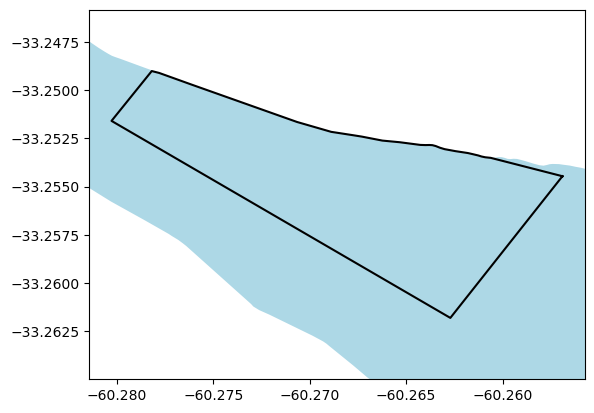

In [214]:
fig,ax = plt.subplots()
ax.plot(*Zona_de_Fondeo_Villa_Constitucion.exterior.coords.xy,color='k')

ax.axis('equal')
xlim = ax.get_xlim()
ylim = ax.get_ylim()
gdf.plot(ax=ax,facecolor=water_color,edgecolor='none')
ax.set_xlim(xlim)
ax.set_ylim(ylim);

In [215]:
Zona_de_Fondeo_Principal_Sur_San_Lorenzo = Polygon([Point(-60.721972,-32.747948),
                                                    Point(-60.721282,-32.759896),
                                                    Point(-60.711959,-32.780405),
                                                    Point(-60.707099,-32.779024),
                                                    Point(-60.715951,-32.747924)])

In [216]:
Zona_de_Fondeo_Principal_Sur_San_Lorenzo = Zona_de_Fondeo_Principal_Sur_San_Lorenzo.intersection(water_area).iloc[0].geometry

In [217]:
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Fondeo Principal Sur (Izquierda)',
                                             'geometry':Zona_de_Fondeo_Principal_Sur_San_Lorenzo,
                                             'Port':'Puerto de San Lorenzo',
                                             'Detail':''}

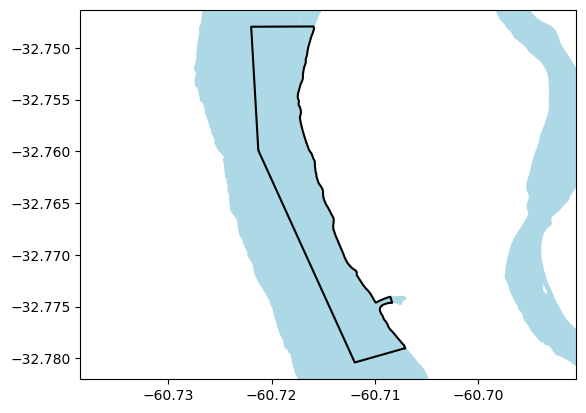

In [218]:
fig,ax = plt.subplots()
ax.plot(*Zona_de_Fondeo_Principal_Sur_San_Lorenzo.exterior.coords.xy,color='k')


ax.axis('equal')
xlim = ax.get_xlim()
ylim = ax.get_ylim()
gdf.plot(ax=ax,facecolor=water_color,edgecolor='none')
ax.set_xlim(xlim)
ax.set_ylim(ylim);

In [219]:
Zona_de_Alijo_San_Martin = Polygon([Point(-60.708393,-32.679748),
                                    Point(-60.711315,-32.681228),
                                    Point(-60.710108,-32.683080),
                                    Point(-60.707477,-32.689859),
                                    Point(-60.702648,-32.688584),
                                    Point(-60.705051,-32.684496)])

In [220]:
anchorage_areas.loc[len(anchorage_areas)] = {'Name':'Zona de Alijo - KM 452 (Izquierda)',
                                             'geometry':Zona_de_Fondeo_Principal_Sur_San_Lorenzo,
                                             'Port':'Puerto de San Martin',
                                             'Detail':''}

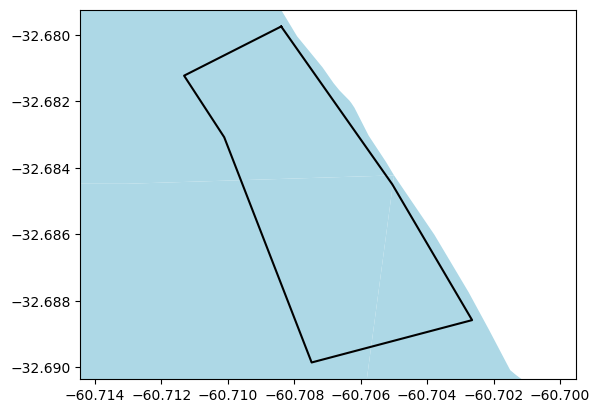

In [221]:
fig,ax = plt.subplots()
ax.plot(*Zona_de_Alijo_San_Martin.exterior.coords.xy,color='k')


ax.axis('equal')
xlim = ax.get_xlim()
ylim = ax.get_ylim()
gdf.plot(ax=ax,facecolor=water_color,edgecolor='none')
ax.set_xlim(xlim)
ax.set_ylim(ylim);

<AxesSubplot:>

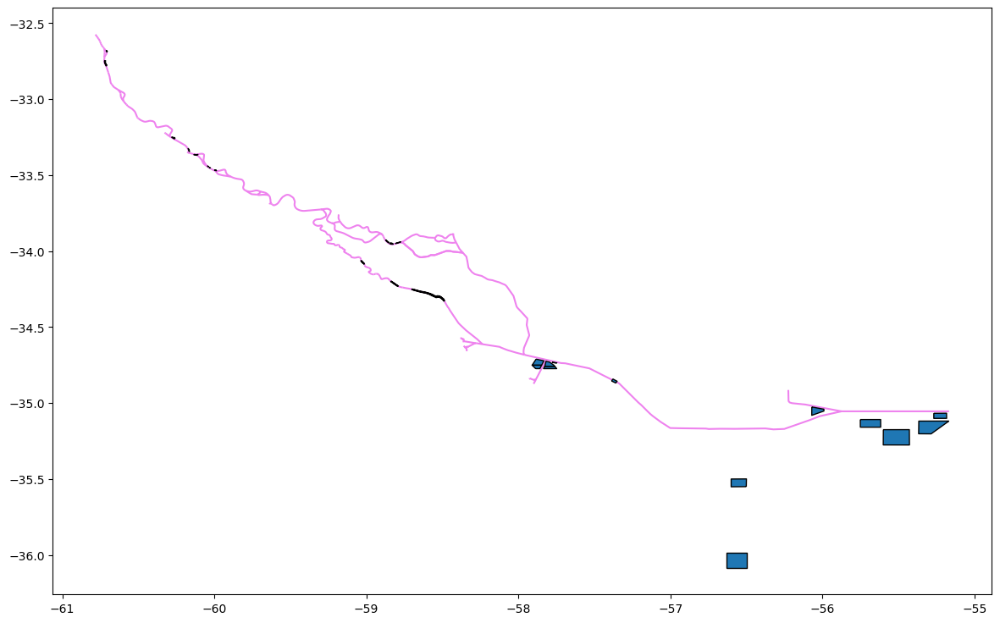

In [222]:
fig,ax = plt.subplots(figsize=[16,9])
fairways.plot(ax=ax,edgecolor='violet',zorder=0)
anchorage_areas.plot(ax=ax,edgecolor='k')

In [223]:
fairways = fairways.reset_index()

In [224]:
fairways = fairways.drop(46)
fairways = fairways.drop(44)
fairways = fairways.drop(42)

In [225]:
index = ['CANAL ACCESO AL PUERTO DE MONTEVIDEO',
         'CANAL ACCESO AL PUERTO DE MONTEVIDEO',
         'CANAL PUNTA INDIO, INTERMEDIO Y PASO BANCO CHICO',
         'PUERTO LA PLATA',
         'PUERTO LA PLATA',
         'PUERTO LA PLATA',
         'PUERTO LA PLATA',
         'PUERTO LA PLATA',
         'PUERTO LA PLATA',
         'PUERTO LA PLATA',
         'PUERTO LA PLATA',
         'PUERTO LA PLATA',
         'CANAL RADA EXTERIOR',
         'CANAL BROWN',
         'CANAL BROWN',
         'CANAL SUR',
         'CANAL HUERGO',
         'DOCK SUR',
         'DOCK SUR',
         'DOCK SUR',
         'DOCK SUR',
         'DOCK SUR',
         'DOCK SUR',
         'DOCK SUR',
         'DOCK SUR',
         'DOCK SUR',
         'DOCK SUR',
         'PUERTO NUEVO',
         'PUERTO NUEVO',
         'DOCK SUR',
         'PUERTO NUEVO',
         'CANAL MARTIN GARCIA',
         'CANAL MARTIN GARCIA',
         'PUERTO NUEVO',
         'PUERTO NUEVO',
         'PUERTO NUEVO',
         'PUERTO NUEVO',
         'PUERTO NUEVO',
         'PUERTO NUEVO',
         'PUERTO NUEVO',
         'PUERTO NUEVO',
         'PUERTO NUEVO',
         'CANAL MARTIN GARCIA',
         'RIO PARANA BRAVO',
         'RIO PARANA BRAVO',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA GUAZU',
         'RIO PARANA GUAZU',
         'RIO PARANA BRAVO',
         'RIO PARANA GUAZU',
         'RIO PARANA GUAZU',
         'RIO PARANA GUAZU',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA DE LAS PALMAS',
         'RIO IBICUY',
         'RIO PARANA DE LAS PALMAS',
         'PASAJE TALAVERA',
         'RIO PARANA GUAZU',
         'RIO PARANA DE LAS PALMAS',
         'RIO PARANA GUAZU',
         'RIO PARANA',
         'RIO PARANA',
         'PUERTO SAN PEDRO',
         'RIO PARANA',
         'RIO PARANA BRAZO ISLA DEL MEDIO',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA BRAZO ISLA DEL DIABLO',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA BRAZO ISLA DE LAS HERMANAS',
         'RIO PARANA BRAZO ISLA DE LAS HERMANAS',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA BRAZO ISLA GUACO',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'PUERTO SAN NICOLAS',
         'PUERTO SAN NICOLAS',
         'PUERTO SAN NICOLAS',
         'PUERTO VILLA CONSTITUCION',
         'PUERTO VILLA CONSTITUCION',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA BRAZO ISLA INGENIERO SABINO CORSI NORTE',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'PUERTO SAN MARTIN',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'PUERTO SAN MARTIN',
         'PUERTO SAN MARTIN',
         'PUERTO SAN MARTIN',
         'PUERTO SAN MARTIN',
         'RIO PARANA', 
         'PUERTO SAN MARTIN',
         'PUERTO SAN MARTIN',
         'RIO PARANA', 
         'RIO PARANA', 
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'RIO PARANA',
         'PUERTO TIMBUES',
         'PUERTO TIMBUES',
         'PUERTO TIMBUES',
         'PUERTO TIMBUES']

In [226]:
fairways = fairways[['geometry']]

In [227]:
fairways['name'] = index

In [228]:
fairways = fairways[['name','geometry']].reset_index(drop=True)

In [229]:
df = gpd.GeoDataFrame(pd.DataFrame.from_dict(dict(FG.edges), orient='index')).reset_index()
fairways.loc[45,'geometry'] = df[df.level_0 == 'Puerto GNL Escobar Ute Enarsa-YPF S.A.'][df.level_1 == 'Emilio Mitre KM_47.2'].geometry.iloc[0]
fairways.at[-1,'name'] = 'CANAL EMILIO MITRE'
fairways.at[-1,'geometry'] = df[df.level_0 == 'Brown KM_12'][df.level_1 == 'Emilio Mitre KM_47.2'].geometry.iloc[0]

C:\Users\floorbakker\Anaconda3\envs\opentnsim\lib\site-packages\geopandas\geodataframe.py:1475: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)
C:\Users\floorbakker\Anaconda3\envs\opentnsim\lib\site-packages\geopandas\geodataframe.py:1475: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)


In [230]:
fairways.reset_index(drop=True)

,name,geometry
0,CANAL ACCESO AL PUERTO DE MONTEVIDEO,"LINESTRING (-55.87406 -35.05417, -55.87405 -35..."
1,CANAL ACCESO AL PUERTO DE MONTEVIDEO,"LINESTRING (-56.22458 -34.91365, -56.22288 -34..."
2,"CANAL PUNTA INDIO, INTERMEDIO Y PASO BANCO CHICO","LINESTRING (-57.81806 -34.71453, -57.71994 -34..."
3,PUERTO LA PLATA,"LINESTRING (-57.88713 -34.84071, -57.89143 -34..."
4,PUERTO LA PLATA,"LINESTRING (-57.88801 -34.85077, -57.89979 -34..."
...,...,...
135,PUERTO TIMBUES,"LINESTRING (-60.76148 -32.60340, -60.75899 -32..."
136,PUERTO TIMBUES,"LINESTRING (-60.76828 -32.59388, -60.76570 -32..."
137,PUERTO TIMBUES,"LINESTRING (-60.77667 -32.58210, -60.77238 -32..."
138,PUERTO TIMBUES,"LINESTRING (-60.78181 -32.57487, -60.77897 -32..."


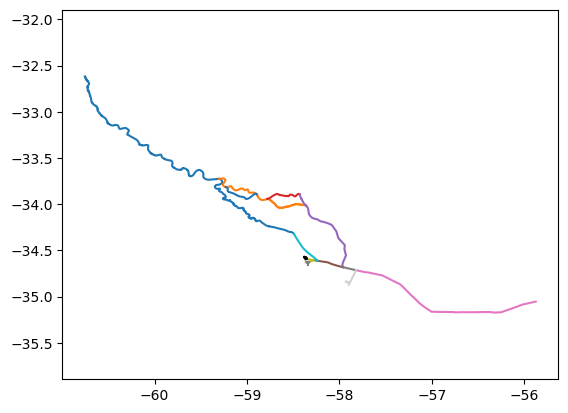

In [231]:
fig,ax = plt.subplots()
for geometry in fairways[fairways.name.isin(['RIO PARANA','RIO PARANA DE LAS PALMAS'])].geometry:
    ax.plot(*geometry.coords.xy,color='C0')
for geometry in fairways[fairways.name.isin(['RIO PARANA GUAZU'])].geometry:
    ax.plot(*geometry.coords.xy,color='C1')
for geometry in fairways[fairways.name.isin(['RIO PASAJE TALAVERA'])].geometry:
    ax.plot(*geometry.coords.xy,color='C2')
for geometry in fairways[fairways.name.isin(['RIO PARANA BRAVO'])].geometry:
    ax.plot(*geometry.coords.xy,color='C3')   
for geometry in fairways[fairways.name.isin(['CANAL MARTIN GARCIA'])].geometry:
    ax.plot(*geometry.coords.xy,color='C4')  
for geometry in fairways[fairways.name.isin(['CANAL BROWN'])].geometry:
    ax.plot(*geometry.coords.xy,color='C5')  
for geometry in fairways[fairways.name.isin(['CANAL PUNTA INDIO, INTERMEDIO Y PASO BANCO CHICO'])].geometry:
    ax.plot(*geometry.coords.xy,color='C6')   
for geometry in fairways[fairways.name.isin(['CANAL RADA EXTERIOR'])].geometry:
    ax.plot(*geometry.coords.xy,color='C7')   
for geometry in fairways[fairways.name.isin(['CANAL SUR','CANAL HUERGO'])].geometry:
    ax.plot(*geometry.coords.xy,color='C8')  
for geometry in fairways[fairways.name.isin(['CANAL EMILIO MITRE'])].geometry:
    ax.plot(*geometry.coords.xy,color='C9')  
for geometry in fairways[fairways.name.isin(['PASAJE TALAVERA'])].geometry:
    ax.plot(*geometry.coords.xy,color='C10')  
for geometry in fairways[fairways.name.isin(['PUERTO NUEVO'])].geometry:
    ax.plot(*geometry.coords.xy,color='k')   
for geometry in fairways[fairways.name.isin(['PUERTO LA PLATA'])].geometry:
    ax.plot(*geometry.coords.xy,color='lightgrey')  
for geometry in fairways[fairways.name.isin(['DOCK SUR'])].geometry:
    ax.plot(*geometry.coords.xy,color='grey')  
ax.axis('equal');

In [232]:
Canal_Rio_de_la_Plata = shapely.ops.linemerge(fairways[fairways.name.isin(['CANAL BROWN','CANAL PUNTA INDIO, INTERMEDIO Y PASO BANCO CHICO','CANAL RADA EXTERIOR'])].geometry.to_numpy())
Parana_de_las_Palmas = shapely.ops.linemerge(fairways[fairways.name.isin(['RIO PARANA DE LAS PALMAS'])].geometry.to_numpy())
Parana = shapely.ops.linemerge(fairways[fairways.name.isin(['RIO PARANA'])].geometry.to_numpy())
Emilio = shapely.ops.linemerge(fairways[fairways.name.isin(['CANAL EMILIO MITRE'])].geometry.to_numpy())
utm_5 = pyproj.CRS('EPSG:22185')
wgs84_to_utm_5 = pyproj.Transformer.from_crs(wgs84,utm_5,always_xy=True).transform
utm_5_to_wgs84 = pyproj.Transformer.from_crs(utm_5,wgs84,always_xy=True).transform
Parana_utm = transform(wgs84_to_utm_5,Parana)
Emilio_utm = transform(wgs84_to_utm_5,Emilio)
Canal_Rio_de_la_Plata_utm = transform(wgs84_to_utm_5,Canal_Rio_de_la_Plata)
Parana_de_las_Palmas_utm = transform(wgs84_to_utm_5,Parana_de_las_Palmas)

In [233]:
offset = (Parana_utm.length+234800)/461000

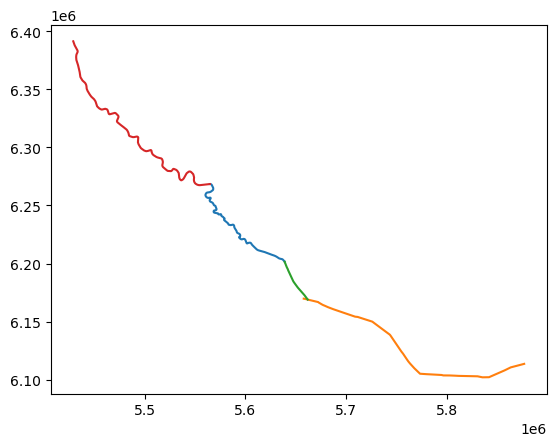

In [234]:
plt.plot(*Parana_de_las_Palmas_utm.coords.xy)
plt.plot(*Canal_Rio_de_la_Plata_utm.coords.xy)
plt.plot(*Emilio_utm.coords.xy)
plt.plot(*Parana_utm.coords.xy)

In [235]:
anchorage_areas = anchorage_areas.set_crs('EPSG:4326')

In [236]:
from shapely.ops import split
from shapely.ops import split,snap

def split_line_by_point(line, point, tolerance: float=0.001):
    return split(snap(line, point, tolerance), point)

def reverse_geom(geom):
    def _reverse(x, y, z=None):
        if z:
            return x[::-1], y[::-1], z[::-1]
        return x[::-1], y[::-1]

    return shapely.ops.transform(_reverse, geom)

def determine_direction(waterway):
    x0,y0 = waterway.coords.xy[0][0],waterway.coords.xy[1][0]
    xn,yn = waterway.coords.xy[0][-1],waterway.coords.xy[1][-1]
    direction = np.degrees(math.atan2(np.sign(xn-x0),np.sign(yn-y0)))
    if direction >= 0 and direction < 90:
        direction_name = 'NE'
    if direction >= 90 and direction < 180:
        direction_name = 'SE'
    if direction >= 180 and direction < 270:
        direction_name = 'SW'
    if direction >= 270 and direction < 360:
        direction_name = 'NW'
    if direction < 0 and direction >= -90:
        direction_name = 'NW'
    if direction < -90 and direction >= -180:
        direction_name = 'SW'
    return direction_name

In [237]:
def interpolate_waterway(waterway,distance,orientation,utm):
    
    direction = determine_direction(waterway)
    if orientation != direction:
        waterway = reverse_geom(waterway)
    
    wgs84 = pyproj.CRS('EPSG:4326')
    wgs84_to_utm = pyproj.Transformer.from_crs(wgs84,utm,always_xy=True).transform
    utm_to_wgs84 = pyproj.Transformer.from_crs(utm,wgs84,always_xy=True).transform
    waterway = transform(wgs84_to_utm,waterway)   
    interpolation_point = waterway.interpolate(distance)
    interpolation_point = transform(utm_to_wgs84,interpolation_point)  
    return interpolation_point
    
def create_anchorage_area_along_waterway(water_area,waterway,start_point,end_point,orientation,utm,safety_distance=200,anchorage_area_width=2000,side='Left'):
    if side == 'Left':
        sign = -1
    else:
        sign = 1
    
    direction = determine_direction(waterway)
    if orientation != direction:
        waterway = reverse_geom(waterway)

    waterway = split_line_by_point(waterway,start_point).geoms[-1]
    waterway = split_line_by_point(waterway,end_point).geoms[0]
    wgs84 = pyproj.CRS('EPSG:4326')
    wgs84_to_utm = pyproj.Transformer.from_crs(wgs84,utm,always_xy=True).transform
    utm_to_wgs84 = pyproj.Transformer.from_crs(utm,wgs84,always_xy=True).transform
    anchorage_area_edge = transform(wgs84_to_utm,waterway)   
    anchorage_area_edge_inner = anchorage_area_edge.offset_curve(sign*(safety_distance))
    anchorage_area_edge_outer = anchorage_area_edge.offset_curve(sign*(safety_distance+anchorage_area_width))
    anchorage_area_edge_inner = transform(utm_to_wgs84,anchorage_area_edge_inner)  
    anchorage_area_edge_outer = transform(utm_to_wgs84,anchorage_area_edge_outer)  
    anchorage_area = Polygon([*list(anchorage_area_edge_inner.coords), *list(anchorage_area_edge_outer.coords)[::-1]])
    anchorage_area = anchorage_area.intersection(water_area).iloc[0].geometry
    if isinstance(anchorage_area,shapely.geometry.MultiPolygon):
        anchorage_area = anchorage_area.geoms[0]
    return anchorage_area

In [238]:
test_anchorages = []
anchorage_points = []

utm = pyproj.CRS('EPSG:22185')

end_KM = [405000,410000,419500,424000,426000,453000,455000]
start_KM = [406500,412500,421500,425000,428000,453500,455600]
river_side = ['Left','Right','Right','Right','Right','Right','Right']

for start_dist,end_dist,side in zip(start_KM,end_KM,river_side):
    start_point = interpolate_waterway(Parana,(Parana_utm.length-start_dist)/1-500,'SE',utm)
    anchorage_points.append(start_point)
    end_point = interpolate_waterway(Parana,(Parana_utm.length-end_dist)/1+500,'SE',utm)
    anchorage_points.append(end_point)
    test_anchorages.append(create_anchorage_area_along_waterway(water_area,Parana,start_point,end_point,'SE',utm,anchorage_area_width=2000,side=side))

In [239]:
KM410_KM412 = create_anchorage_area_along_waterway(water_area,Parana,Point(-60.588336,-33.024379),Point(-60.603612,-33.004796),'NW',utm,anchorage_area_width=2000,side='Left')

In [240]:
KM419_KM421 = create_anchorage_area_along_waterway(water_area,Parana,Point(-60.627360,-32.944581),Point(-60.643208,-32.931854),'NW',utm,anchorage_area_width=2000,side='Left')

In [241]:
KM424_KM425 = create_anchorage_area_along_waterway(water_area,Parana,Point(-60.663445,-32.917307),Point(-60.669229,-32.909732),'NW',utm,anchorage_area_width=2000,side='Left')

In [242]:
KM426_KM428 = create_anchorage_area_along_waterway(water_area,Parana,Point(-60.675002,-32.902174),Point(-60.682639,-32.886831),'NW',utm,anchorage_area_width=2000,side='Left')

In [243]:
KM442_KM445 = create_anchorage_area_along_waterway(water_area,Parana,Point(-60.718281,-32.769632),Point(-60.723838,-32.743247),'NW',utm,anchorage_area_width=500,side='Left')

In [244]:
KM455_KM455 = create_anchorage_area_along_waterway(water_area,Parana,Point(-60.724813,-32.666845),Point(-60.728402,-32.662226),'NW',utm,anchorage_area_width=500,side='Left')

In [245]:
waterway = Parana
Point(-60.627360,-32.944581)
Point(-60.643208,-32.931854)
anchorage_area_width = 2000
orientation = 'NW'
safety_distance = 100 

if side == 'Left':
    sign = -1
else:
    sign = 1

direction = determine_direction(waterway)
if orientation != direction:
    waterway = reverse_geom(waterway)

waterway = split_line_by_point(waterway,start_point).geoms[-1]
waterway = split_line_by_point(waterway,end_point).geoms[0]
wgs84 = pyproj.CRS('EPSG:4326')
wgs84_to_utm = pyproj.Transformer.from_crs(wgs84,utm,always_xy=True).transform
utm_to_wgs84 = pyproj.Transformer.from_crs(utm,wgs84,always_xy=True).transform
anchorage_area_edge = transform(wgs84_to_utm,waterway)   
anchorage_area_edge_inner = anchorage_area_edge.offset_curve(sign*(safety_distance))
anchorage_area_edge_outer = anchorage_area_edge.offset_curve(sign*(safety_distance+anchorage_area_width))
anchorage_area_edge_inner = transform(utm_to_wgs84,anchorage_area_edge_inner)  
anchorage_area_edge_outer = transform(utm_to_wgs84,anchorage_area_edge_outer)  
anchorage_area = Polygon([*list(anchorage_area_edge_inner.coords), *list(anchorage_area_edge_outer.coords)[::-1]])
anchorage_area = anchorage_area.intersection(water_area).iloc[0].geometry
if isinstance(anchorage_area,shapely.geometry.MultiPolygon):
    anchorage_area = anchorage_area.geoms[0]

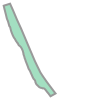

In [246]:
anchorage_area

In [247]:
test_anchorage_points = gpd.GeoDataFrame(gpd.GeoSeries(anchorage_points),columns=['geometry'],crs='EPSG:4326')
test_anchorages = gpd.GeoDataFrame(gpd.GeoSeries(test_anchorages),columns=['geometry'],crs='EPSG:4326')

In [248]:
test_anchorages

,geometry
0,"POLYGON ((-60.56214 -33.05267, -60.56213 -33.0..."
1,"POLYGON ((-60.58116 -33.02944, -60.58300 -33.0..."
2,"POLYGON ((-60.61940 -32.95229, -60.61980 -32.9..."
3,"POLYGON ((-60.65321 -32.92316, -60.65471 -32.9..."
4,"POLYGON ((-60.66643 -32.91003, -60.66742 -32.9..."
5,"POLYGON ((-60.71305 -32.67887, -60.71521 -32.6..."
6,"POLYGON ((-60.72463 -32.66373, -60.72880 -32.6..."


(-32.6645762248989, -32.64595871126146)

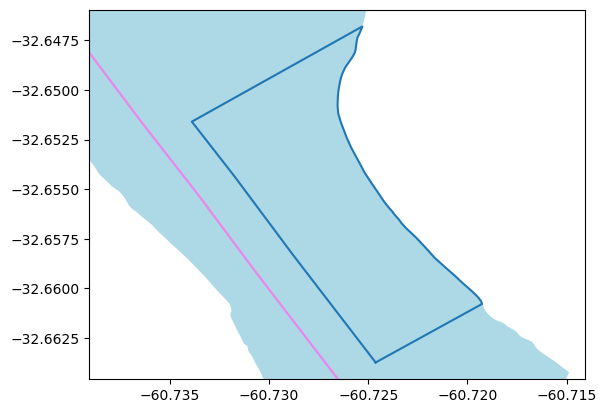

In [249]:
fig,ax = plt.subplots()
ax.plot(*test_anchorages.iloc[-1].geometry.exterior.coords.xy,zorder=1)
xmin,xmax,ymin,ymax = plt.axis('equal')
ax.plot(*Parana.coords.xy,zorder=1,color='violet')
water_area.plot(ax=ax,color='lightblue',zorder=0)
ax.set_xlim(xmin,xmax)
ax.set_ylim(ymin,ymax)

In [250]:
end_KM = [405000,410000,419500,424000,426000,453000,455000]
start_KM = [406500,412500,421500,425000,428000,453500,455600]

test_anchorages['Name'] = ['Zona de Fondeo Punta Alvear',
                           'Zona de Fondeo Principal - KM 410 al KM 412.5',
                           'Zona de Fondeo Secundaria - KM 419.5 al KM 421.5',
                           'Zona de Fondeo Auxiliar - KM 424 al KM 425',
                           'Zona de Fondeo Reserva - KM 426 al KM 428',
                           'Fondeadero Auxiliar Sur',
                           'Fondeadero Auxiliar Norte']
test_anchorages['Port'] = ['Puerto de Rosario',
                           'Puerto de Rosario',
                           'Puerto de Rosario',
                           'Puerto de Rosario',
                           'Puerto de Rosario',
                           'Puerto de San Martin',
                           'Puerto de San Martin']
test_anchorages['Detail'] = ''
test_anchorages

,geometry,Name,Port,Detail
0,"POLYGON ((-60.56214 -33.05267, -60.56213 -33.0...",Zona de Fondeo Punta Alvear,Puerto de Rosario,
1,"POLYGON ((-60.58116 -33.02944, -60.58300 -33.0...",Zona de Fondeo Principal - KM 410 al KM 412.5,Puerto de Rosario,
2,"POLYGON ((-60.61940 -32.95229, -60.61980 -32.9...",Zona de Fondeo Secundaria - KM 419.5 al KM 421.5,Puerto de Rosario,
3,"POLYGON ((-60.65321 -32.92316, -60.65471 -32.9...",Zona de Fondeo Auxiliar - KM 424 al KM 425,Puerto de Rosario,
4,"POLYGON ((-60.66643 -32.91003, -60.66742 -32.9...",Zona de Fondeo Reserva - KM 426 al KM 428,Puerto de Rosario,
5,"POLYGON ((-60.71305 -32.67887, -60.71521 -32.6...",Fondeadero Auxiliar Sur,Puerto de San Martin,
6,"POLYGON ((-60.72463 -32.66373, -60.72880 -32.6...",Fondeadero Auxiliar Norte,Puerto de San Martin,


In [251]:
test_anchorages.loc[1,'geometry'] = KM410_KM412
test_anchorages.loc[2,'geometry'] = KM419_KM421
test_anchorages.loc[3,'geometry'] = KM424_KM425
test_anchorages.loc[4,'geometry'] = KM426_KM428
test_anchorages.loc[5,'geometry'] = KM442_KM445
test_anchorages.loc[6,'geometry'] = KM455_KM455

In [252]:
anchorage_areas = pd.concat([anchorage_areas,test_anchorages])
anchorage_areas = anchorage_areas.reset_index(drop=True)

In [253]:
pilotage_area = anchorage_areas.loc[17]
anchorage_areas = anchorage_areas.drop(17)

In [254]:
anchorage_areas

,Name,geometry,Port,Detail
0,Zona de Alijo - KM 452,"POLYGON ((-60.70240 -32.68839, -60.70748 -32.6...",San Martin,
1,Zona de Fondeo y Espera Banco Chico - KM 93 a ...,"POLYGON ((-57.38743 -34.85411, -57.37763 -34.8...",Rio de la Plata Interior,
2,Zona de Fondeos y Servicios - Zona Recalada,"POLYGON ((-56.06994 -35.02554, -55.99045 -35.0...",Rio de la Plata Exterior,
3,"Zona de Alijo ""Delta""","POLYGON ((-55.26751 -35.06718, -55.18383 -35.0...",Rio de la Plata Exterior,
4,"Zona de Alijo ""Alfa""","POLYGON ((-55.75107 -35.10815, -55.61723 -35.1...",Rio de la Plata Exterior,
5,Zona de Fondeo y Espera Este - Parana Guazu,"POLYGON ((-58.77286 -33.94039, -58.80666 -33.9...",Terminal de Guazu,
6,Zona de Alijo - Parana Guazu,"POLYGON ((-58.82413 -33.95084, -58.82378 -33.9...",Terminal de Guazu,
7,Zona de Fondeo y Espera Oeste - Parana Guazu,"POLYGON ((-58.86035 -33.93633, -58.85035 -33.9...",Terminal de Guazu,
8,Zona de Reserva Operativa - Parana Guazu,"POLYGON ((-58.86035 -33.93633, -58.86329 -33.9...",Terminal de Guazu,
9,Zona de Fondeo y Espera Este,"POLYGON ((-55.16819 -35.11822, -55.28526 -35.2...",Rio de la Plata Exterior,


In [255]:
def create_turning_basin(turning_point,turning_width,utm):
    wgs84 = pyproj.CRS('EPSG:4326')
    wgs84_to_utm = pyproj.Transformer.from_crs(wgs84,utm,always_xy=True).transform
    utm_to_wgs84 = pyproj.Transformer.from_crs(utm,wgs84,always_xy=True).transform  
    turning_point = transform(wgs84_to_utm,turning_point)
    turning_basin = turning_point.buffer(turning_width)
    turning_basin = transform(utm_to_wgs84,turning_basin)
    return turning_basin

In [256]:
def create_manoeuvring_area(water_area,waterway,start_point,end_point,orientation,area_width,utm):
    direction = determine_direction(waterway)
    if orientation != direction:
        waterway = reverse_geom(waterway)
    
    waterway = split_line_by_point(waterway,start_point).geoms[-1]
    waterway = split_line_by_point(waterway,end_point).geoms[0]
    wgs84 = pyproj.CRS('EPSG:4326')
    wgs84_to_utm = pyproj.Transformer.from_crs(wgs84,utm,always_xy=True).transform
    utm_to_wgs84 = pyproj.Transformer.from_crs(utm,wgs84,always_xy=True).transform
    area_edge = transform(wgs84_to_utm,waterway)  
    area_edge_left = area_edge.offset_curve(area_width)
    area_edge_rigth = area_edge.offset_curve(-1*area_width)
    area_edge_left = transform(utm_to_wgs84,area_edge_left)  
    area_edge_rigth = transform(utm_to_wgs84,area_edge_rigth)
    area = Polygon([*list(area_edge_left.coords), *list(area_edge_rigth.coords)[::-1]])
    area = area.intersection(water_area.iloc[0].geometry)
    if isinstance(area,shapely.geometry.MultiPolygon):
        area = area.geoms[0]
    return area

In [257]:
utm = pyproj.CRS('EPSG:22185')
Puerto_Nuevo_Maniobras = create_turning_basin(Point(-58.359297,-34.591782),240,utm)
Dock_Sud_Maniobras = create_turning_basin(Point(-58.348846,-34.634028),150,utm)
La_Plata_Maniobras = create_turning_basin(Point(-57.887740,-34.850052),150,utm)

In [258]:
turning_basins = gpd.GeoDataFrame(columns=['Name','Port','Diameter','geometry'])
turning_basins.loc[len(turning_basins)] = {'Name':'Antepuerto Norte','Port':'Puerto Nuevo de Buenos Aires','Diameter':480,'geometry':Puerto_Nuevo_Maniobras}
turning_basins.loc[len(turning_basins)] = {'Name':'Antepuerto Sud','Port':'Dock Sud de Buenos Aires','Diameter':300,'geometry':Dock_Sud_Maniobras}
turning_basins.loc[len(turning_basins)] = {'Name':'Antepuerto Norte','Port':'Puerto La Plata','Diameter':300,'geometry':La_Plata_Maniobras}

In [259]:
escobar_maniobras = create_manoeuvring_area(water_area,Parana_de_las_Palmas,Point(-58.772126,-34.237264),Point(-58.778829,-34.235488),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Giro','Port':'Puerto de Escobar','Diameter':520,'geometry':escobar_maniobras}

In [260]:
campana_maniobras = create_manoeuvring_area(water_area,Parana_de_las_Palmas,Point(-58.932071,-34.149323),Point(-58.981179,-34.141072),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras','Port':'Puerto de Campana','Diameter':520,'geometry':campana_maniobras}

In [261]:
zarate_maniobras = create_manoeuvring_area(water_area,Parana_de_las_Palmas,Point(-59.014475,-34.084404),Point(-59.028033,-34.070324),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobra Exclusivo Zarate del KM 109 al KM 111','Port':'Terminal Zarate','Diameter':520,'geometry':zarate_maniobras}

In [262]:
ramallo_maniobras = create_manoeuvring_area(water_area,Parana,Point(-59.999113,-33.469279),Point(-60.027718,-33.455349),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobra','Port':'Puerto de Ramallo','Diameter':520,'geometry':ramallo_maniobras}

In [263]:
san_nicolas_maniobras = create_manoeuvring_area(water_area,Parana,Point(-60.144228,-33.359630),Point(-60.167674,-33.345817),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras','Port':'Puerto de San Nicolas','Diameter':520,'geometry':san_nicolas_maniobras}

In [264]:
villa_sur_maniobras = create_manoeuvring_area(water_area,Parana,Point(-60.254955,-33.268585),Point(-60.263961,-33.263438),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobra Sur','Port':'Puerto de Villa Constitucion','Diameter':520,'geometry':villa_sur_maniobras}

In [265]:
villa_centro_maniobras = create_manoeuvring_area(water_area,Parana,Point(-60.281226,-33.252776),Point(-60.289688,-33.247357),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobra Centro','Port':'Puerto de Villa Constitucion','Diameter':520,'geometry':villa_centro_maniobras}

In [266]:
villa_norte_maniobras = create_manoeuvring_area(water_area,Parana,Point(-60.289688,-33.247357),Point(-60.293311,-33.234962),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobra Norte','Port':'Puerto de Villa Constitucion','Diameter':520,'geometry':villa_norte_maniobras}

In [267]:
arroyo_norte__maniobras = create_manoeuvring_area(water_area,Parana,Point(-60.289688,-33.247357),Point(-60.293311,-33.234962),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobra Norte','Port':'Puerto de Villa Constitucion','Diameter':520,'geometry':arroyo_norte__maniobras}

In [268]:
arroyo_sur_maniobras = create_manoeuvring_area(water_area,Parana,Point(-60.486830,-33.136374),Point(-60.492723,-33.132318),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras Sur','Port':'Puerto de Arroyo Seco','Diameter':520,'geometry':arroyo_sur_maniobras}

In [269]:
arroyo_norte_maniobras = create_manoeuvring_area(water_area,Parana,Point(-60.515061,-33.099493),Point(-60.522963,-33.082730),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras Norte','Port':'Puerto de Arroyo Seco','Diameter':520,'geometry':arroyo_norte_maniobras}

In [270]:
punta_alvear = create_manoeuvring_area(water_area,Parana,Point(-60.575511,-33.038505),Point(-60.588305,-33.024395),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras Punta Alvear','Port':'Puerto de Rosario','Diameter':520,'geometry':punta_alvear}

In [271]:
rosario_moniobras = create_manoeuvring_area(water_area,Parana,Point(-60.643178,-32.931870),Point(-60.663430,-32.917322),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras Sur','Port':'Puerto de Rosario','Diameter':520,'geometry':rosario_moniobras}

In [272]:
rosario_moniobras_II = create_manoeuvring_area(water_area,Parana,Point(-60.682632,-32.886893),Point(-60.685252,-32.872219),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras Norte','Port':'Puerto de Rosario','Diameter':520,'geometry':rosario_moniobras_II}

In [273]:
San_Lorenzo_Sur = create_manoeuvring_area(water_area,Parana,Point(-60.705442,-32.799846),Point(-60.712825,-32.780674),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras Sur','Port':'Puerto de San Loreno y San Martin','Diameter':520,'geometry':San_Lorenzo_Sur}

In [274]:
San_Lorenzo_Centro = create_manoeuvring_area(water_area,Parana,Point(-60.714611,-32.680339),Point(-60.723667,-32.668469),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras Centro','Port':'Puerto de San Loreno y San Martin','Diameter':520,'geometry':San_Lorenzo_Centro}

In [275]:
San_Lorenzo_Norte = create_manoeuvring_area(water_area,Parana,Point(-60.714611,-32.680339),Point(-60.723667,-32.668469),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras Norte','Port':'Puerto de San Loreno y San Martin','Diameter':520,'geometry':San_Lorenzo_Norte}

In [276]:
Timbues = shapely.ops.linemerge(fairways[fairways.name.isin(['PUERTO TIMBUES'])].geometry.to_numpy())

In [277]:
San_Lorenzo_Norte_II = create_manoeuvring_area(water_area,Timbues,Point(-60.779009,-32.578918),Point(-60.792267, -32.560207),'NW',1000,utm)
turning_basins.loc[len(turning_basins)] = {'Name':'Zona de Maniobras Norte II','Port':'Puerto de San Loreno y San Martin','Diameter':520,'geometry':San_Lorenzo_Norte_II}

In [278]:
red_buoys = ['BRL','BRBL','BRVRL','BRC','BzRL','BzRC','Bz RVR L','BzRVRL',] 
green_buoys = ['BVL','BVRVL','BVC','BzVL','BzVRVL','Bz VRV L','BzVC'] 
white_buoys = ['BzBrL','BzBL','BzBvL'] 
yellow_buoys = ['BAmL','BAmNAmL','BAmNL','BzAmL']
black_buoys = ['BNAmNL','BNAmL','BNRNC','BNRNL','BzNRNL']

In [279]:
m = folium.Map(location=[-34.5,-58], zoom_start = 8,tiles="cartodbpositron")

style_anchorage = {'fillColor': '#4CFF00', 'color': '#4CFF00', 'fillOpacity':0,'dashArray':'4'}
tooltip_anchorage = folium.GeoJsonTooltip(fields=["Name", "Port"],
                                aliases=["Name:","Port:"],
                                localize=True,
                                sticky=False,
                                labels=True,
                                style="""
                                    background-color: #F0EFEF;
                                    border: 2px solid black;
                                    border-radius: 3px;
                                    box-shadow: 3px;
                                """,
                                max_width=800,) 
popup_anchorage = folium.GeoJsonPopup(fields=["Name", "Port","Detail"],
                            aliases=["Name:","Port:","Detail:"],
                            localize=True,
                            labels=True,
                            style="""
                                    background-color: #F0EFEF;
                                    border: 2px solid black;
                                    border-radius: 3px;
                                    box-shadow: 3px;
                                """,
                            max_width=800,)
folium.GeoJson(anchorage_areas.set_crs('EPSG:4326'),style_function=lambda x:style_anchorage,tooltip=tooltip_anchorage,popup=popup_anchorage).add_to(m)

style_turning_basin = {'fillColor': '#FF0000', 'color': '#FF0000', 'fillOpacity':0,'dashArray':'4'}
tooltip_turning_basin = folium.GeoJsonTooltip(fields=["Name", "Port"],
                                aliases=["Name:","Port:"],
                                localize=True,
                                sticky=False,
                                labels=True,
                                style="""
                                    background-color: #F0EFEF;
                                    border: 2px solid black;
                                    border-radius: 3px;
                                    box-shadow: 3px;
                                """,
                                max_width=800,)
popup_turning_basin = folium.GeoJsonPopup(fields=["Name", "Port", "Diameter"],
                            aliases=["Name:","Port:","Diameter:"],
                            localize=True,
                            labels=True,
                            style="""
                                    background-color: #F0EFEF;
                                    border: 2px solid black;
                                    border-radius: 3px;
                                    box-shadow: 3px;
                                """,
                            max_width=800,)

folium.GeoJson(turning_basins.set_crs('EPSG:4326'),style_function=lambda x:style_turning_basin,tooltip=tooltip_turning_basin,popup=popup_turning_basin).add_to(m)

style = {'fillColor': '#000000', 'color': '#000000', 'opacity':0}
tooltip_berths = folium.GeoJsonTooltip(fields=["Port", "Company", "Berth"],
                                aliases=["City:","Port/Company:", "Berth:"],
                                localize=True,
                                sticky=False,
                                labels=True,
                                style="""
                                    background-color: #F0EFEF;
                                    border: 2px solid black;
                                    border-radius: 3px;
                                    box-shadow: 3px;
                                """,
                                max_width=800,)
popup_berths = folium.GeoJsonPopup(fields=["Port", "Company", "Berth","Berth_type","Cargo_type","Maximum_vessel_length","Maximum_vessel_draught"],
                            aliases=["City:","Port/Company:", "Berth:","Berth type:","Cargo type:","Maximum vessel length:","Maximum vessel draught"],
                            localize=True,
                            labels=True,
                            style="""
                                    background-color: #F0EFEF;
                                    border: 2px solid black;
                                    border-radius: 3px;
                                    box-shadow: 3px;
                                """,
                            max_width=800,)
folium.GeoJson(berths.set_crs('EPSG:4326'),style_function=lambda x:style,tooltip=tooltip_berths,popup=popup_berths).add_to(m)

df_beaconing_subset_green = df_beaconing[df_beaconing['Senal'].isin(green_buoys)]
for beacon_name,beacon_point in zip(df_beaconing_subset_green['Name'],df_beaconing_subset_green['geom']):
    folium.Circle((beacon_point.x,beacon_point.y), radius=1, color='green',fill=True,fill_opacity=1,tooltip = beacon_name,popup = beacon_name).add_to(m)

df_beaconing_subset_red = df_beaconing[df_beaconing['Senal'].isin(red_buoys)]
for beacon_name,beacon_point in zip(df_beaconing_subset_red['Name'],df_beaconing_subset_red['geom']):
    folium.Circle((beacon_point.x,beacon_point.y), radius=1, color='red',fill=True,fill_opacity=1,tooltip = beacon_name,popup = beacon_name,).add_to(m)

df_beaconing_subset_yellow = df_beaconing[df_beaconing['Senal'].isin(yellow_buoys)]
for beacon_name,beacon_point in zip(df_beaconing_subset_yellow['Name'],df_beaconing_subset_yellow['geom']):
    folium.Circle((beacon_point.x,beacon_point.y), radius=1, color='yellow',fill=True,fill_opacity=1,tooltip = beacon_name,popup = beacon_name,).add_to(m)  

df_beaconing_subset_yellow = df_beaconing[df_beaconing['Senal'].isin(black_buoys)]
for beacon_name,beacon_point in zip(df_beaconing_subset_yellow['Name'],df_beaconing_subset_yellow['geom']):
    folium.Circle((beacon_point.x,beacon_point.y), radius=1, color='black',fill=True,fill_opacity=1,tooltip = beacon_name,popup = beacon_name,).add_to(m)  

df_beaconing_subset_yellow = df_beaconing[df_beaconing['Senal'].isin(white_buoys)]
for beacon_name,beacon_point in zip(df_beaconing_subset_yellow['Name'],df_beaconing_subset_yellow['geom']):
    folium.Circle((beacon_point.x,beacon_point.y), radius=1, color='white',fill=True,fill_opacity=1,tooltip = beacon_name,popup = beacon_name,).add_to(m)  

for edge in FG.edges(data = True):
    points_x = list(edge[2]["geometry"].coords.xy[0])
    points_y = list(edge[2]["geometry"].coords.xy[1])
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))

    else:
        popup = folium.Popup(width=500, height=300)
        folium.PolyLine(line, weight = 3,color='violet',tooltip = [edge[0],edge[1]], popup = [edge[0],edge[1]]).add_to(m)

for node in FG.nodes(data = True):
    points_x = list(node[1]["geometry"].coords.xy[0])
    points_y = list(node[1]["geometry"].coords.xy[1])
    
    point = []
    for i, _ in enumerate(points_x):
        point.append((points_y[i], points_x[i]))
    else:
        if 'terminal' in node[1]:
            terminal = node[1]['terminal']
            folium.Circle(point[0], radius=5,color='black',fill=False,fill_opacity=1,tooltip = terminal,popup =node[0]).add_to(m)
        else:
            folium.Circle(point[0], radius=5,color='black',fill=False,fill_opacity=1,tooltip = node[0],popup =node[0]).add_to(m)
            
m

In [280]:
anchorage_areas.to_file('anchorage_areas_hidrovia.geojson')

In [281]:
berths.to_file('berths_hidrovia.geojson')

In [282]:
import time as time

In [283]:
# def request_vessel_info(df):
#     static_info_vessels_df = pd.DataFrame()
#     for mmsi in list(dict.fromkeys(df.index)): 
#         html_source = requests.get(f'http://www.vesselfinder.com/vessels/details/{mmsi}', headers={'User-Agent': 'iPhone'}, timeout=10)
#         static_info_vessel_df = pd.DataFrame({'mmsi':[int(mmsi)]})
#         static_info_vessel_df = static_info_vessel_df.set_index('mmsi')
#         if html_source.status_code != 404:
#             html_source = re.sub(r'<.*?>', lambda g: g.group(0).upper(), html_source.text)
#             static_info_vessel_df = pd.read_html(html_source)[1]
#             static_info_vessel_df = static_info_vessel_df.rename(columns={0:'',1:'Value'})
#             static_info_vessel_df = static_info_vessel_df.set_index('')
#             static_info_vessel_df = static_info_vessel_df.transpose()
#             static_info_vessel_df['mmsi'] = mmsi
#             static_info_vessel_df = static_info_vessel_df.set_index('mmsi')
#         static_info_vessels_df = pd.concat([static_info_vessel_df,static_info_vessels_df])
#     return static_info_vessels_df

In [284]:
# import requests
# import re
# df = pickle.load(open('ship_dataframe_Rio_de_la_Plata.pickle', 'rb'))

In [285]:
ship_dataframe

NameError: name 'ship_dataframe' is not defined

In [ ]:
with open('FG.pickle', 'wb') as handle:
    pickle.dump(FG, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
with open('df_anchorage_areas.pickle', 'wb') as handle:
    pickle.dump(anchorage_areas, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
berths